# Notebook for tarp analysis of all 3 years
### Same as poster presentation.

#### Loading all the necessary libraries first

In [5]:
# Loading all the necessary libraries
import rasterio
import rasterio.plot
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import geopandas as gpd
import statsmodels.api as sm
from statsmodels.formula.api import ols
from patsy import dmatrices

In [218]:
# Loading the csv files as dataframes for all the three years
# Loading the csv files as dataframes for all the three years
df_pixel_2021 = pd.read_csv(r'D:\Capstone\Data\2021\pixel_2021_values\pixel_data_2021_wide.csv')
df_pixel_2022 = pd.read_csv(r'D:\Capstone\Data\2022\pixel_2022_wide.csv')
df_pixel_2023_original = pd.read_csv(r'D:\Capstone\Data\2023\2023_original_pixels_band_values.csv')
df_red_tarp_2023 = pd.read_csv(r'D:\Capstone\Data\2023\red_tarp_pixel_band_values.csv')
df_white_tarp_2023 = pd.read_csv(r'D:\Capstone\Data\2023\white_tarp_pixel_band_values.csv')
df_tarp_2021 = pd.read_csv(r'D:\Capstone\Data\2021\pixel_2021_values\tarp_data_2021_wide.csv')


In [219]:
df_pixel_2021.head()  

,name,pixel_1_NIR,pixel_2_NIR,pixel_3_NIR,pixel_4_NIR,pixel_5_NIR,pixel_6_NIR,pixel_7_NIR,pixel_8_NIR,pixel_9_NIR,...,pixel_9_red,pixel_10_red,pixel_11_red,pixel_12_red,pixel_13_red,pixel_14_red,pixel_15_red,pixel_16_red,pixel_17_red,pixel_18_red
0,20210513_122812_1053_3B_AnalyticMS_SR_clip,2214.0,2239.0,2006.0,2021.0,2264.0,2325.0,3379.0,2711.0,2616.0,...,752.0,779.0,926.0,781.0,587.0,882.0,795.0,619.0,661.0,740.0
1,20210514_150700_71_241e_3B_AnalyticMS_SR_clip,2544.0,2585.0,2508.0,2364.0,2522.0,2648.0,3492.0,2972.0,2920.0,...,1024.0,1204.0,1417.0,1114.0,905.0,1324.0,1187.0,786.0,969.0,1092.0
2,20210514_151831_38_225a_3B_AnalyticMS_SR_clip,2603.0,2642.0,2631.0,2341.0,2257.0,2724.0,3453.0,2889.0,2773.0,...,963.0,1139.0,1394.0,1147.0,942.0,1322.0,1196.0,779.0,987.0,1005.0
3,20210514_151833_67_225a_3B_AnalyticMS_SR_clip,2601.0,2658.0,2521.0,2326.0,2372.0,2697.0,3389.0,2948.0,2791.0,...,969.0,1104.0,1364.0,1082.0,865.0,1278.0,1122.0,750.0,963.0,992.0
4,20210514_155633_47_2412_3B_AnalyticMS_SR_clip,2480.0,2555.0,2632.0,2415.0,2381.0,2644.0,3392.0,2989.0,2815.0,...,1077.0,1302.0,1511.0,1216.0,968.0,1422.0,1243.0,815.0,1008.0,1115.0


In [220]:
df_pixel_2021.columns.tolist()

['name',
 'pixel_1_NIR',
 'pixel_2_NIR',
 'pixel_3_NIR',
 'pixel_4_NIR',
 'pixel_5_NIR',
 'pixel_6_NIR',
 'pixel_7_NIR',
 'pixel_8_NIR',
 'pixel_9_NIR',
 'pixel_10_NIR',
 'pixel_11_NIR',
 'pixel_12_NIR',
 'pixel_13_NIR',
 'pixel_14_NIR',
 'pixel_15_NIR',
 'pixel_16_NIR',
 'pixel_17_NIR',
 'pixel_18_NIR',
 'pixel_1_blue',
 'pixel_2_blue',
 'pixel_3_blue',
 'pixel_4_blue',
 'pixel_5_blue',
 'pixel_6_blue',
 'pixel_7_blue',
 'pixel_8_blue',
 'pixel_9_blue',
 'pixel_10_blue',
 'pixel_11_blue',
 'pixel_12_blue',
 'pixel_13_blue',
 'pixel_14_blue',
 'pixel_15_blue',
 'pixel_16_blue',
 'pixel_17_blue',
 'pixel_18_blue',
 'pixel_1_green',
 'pixel_2_green',
 'pixel_3_green',
 'pixel_4_green',
 'pixel_5_green',
 'pixel_6_green',
 'pixel_7_green',
 'pixel_8_green',
 'pixel_9_green',
 'pixel_10_green',
 'pixel_11_green',
 'pixel_12_green',
 'pixel_13_green',
 'pixel_14_green',
 'pixel_15_green',
 'pixel_16_green',
 'pixel_17_green',
 'pixel_18_green',
 'pixel_1_red',
 'pixel_2_red',
 'pixel_3_red'

In [221]:
df_pixel_2022.head()

,name,pixel_1_NIR,pixel_10_NIR,pixel_11_NIR,pixel_12_NIR,pixel_13_NIR,pixel_14_NIR,pixel_15_NIR,pixel_16_NIR,pixel_17_NIR,...,red_tarp_red,pixel_2_red,white_tarp_red,pixel_3_red,pixel_4_red,pixel_5_red,pixel_6_red,pixel_7_red,pixel_8_red,pixel_9_red
0,20220508_153525_43_24a5_3B_AnalyticMS_SR_clip,3910.0,3853.0,4100.0,3705.0,4150.0,5143.0,3828.0,4107.0,4145.0,...,434.0,633.0,5545.0,789.0,580.0,700.0,771.0,836.0,885.0,513.0
1,20220508_153527_74_24a5_3B_AnalyticMS_SR_clip,3882.0,3860.0,4068.0,3715.0,4094.0,5106.0,3821.0,4093.0,4123.0,...,436.0,623.0,5589.0,794.0,568.0,713.0,773.0,842.0,885.0,508.0
2,20220509_154511_72_227a_3B_AnalyticMS_SR_clip,3895.0,3933.0,4022.0,3810.0,4212.0,4958.0,4063.0,4041.0,4255.0,...,459.0,659.0,5381.0,830.0,620.0,775.0,852.0,931.0,977.0,549.0
3,20220510_150455_04_2465_3B_AnalyticMS_SR_clip,3645.0,3714.0,3895.0,3555.0,3942.0,4804.0,3788.0,3975.0,3937.0,...,473.0,635.0,5330.0,793.0,580.0,737.0,804.0,879.0,860.0,514.0
4,20220510_154526_12_2424_3B_AnalyticMS_SR_clip,3893.0,3960.0,4109.0,3836.0,4205.0,5075.0,3988.0,4102.0,4259.0,...,541.0,745.0,5171.0,897.0,657.0,798.0,932.0,980.0,983.0,576.0


In [58]:
df_pixel_2022.columns.tolist()

['name',
 'pixel_1_NIR',
 'pixel_10_NIR',
 'pixel_11_NIR',
 'pixel_12_NIR',
 'pixel_13_NIR',
 'pixel_14_NIR',
 'pixel_15_NIR',
 'pixel_16_NIR',
 'pixel_17_NIR',
 'pixel_18_NIR',
 'red_tarp_NIR',
 'pixel_2_NIR',
 'white_tarp_NIR',
 'pixel_3_NIR',
 'pixel_4_NIR',
 'pixel_5_NIR',
 'pixel_6_NIR',
 'pixel_7_NIR',
 'pixel_8_NIR',
 'pixel_9_NIR',
 'pixel_1_blue',
 'pixel_10_blue',
 'pixel_11_blue',
 'pixel_12_blue',
 'pixel_13_blue',
 'pixel_14_blue',
 'pixel_15_blue',
 'pixel_16_blue',
 'pixel_17_blue',
 'pixel_18_blue',
 'red_tarp_blue',
 'pixel_2_blue',
 'white_tarp_blue',
 'pixel_3_blue',
 'pixel_4_blue',
 'pixel_5_blue',
 'pixel_6_blue',
 'pixel_7_blue',
 'pixel_8_blue',
 'pixel_9_blue',
 'pixel_1_green',
 'pixel_10_green',
 'pixel_11_green',
 'pixel_12_green',
 'pixel_13_green',
 'pixel_14_green',
 'pixel_15_green',
 'pixel_16_green',
 'pixel_17_green',
 'pixel_18_green',
 'red_tarp_green',
 'pixel_2_green',
 'white_tarp_green',
 'pixel_3_green',
 'pixel_4_green',
 'pixel_5_green',
 'pi

In [222]:
'''
Planet Band 1: Blue
Planet Band 2: Green
Planet Band 3: Red
Planet Band 4: NIR

'''


df_pixel_2023_original.head()

,Pixel_Folder,Raster_Name,X,Y,Band_1,Band_2,Band_3,Band_4
0,pixel_1,20230509_155405_95_2402_3B_AnalyticMS_SR_clip_...,381709.5,4702075.5,608,1172,1379,2951
1,pixel_1,20230510_154308_27_241c_3B_AnalyticMS_SR_clip_...,381709.5,4702075.5,942,1315,1505,2654
2,pixel_1,20230510_154310_42_241c_3B_AnalyticMS_SR_clip_...,381709.5,4702075.5,903,1328,1509,2752
3,pixel_1,20230511_150441_50_24b4_3B_AnalyticMS_SR_clip_...,381709.5,4702075.5,857,1334,1519,2773
4,pixel_1,20230511_150443_79_24b4_3B_AnalyticMS_SR_clip_...,381709.5,4702075.5,844,1286,1474,2939


In [223]:
band_names_planet = ['Pixel_Folder', 'Raster_Name', 'X', 'Y','blue','green','red','NIR']

df_pixel_2023_original.columns = band_names_planet

In [224]:
df_pixel_2023_original.Pixel_Folder.unique()
# df_pixel_2023_original.shape

array(['pixel_1', 'pixel_2', 'pixel_3', 'pixel_4', 'pixel_5', 'pixel_6',
       'pixel_7', 'pixel_8', 'pixel_9', 'pixel_10', 'pixel_11',
       'pixel_12', 'pixel_13', 'pixel_14', 'pixel_15', 'pixel_16',
       'pixel_17', 'pixel_18'], dtype=object)

In [225]:
df_pixel_2023_original

,Pixel_Folder,Raster_Name,X,Y,blue,green,red,NIR
0,pixel_1,20230509_155405_95_2402_3B_AnalyticMS_SR_clip_...,381709.5,4702075.5,608,1172,1379,2951
1,pixel_1,20230510_154308_27_241c_3B_AnalyticMS_SR_clip_...,381709.5,4702075.5,942,1315,1505,2654
2,pixel_1,20230510_154310_42_241c_3B_AnalyticMS_SR_clip_...,381709.5,4702075.5,903,1328,1509,2752
3,pixel_1,20230511_150441_50_24b4_3B_AnalyticMS_SR_clip_...,381709.5,4702075.5,857,1334,1519,2773
4,pixel_1,20230511_150443_79_24b4_3B_AnalyticMS_SR_clip_...,381709.5,4702075.5,844,1286,1474,2939
...,...,...,...,...,...,...,...,...
805,pixel_18,20230928_154406_88_227a_3B_AnalyticMS_SR_clip_...,381718.5,4702114.5,403,695,535,3970
806,pixel_18,20231001_150447_66_24c5_3B_AnalyticMS_SR_clip_...,381718.5,4702114.5,301,601,456,4051
807,pixel_18,20231004_154448_05_2488_3B_AnalyticMS_SR_clip_...,381718.5,4702114.5,283,593,431,3665
808,pixel_18,20231004_154450_15_2488_3B_AnalyticMS_SR_clip_...,381718.5,4702114.5,276,601,425,3735


In [226]:
df_red_tarp_2023.columns = ['Unnamed: 0', 'Raster_name', 'red_tarp_blue', 'red_tarp_green', 'red_tarp_red','red_tarp_NIR']
df_red_tarp_2023.head()


,Unnamed: 0,Raster_name,red_tarp_blue,red_tarp_green,red_tarp_red,red_tarp_NIR
0,0,20230509_155405_95_2402_3B_AnalyticMS_SR_clip_...,410,752,1597,4733
1,1,20230510_154308_27_241c_3B_AnalyticMS_SR_clip_...,624,896,1488,4672
2,2,20230510_154310_42_241c_3B_AnalyticMS_SR_clip_...,1011,1140,1572,4712
3,3,20230511_150441_50_24b4_3B_AnalyticMS_SR_clip_...,661,943,1702,4982
4,4,20230511_150443_79_24b4_3B_AnalyticMS_SR_clip_...,653,908,1442,5041


In [227]:
df_white_tarp_2023.columns = ['Unnamed: 0', 'Raster_name', 'white_tarp_blue', 'white_tarp_green', 'white_tarp_red','white_tarp_NIR']
df_white_tarp_2023.head()

,Unnamed: 0,Raster_name,white_tarp_blue,white_tarp_green,white_tarp_red,white_tarp_NIR
0,0,20230509_155405_95_2402_3B_AnalyticMS_SR_clip_...,1540,1823,1926,4679
1,1,20230510_154308_27_241c_3B_AnalyticMS_SR_clip_...,1940,1840,2043,4862
2,2,20230510_154310_42_241c_3B_AnalyticMS_SR_clip_...,1283,1415,1607,4764
3,3,20230511_150441_50_24b4_3B_AnalyticMS_SR_clip_...,1867,2243,2147,5082
4,4,20230511_150443_79_24b4_3B_AnalyticMS_SR_clip_...,1886,2499,2180,5268


In [228]:
df_tarp_2021.head()
# df_pixel_2023_original

,name,tarp_r1_NIR,tarp_r2_NIR,tarp_w1_NIR,tarp_w2_NIR,tarp_r1_blue,tarp_r2_blue,tarp_w1_blue,tarp_w2_blue,tarp_r1_green,tarp_r2_green,tarp_w1_green,tarp_w2_green,tarp_r1_red,tarp_r2_red,tarp_w1_red,tarp_w2_red
0,20210513_122812_1053_3B_AnalyticMS_SR_clip,4112.0,4070.0,4124.0,4070.0,93.0,101.0,81.0,96.0,300.0,294.0,281.0,294.0,342.0,347.0,322.0,333.0
1,20210514_150700_71_241e_3B_AnalyticMS_SR_clip,3967.0,3977.0,4176.0,4122.0,322.0,327.0,308.0,328.0,661.0,671.0,643.0,663.0,466.0,478.0,412.0,430.0
2,20210514_151831_38_225a_3B_AnalyticMS_SR_clip,4199.0,4144.0,4084.0,4115.0,237.0,239.0,219.0,216.0,590.0,594.0,568.0,583.0,384.0,403.0,377.0,390.0
3,20210514_151833_67_225a_3B_AnalyticMS_SR_clip,4231.0,4198.0,4116.0,4091.0,235.0,234.0,231.0,222.0,585.0,589.0,561.0,578.0,392.0,400.0,374.0,383.0
4,20210514_155633_47_2412_3B_AnalyticMS_SR_clip,3941.0,3895.0,3893.0,3916.0,239.0,249.0,237.0,247.0,600.0,620.0,605.0,611.0,421.0,440.0,420.0,436.0


In [229]:
# # Creating wide data frame for 2023
# for x in df_pixel_2023_original.Raster_Name:
#     for y in range(1,19):
#         if x.endswith(f'pixel_{y}.tif'):
#             print(x)
#             x = x.replace(f'_pixel_{y}.tif', '') 
#             print(x)
#         else:
#             continue

def extract_base_raster_name(raster_name):
    for y in range(1, 19):
        if raster_name.endswith(f'pixel_{y}.tif'):
            return raster_name.replace(f'_pixel_{y}.tif', '')
    return raster_name

df_pixel_2023_original['Raster_Name'] = df_pixel_2023_original['Raster_Name'].apply(extract_base_raster_name)


In [230]:
df_pixel_2023_original.Raster_Name

0      20230509_155405_95_2402_3B_AnalyticMS_SR_clip
1      20230510_154308_27_241c_3B_AnalyticMS_SR_clip
2      20230510_154310_42_241c_3B_AnalyticMS_SR_clip
3      20230511_150441_50_24b4_3B_AnalyticMS_SR_clip
4      20230511_150443_79_24b4_3B_AnalyticMS_SR_clip
                           ...                      
805    20230928_154406_88_227a_3B_AnalyticMS_SR_clip
806    20231001_150447_66_24c5_3B_AnalyticMS_SR_clip
807    20231004_154448_05_2488_3B_AnalyticMS_SR_clip
808    20231004_154450_15_2488_3B_AnalyticMS_SR_clip
809    20231005_150627_37_24b3_3B_AnalyticMS_SR_clip
Name: Raster_Name, Length: 810, dtype: object

In [231]:
df_pixel_2023_wide = df_pixel_2023_original.pivot_table(
    index = 'Raster_Name',
    columns = 'Pixel_Folder',
    values = ['blue', 'green', 'red', 'NIR']
)

df_pixel_2023_wide.columns = [f'{pixel}_{band}' for band, pixel in df_pixel_2023_wide.columns]


In [232]:
df_pixel_2023 = df_pixel_2023_wide.reset_index()

# Merging Pixel and tarp datasets for all 3 years


In [233]:
import ipywidgets as widgets
from IPython.display import display
output1 = widgets.Output()
with output1:
    display(df_tarp_2021.columns.tolist())
    display(df_tarp_2021.shape)
output2 = widgets.Output()
with output2:
    display(df_pixel_2021.columns.tolist())
    display(df_pixel_2021.shape)

two_columns = widgets.HBox([output1, output2])
display(two_columns)

# print(df_tarp_2021.columns.tolist())

In [234]:
df_pixel_2021 = df_pixel_2021.merge(df_tarp_2021,on = 'name')

In [235]:
df_pixel_2021.columns.tolist()

['name',
 'pixel_1_NIR',
 'pixel_2_NIR',
 'pixel_3_NIR',
 'pixel_4_NIR',
 'pixel_5_NIR',
 'pixel_6_NIR',
 'pixel_7_NIR',
 'pixel_8_NIR',
 'pixel_9_NIR',
 'pixel_10_NIR',
 'pixel_11_NIR',
 'pixel_12_NIR',
 'pixel_13_NIR',
 'pixel_14_NIR',
 'pixel_15_NIR',
 'pixel_16_NIR',
 'pixel_17_NIR',
 'pixel_18_NIR',
 'pixel_1_blue',
 'pixel_2_blue',
 'pixel_3_blue',
 'pixel_4_blue',
 'pixel_5_blue',
 'pixel_6_blue',
 'pixel_7_blue',
 'pixel_8_blue',
 'pixel_9_blue',
 'pixel_10_blue',
 'pixel_11_blue',
 'pixel_12_blue',
 'pixel_13_blue',
 'pixel_14_blue',
 'pixel_15_blue',
 'pixel_16_blue',
 'pixel_17_blue',
 'pixel_18_blue',
 'pixel_1_green',
 'pixel_2_green',
 'pixel_3_green',
 'pixel_4_green',
 'pixel_5_green',
 'pixel_6_green',
 'pixel_7_green',
 'pixel_8_green',
 'pixel_9_green',
 'pixel_10_green',
 'pixel_11_green',
 'pixel_12_green',
 'pixel_13_green',
 'pixel_14_green',
 'pixel_15_green',
 'pixel_16_green',
 'pixel_17_green',
 'pixel_18_green',
 'pixel_1_red',
 'pixel_2_red',
 'pixel_3_red'

In [239]:
df_red_tarp_2023.columns= ['Unnamed: 0', 'Raster_Name', 'red_tarp_blue', 'red_tarp_green', 'red_tarp_red','red_tarp_NIR']
df_white_tarp_2023.columns= ['Unnamed: 0', 'Raster_Name', 'white_tarp_blue', 'white_tarp_green', 'white_tarp_red','white_tarp_NIR']

In [240]:
# done with df_pixel_2021
# now pixel 2023
import ipywidgets as widgets
from IPython.display import display
output1 = widgets.Output()
with output1:
    display(df_pixel_2023.columns.tolist())
    display(df_pixel_2023.shape)
    display(df_pixel_2023.Raster_Name)

output2 = widgets.Output()
with output2:
    display(df_red_tarp_2023.columns.tolist())
    display(df_red_tarp_2023.shape)
    display(df_red_tarp_2023.Raster_Name)

output3 = widgets.Output()
with output3:
    display(df_white_tarp_2023.columns.tolist())
    display(df_white_tarp_2023.shape)
    display(df_white_tarp_2023.Raster_Name)

three_columns = widgets.HBox([output1, output2, output3])
display(three_columns)

# print(df_tarp_2021.columns.tolist())

In [241]:
#remove ending of raster_name

def extract_base_trap_name(raster_name):
    for y in range(2, 4):
        if raster_name.endswith(f'_FID{y}'):
            return raster_name.replace(f'_FID{y}', '')
    return raster_name
df_red_tarp_2023['Raster_Name'] = df_red_tarp_2023['Raster_Name'].apply(extract_base_trap_name)
df_white_tarp_2023['Raster_Name'] = df_white_tarp_2023['Raster_Name'].apply(extract_base_trap_name)

In [242]:
# Removing the 'Unnamed: 0' column from the red tarp and white tarp dataframes
df_red_tarp_2023 = df_red_tarp_2023.drop(columns=['Unnamed: 0'])    
df_white_tarp_2023 = df_white_tarp_2023.drop(columns=['Unnamed: 0'])

df_red_tarp_2023.columns = ['Raster_Name','red_tarp_blue','red_tarp_green','red_tarp_red','red_tarp_NIR']
df_white_tarp_2023.columns = ['Raster_Name','white_tarp_blue','white_tarp_green','white_tarp_red','white_tarp_NIR']
df_tarp_2023 = df_red_tarp_2023.merge(df_white_tarp_2023, on='Raster_Name')
df_pixel_2023 = df_pixel_2023.merge(df_tarp_2023, on='Raster_Name')

In [243]:
df_pixel_2023

,Raster_Name,pixel_1_NIR,pixel_10_NIR,pixel_11_NIR,pixel_12_NIR,pixel_13_NIR,pixel_14_NIR,pixel_15_NIR,pixel_16_NIR,pixel_17_NIR,...,pixel_8_red,pixel_9_red,red_tarp_blue,red_tarp_green,red_tarp_red,red_tarp_NIR,white_tarp_blue,white_tarp_green,white_tarp_red,white_tarp_NIR
0,20230509_155405_95_2402_3B_AnalyticMS_SR_clip,2951.0,2837.0,2392.0,2601.0,2560.0,2723.0,2766.0,2651.0,2542.0,...,1379.0,1379.0,410,752,1597,4733,1540,1823,1926,4679
1,20230510_154308_27_241c_3B_AnalyticMS_SR_clip,2654.0,2605.0,2357.0,2374.0,2378.0,2739.0,3000.0,2526.0,2352.0,...,1556.0,1536.0,624,896,1488,4672,1940,1840,2043,4862
2,20230510_154310_42_241c_3B_AnalyticMS_SR_clip,2752.0,2787.0,2349.0,2358.0,2456.0,2647.0,2842.0,2586.0,2397.0,...,1556.0,1506.0,1011,1140,1572,4712,1283,1415,1607,4764
3,20230511_150441_50_24b4_3B_AnalyticMS_SR_clip,2773.0,2754.0,2556.0,2496.0,2498.0,2651.0,2815.0,2599.0,2622.0,...,1510.0,1510.0,661,943,1702,4982,1867,2243,2147,5082
4,20230511_150443_79_24b4_3B_AnalyticMS_SR_clip,2939.0,2766.0,2512.0,2545.0,2523.0,2631.0,2831.0,2584.0,2612.0,...,1501.0,1511.0,653,908,1442,5041,1886,2499,2180,5268
5,20230511_153541_78_2470_3B_AnalyticMS_SR_clip,2880.0,2704.0,2512.0,2524.0,2579.0,2614.0,2718.0,2501.0,2670.0,...,1566.0,1592.0,824,1040,1823,4805,1570,1646,1951,4954
6,20230514_145826_47_241b_3B_AnalyticMS_SR_clip,2941.0,2897.0,2684.0,2608.0,2551.0,2847.0,2989.0,2774.0,2665.0,...,1734.0,1745.0,794,1036,2000,5200,1780,2145,2286,5255
7,20230514_150601_73_24d0_3B_AnalyticMS_SR_clip,2832.0,2792.0,2514.0,2618.0,2568.0,2818.0,2811.0,2637.0,2586.0,...,1553.0,1571.0,580,996,1537,5189,1959,2595,2261,5574
8,20230515_150628_99_24ca_3B_AnalyticMS_SR_clip,3017.0,2929.0,2715.0,2756.0,2853.0,3011.0,2917.0,2821.0,2803.0,...,1449.0,1438.0,747,1096,1571,5119,1783,2439,2250,5382
9,20230516_150355_81_24b0_3B_AnalyticMS_SR_clip,2978.0,2927.0,2648.0,2708.0,2610.0,2772.0,2925.0,2743.0,2748.0,...,1751.0,1778.0,605,1018,1990,5236,1844,2734,2571,5503


# Keeping the data frames updated until now in copy data bases


In [244]:
df_2021 = df_pixel_2021.copy()
df_2022 = df_pixel_2022.copy()
df_2023 = df_pixel_2023.copy()

# Now exporting all databases to a csv file by creating a folder called main data 
if not os.path.exists('D:/Capstone/Data/main_data'):
    os.makedirs('D:/Capstone/Data/main_data')
df_2021.to_csv('D:/Capstone/Data/main_data/pixel_2021.csv', index=False)
df_2022.to_csv('D:/Capstone/Data/main_data/pixel_2022.csv', index=False)
df_2023.to_csv('D:/Capstone/Data/main_data/pixel_2023.csv', index=False)

# NOw Merging all databases to create a single database

In [246]:
output1 = widgets.Output()
with output1:
    display(df_2021.columns.tolist())
    display(df_2021.shape)
output2 = widgets.Output()
with output2:
    display(df_2022.columns.tolist())
    display(df_2022.shape)
output3 = widgets.Output()
with output3:
    display(df_2023.columns.tolist())
    display(df_2023.shape)

three_columns = widgets.HBox([output1,output2,output3])
display(three_columns)

In [247]:
# Making the columns of all the dataframes consistent
#removing r2 and w2 columns form df_pixel_2021
# makin df_2021 column names consostent with df_2023

# mYcode
# for x in df_pixel_2021.columns:
#     if 'r2' in x or 'w2' in x:
#         df_pixel_2021 = df_pixel_2021.drop(columns=[x])
#         print(df_pixel_2021)
#     if 'r1' in x or 'w1' in x:
#         df_pixel_2021 = df_pixel_2021.rename(columns={x: x.replace('tarp_r1', 'red_tarp').replace('tarp_w1', 'white_tarp')})
#         print(df_pixel_2021)
#     if 'name' in x:
#         df_pixel_2021 = df_pixel_2021.rename(columns={x: x.replace('name', 'Raster_Name')})
#         print(df_pixel_2021)

# Claude code
# First, identify columns to drop
columns_to_drop = [x for x in df_2021.columns if 'r2' in x or 'w2' in x]
df_2021 = df_2021.drop(columns=columns_to_drop)

# Then, create a dictionary for renaming
rename_dict = {}
for x in df_2021.columns:
    if 'r1' in x or 'w1' in x:
        new_name = x.replace('tarp_r1', 'red_tarp').replace('tarp_w1', 'white_tarp')
        rename_dict[x] = new_name
    elif 'name' in x:
        rename_dict[x] = x.replace('name', 'Raster_Name')

# Apply all renaming at once
df_2021 = df_2021.rename(columns=rename_dict)
df_2021

,Raster_Name,pixel_1_NIR,pixel_2_NIR,pixel_3_NIR,pixel_4_NIR,pixel_5_NIR,pixel_6_NIR,pixel_7_NIR,pixel_8_NIR,pixel_9_NIR,...,pixel_17_red,pixel_18_red,red_tarp_NIR,white_tarp_NIR,red_tarp_blue,white_tarp_blue,red_tarp_green,white_tarp_green,red_tarp_red,white_tarp_red
0,20210513_122812_1053_3B_AnalyticMS_SR_clip,2214.0,2239.0,2006.0,2021.0,2264.0,2325.0,3379.0,2711.0,2616.0,...,661.0,740.0,4112.0,4124.0,93.0,81.0,300.0,281.0,342.0,322.0
1,20210514_150700_71_241e_3B_AnalyticMS_SR_clip,2544.0,2585.0,2508.0,2364.0,2522.0,2648.0,3492.0,2972.0,2920.0,...,969.0,1092.0,3967.0,4176.0,322.0,308.0,661.0,643.0,466.0,412.0
2,20210514_151831_38_225a_3B_AnalyticMS_SR_clip,2603.0,2642.0,2631.0,2341.0,2257.0,2724.0,3453.0,2889.0,2773.0,...,987.0,1005.0,4199.0,4084.0,237.0,219.0,590.0,568.0,384.0,377.0
3,20210514_151833_67_225a_3B_AnalyticMS_SR_clip,2601.0,2658.0,2521.0,2326.0,2372.0,2697.0,3389.0,2948.0,2791.0,...,963.0,992.0,4231.0,4116.0,235.0,231.0,585.0,561.0,392.0,374.0
4,20210514_155633_47_2412_3B_AnalyticMS_SR_clip,2480.0,2555.0,2632.0,2415.0,2381.0,2644.0,3392.0,2989.0,2815.0,...,1008.0,1115.0,3941.0,3893.0,239.0,237.0,600.0,605.0,421.0,420.0
5,20210518_155802_27_2406_3B_AnalyticMS_SR_clip,2950.0,3092.0,3031.0,3107.0,3022.0,3277.0,3894.0,3616.0,3565.0,...,1117.0,969.0,4012.0,4154.0,268.0,292.0,637.0,637.0,436.0,427.0
6,20210518_155804_57_2406_3B_AnalyticMS_SR_clip,3014.0,3186.0,3091.0,3071.0,2987.0,3202.0,3821.0,3558.0,3512.0,...,1127.0,995.0,4014.0,4206.0,267.0,287.0,621.0,638.0,438.0,423.0
7,20210521_154131_74_105c_3B_AnalyticMS_SR_clip,3290.0,3370.0,3422.0,3398.0,3315.0,3369.0,3480.0,3514.0,3411.0,...,1638.0,1493.0,4402.0,4460.0,354.0,349.0,750.0,742.0,520.0,534.0
8,20210531_150954_99_2459_3B_AnalyticMS_SR_clip,2198.0,2290.0,2257.0,1952.0,2094.0,2241.0,2239.0,2122.0,2089.0,...,1191.0,1123.0,3534.0,3592.0,500.0,512.0,961.0,989.0,1032.0,1059.0
9,20210606_122816_104b_3B_AnalyticMS_SR_clip,1936.0,1917.0,1506.0,1920.0,1949.0,2088.0,2287.0,2269.0,2236.0,...,969.0,983.0,3046.0,3057.0,171.0,216.0,465.0,490.0,631.0,714.0


In [248]:
# changing column names in df_pixel_2022
for x in df_2022.columns:
    if 'name' in x:
        df_2022 = df_2022.rename(columns = {x: x.replace('name','Raster_Name')})

In [249]:
# Reindexing column Names
df_2021 = df_2021.reindex(columns = df_2023.columns)
df_2022 = df_2022.reindex(columns = df_2023.columns)

In [250]:
# Checking if all the columns in df_pixel_2022 are consistent with df_pixel_2023
print(df_2023.columns == df_2021.columns)
print(df_2023.columns == df_2022.columns)

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True]
[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True]


In [251]:
df_2021

,Raster_Name,pixel_1_NIR,pixel_10_NIR,pixel_11_NIR,pixel_12_NIR,pixel_13_NIR,pixel_14_NIR,pixel_15_NIR,pixel_16_NIR,pixel_17_NIR,...,pixel_8_red,pixel_9_red,red_tarp_blue,red_tarp_green,red_tarp_red,red_tarp_NIR,white_tarp_blue,white_tarp_green,white_tarp_red,white_tarp_NIR
0,20210513_122812_1053_3B_AnalyticMS_SR_clip,2214.0,2828.0,2615.0,2816.0,3427.0,2622.0,2734.0,3132.0,2958.0,...,793.0,752.0,93.0,300.0,342.0,4112.0,81.0,281.0,322.0,4124.0
1,20210514_150700_71_241e_3B_AnalyticMS_SR_clip,2544.0,3086.0,3168.0,3428.0,3601.0,3256.0,3125.0,3368.0,3392.0,...,1170.0,1024.0,322.0,661.0,466.0,3967.0,308.0,643.0,412.0,4176.0
2,20210514_151831_38_225a_3B_AnalyticMS_SR_clip,2603.0,3010.0,3212.0,3491.0,3488.0,3163.0,3154.0,3264.0,3246.0,...,1092.0,963.0,237.0,590.0,384.0,4199.0,219.0,568.0,377.0,4084.0
3,20210514_151833_67_225a_3B_AnalyticMS_SR_clip,2601.0,3031.0,3241.0,3455.0,3444.0,3113.0,3079.0,3289.0,3258.0,...,1076.0,969.0,235.0,585.0,392.0,4231.0,231.0,561.0,374.0,4116.0
4,20210514_155633_47_2412_3B_AnalyticMS_SR_clip,2480.0,3090.0,3344.0,3441.0,3545.0,3256.0,3138.0,3339.0,3289.0,...,1217.0,1077.0,239.0,600.0,421.0,3941.0,237.0,605.0,420.0,3893.0
5,20210518_155802_27_2406_3B_AnalyticMS_SR_clip,2950.0,3827.0,3741.0,3965.0,4168.0,4026.0,3818.0,3858.0,3935.0,...,1247.0,1045.0,268.0,637.0,436.0,4012.0,292.0,637.0,427.0,4154.0
6,20210518_155804_57_2406_3B_AnalyticMS_SR_clip,3014.0,3748.0,3712.0,3930.0,4123.0,3980.0,3794.0,3876.0,3933.0,...,1246.0,1044.0,267.0,621.0,438.0,4014.0,287.0,638.0,423.0,4206.0
7,20210521_154131_74_105c_3B_AnalyticMS_SR_clip,3290.0,3593.0,3428.0,3647.0,3416.0,3467.0,3482.0,3435.0,3463.0,...,1698.0,1625.0,354.0,750.0,520.0,4402.0,349.0,742.0,534.0,4460.0
8,20210531_150954_99_2459_3B_AnalyticMS_SR_clip,2198.0,2149.0,2140.0,2340.0,2159.0,2249.0,2198.0,2179.0,2131.0,...,1149.0,1096.0,500.0,961.0,1032.0,3534.0,512.0,989.0,1059.0,3592.0
9,20210606_122816_104b_3B_AnalyticMS_SR_clip,1936.0,2352.0,2422.0,2352.0,2346.0,2427.0,2405.0,2251.0,2317.0,...,949.0,838.0,171.0,465.0,631.0,3046.0,216.0,490.0,714.0,3057.0


In [278]:
df_2022

,Raster_Name,pixel_1_NIR,pixel_10_NIR,pixel_11_NIR,pixel_12_NIR,pixel_13_NIR,pixel_14_NIR,pixel_15_NIR,pixel_16_NIR,pixel_17_NIR,...,pixel_8_red,pixel_9_red,red_tarp_blue,red_tarp_green,red_tarp_red,red_tarp_NIR,white_tarp_blue,white_tarp_green,white_tarp_red,white_tarp_NIR
0,20220508_153525_43_24a5_3B_AnalyticMS_SR_clip,3910.0,3853.0,4100.0,3705.0,4150.0,5143.0,3828.0,4107.0,4145.0,...,885.0,513.0,306.0,674.0,434.0,4662.0,4338.0,5114.0,5545.0,6661.0
1,20220508_153527_74_24a5_3B_AnalyticMS_SR_clip,3882.0,3860.0,4068.0,3715.0,4094.0,5106.0,3821.0,4093.0,4123.0,...,885.0,508.0,306.0,678.0,436.0,4681.0,4365.0,5132.0,5589.0,6639.0
2,20220509_154511_72_227a_3B_AnalyticMS_SR_clip,3895.0,3933.0,4022.0,3810.0,4212.0,4958.0,4063.0,4041.0,4255.0,...,977.0,549.0,331.0,715.0,459.0,4622.0,4524.0,4829.0,5381.0,6421.0
3,20220510_150455_04_2465_3B_AnalyticMS_SR_clip,3645.0,3714.0,3895.0,3555.0,3942.0,4804.0,3788.0,3975.0,3937.0,...,860.0,514.0,351.0,667.0,473.0,4518.0,4426.0,4936.0,5330.0,6244.0
4,20220510_154526_12_2424_3B_AnalyticMS_SR_clip,3893.0,3960.0,4109.0,3836.0,4205.0,5075.0,3988.0,4102.0,4259.0,...,983.0,576.0,393.0,776.0,541.0,4783.0,4482.0,5111.0,5171.0,6435.0
5,20220512_153350_32_2492_3B_AnalyticMS_SR_clip,2866.0,2751.0,2796.0,2746.0,2794.0,2785.0,2903.0,2979.0,2982.0,...,1670.0,1655.0,490.0,854.0,660.0,4363.0,3697.0,4589.0,4909.0,6070.0
6,20220512_153352_62_2492_3B_AnalyticMS_SR_clip,2977.0,2818.0,2706.0,2726.0,2658.0,2739.0,2864.0,2891.0,2894.0,...,1661.0,1648.0,483.0,857.0,656.0,4403.0,3704.0,4583.0,4911.0,6013.0
7,20220518_154328_11_2424_3B_AnalyticMS_SR_clip,3183.0,2945.0,2951.0,2880.0,2981.0,3123.0,2980.0,3123.0,3155.0,...,1689.0,1787.0,373.0,765.0,534.0,4559.0,4147.0,5062.0,5505.0,6709.0
8,20220531_150226_63_2421_3B_AnalyticMS_SR_clip,3895.0,3830.0,3668.0,3868.0,3959.0,3965.0,3667.0,3714.0,3806.0,...,2193.0,2134.0,704.0,1056.0,1015.0,4060.0,3442.0,3751.0,4121.0,6208.0
9,20220604_153543_61_2438_3B_AnalyticMS_SR_clip,3844.0,3483.0,3510.0,3683.0,3685.0,3723.0,3359.0,3339.0,3546.0,...,2520.0,2585.0,494.0,860.0,900.0,3689.0,4561.0,5357.0,5870.0,7126.0


In [279]:
df_2023

,Raster_Name,pixel_1_NIR,pixel_10_NIR,pixel_11_NIR,pixel_12_NIR,pixel_13_NIR,pixel_14_NIR,pixel_15_NIR,pixel_16_NIR,pixel_17_NIR,...,pixel_8_red,pixel_9_red,red_tarp_blue,red_tarp_green,red_tarp_red,red_tarp_NIR,white_tarp_blue,white_tarp_green,white_tarp_red,white_tarp_NIR
0,20230509_155405_95_2402_3B_AnalyticMS_SR_clip,2951.0,2837.0,2392.0,2601.0,2560.0,2723.0,2766.0,2651.0,2542.0,...,1379.0,1379.0,410,752,1597,4733,1540,1823,1926,4679
1,20230510_154308_27_241c_3B_AnalyticMS_SR_clip,2654.0,2605.0,2357.0,2374.0,2378.0,2739.0,3000.0,2526.0,2352.0,...,1556.0,1536.0,624,896,1488,4672,1940,1840,2043,4862
2,20230510_154310_42_241c_3B_AnalyticMS_SR_clip,2752.0,2787.0,2349.0,2358.0,2456.0,2647.0,2842.0,2586.0,2397.0,...,1556.0,1506.0,1011,1140,1572,4712,1283,1415,1607,4764
3,20230511_150441_50_24b4_3B_AnalyticMS_SR_clip,2773.0,2754.0,2556.0,2496.0,2498.0,2651.0,2815.0,2599.0,2622.0,...,1510.0,1510.0,661,943,1702,4982,1867,2243,2147,5082
4,20230511_150443_79_24b4_3B_AnalyticMS_SR_clip,2939.0,2766.0,2512.0,2545.0,2523.0,2631.0,2831.0,2584.0,2612.0,...,1501.0,1511.0,653,908,1442,5041,1886,2499,2180,5268
5,20230511_153541_78_2470_3B_AnalyticMS_SR_clip,2880.0,2704.0,2512.0,2524.0,2579.0,2614.0,2718.0,2501.0,2670.0,...,1566.0,1592.0,824,1040,1823,4805,1570,1646,1951,4954
6,20230514_145826_47_241b_3B_AnalyticMS_SR_clip,2941.0,2897.0,2684.0,2608.0,2551.0,2847.0,2989.0,2774.0,2665.0,...,1734.0,1745.0,794,1036,2000,5200,1780,2145,2286,5255
7,20230514_150601_73_24d0_3B_AnalyticMS_SR_clip,2832.0,2792.0,2514.0,2618.0,2568.0,2818.0,2811.0,2637.0,2586.0,...,1553.0,1571.0,580,996,1537,5189,1959,2595,2261,5574
8,20230515_150628_99_24ca_3B_AnalyticMS_SR_clip,3017.0,2929.0,2715.0,2756.0,2853.0,3011.0,2917.0,2821.0,2803.0,...,1449.0,1438.0,747,1096,1571,5119,1783,2439,2250,5382
9,20230516_150355_81_24b0_3B_AnalyticMS_SR_clip,2978.0,2927.0,2648.0,2708.0,2610.0,2772.0,2925.0,2743.0,2748.0,...,1751.0,1778.0,605,1018,1990,5236,1844,2734,2571,5503


In [280]:
# Drop rows where Raster_Name matches the specified value
df_2022 = df_2022.drop(df_2022[df_2022['Raster_Name'] == '20221022_145756_87_2421_3B_AnalyticMS_SR_clip'].index)

# 20230806_154016_34_2478_3B_AnalyticMS_SR_clip
df_2023 = df_2023.drop(df_2023[df_2023['Raster_Name'] == '20230806_154016_34_2478_3B_AnalyticMS_SR_clip'].index)

In [281]:
df_all_years = pd.concat([df_2021, df_2022,df_2023], ignore_index=True)


In [282]:
df_all_years.to_csv('D:/Capstone/Data/main_data/pixel_all_years.csv', index=False)


# Now Calculating NDVi for all the pixels and columns and tarps

In [283]:
# Copying data frame in another copy
df_212223 = df_all_years.copy()

In [284]:
# droping blue and green rows
for col in df_212223.columns:
    if 'blue' in col or 'green' in col:
        df_212223 = df_212223.drop(columns=[col])

In [286]:
df_212223.columns.tolist()

['Raster_Name',
 'pixel_1_NIR',
 'pixel_10_NIR',
 'pixel_11_NIR',
 'pixel_12_NIR',
 'pixel_13_NIR',
 'pixel_14_NIR',
 'pixel_15_NIR',
 'pixel_16_NIR',
 'pixel_17_NIR',
 'pixel_18_NIR',
 'pixel_2_NIR',
 'pixel_3_NIR',
 'pixel_4_NIR',
 'pixel_5_NIR',
 'pixel_6_NIR',
 'pixel_7_NIR',
 'pixel_8_NIR',
 'pixel_9_NIR',
 'pixel_1_red',
 'pixel_10_red',
 'pixel_11_red',
 'pixel_12_red',
 'pixel_13_red',
 'pixel_14_red',
 'pixel_15_red',
 'pixel_16_red',
 'pixel_17_red',
 'pixel_18_red',
 'pixel_2_red',
 'pixel_3_red',
 'pixel_4_red',
 'pixel_5_red',
 'pixel_6_red',
 'pixel_7_red',
 'pixel_8_red',
 'pixel_9_red',
 'red_tarp_red',
 'red_tarp_NIR',
 'white_tarp_red',
 'white_tarp_NIR']

In [287]:
red_columns = [col for col in df_212223.columns if col.endswith('red')]
nir_columns = [col for col in df_212223.columns if col.endswith('NIR')]


In [ ]:
for col in df_212223.columns[1:]:
    for x in col.

pixel_1_NIR
pixel_10_NIR
pixel_11_NIR
pixel_12_NIR
pixel_13_NIR
pixel_14_NIR
pixel_15_NIR
pixel_16_NIR
pixel_17_NIR
pixel_18_NIR
pixel_2_NIR
pixel_3_NIR
pixel_4_NIR
pixel_5_NIR
pixel_6_NIR
pixel_7_NIR
pixel_8_NIR
pixel_9_NIR
pixel_1_red
pixel_10_red
pixel_11_red
pixel_12_red
pixel_13_red
pixel_14_red
pixel_15_red
pixel_16_red
pixel_17_red
pixel_18_red
pixel_2_red
pixel_3_red
pixel_4_red
pixel_5_red
pixel_6_red
pixel_7_red
pixel_8_red
pixel_9_red
red_tarp_red
red_tarp_NIR
white_tarp_red
white_tarp_NIR


In [294]:

# Calculate NDVI for each pair
for red_col in red_columns:
    # Get the base name (everything before _red)
    base_name = red_col.replace('_red', '')
    # Construct NIR column name
    nir_col = f"{base_name}_NIR"
    # Construct NDVI column name
    ndvi_col = f"{base_name}_NDVI"
    
    # Calculate NDVI only if both columns exist
    if nir_col in nir_columns:
        df_212223[ndvi_col] = (df_212223[nir_col] - df_212223[red_col]) / (df_212223[nir_col] + df_212223[red_col])

# Show the new NDVI columns
ndvi_columns = [col for col in df_212223.columns if col.endswith('NDVI')]
# df_123_ndvi = df_212223['Raster_Name'] + ndvi_columns
print("Created NDVI columns:", ndvi_columns)

Created NDVI columns: ['pixel_1_NDVI', 'pixel_10_NDVI', 'pixel_11_NDVI', 'pixel_12_NDVI', 'pixel_13_NDVI', 'pixel_14_NDVI', 'pixel_15_NDVI', 'pixel_16_NDVI', 'pixel_17_NDVI', 'pixel_18_NDVI', 'pixel_2_NDVI', 'pixel_3_NDVI', 'pixel_4_NDVI', 'pixel_5_NDVI', 'pixel_6_NDVI', 'pixel_7_NDVI', 'pixel_8_NDVI', 'pixel_9_NDVI', 'red_tarp_NDVI', 'white_tarp_NDVI']


In [295]:
df_123_ndvi = df_212223[['Raster_Name'] + ndvi_columns]

In [297]:
df_123_ndvi.to_csv('D:/Capstone/Data/main_data/pixel_all_years_ndvi.csv', index=False)

In [298]:
# copying dataframe to another variable
df_ndvi = df_123_ndvi.copy()

# After looking at it, it was decided to use ON, pixel_6 for calculations
## Transforming based on N-rate  i.e seperating columns
## Seperating based on site rears (Day of planting)
### now adding following columns :
1. date
2. doy (Day of year)
3. dop (Day of Planting)
4. dap (Day after Planting)

### N-rates of Pixels 
    2021 N Application Zones
        0: Pixels 4, 5, 6, 10, 11, 12
        100: Pixels 1, 2, 3, 13, 14, 15
        250: Pixels 7, 8, 9, 16, 17, 18
    2022 N Application Zones
        0: Pixels 3, 6, 8, 13, 16, 18
        50: Pixels 5, 7, 9, 11, 12, 14
        100: Pixels 1, 2, 4, 10, 15, 17
    2023 N Application Zones
        0: Pixels 3, 6, 8, 13, 16, 18
        50: Pixels 5, 7, 9, 11, 12, 14
        100: Pixels 1, 2, 4, 10, 15, 17


### Removing rows which are before the day of planting (save them)
    2021_a = 5/26/2021
    2021_b = 6/11/2021
    2022_a = 5/20/2022
    2022_b = 5/31/2022
    2023_a = 5/16/2023
    2023_b = 6/02/2023
### removing rows which are before the day of tarps visibility
    2021 = 06/17/2021
    2022 = 06/05/2022
    2023 = 05/09/2023

In [302]:
df_ndvi.columns

Index(['Raster_Name', 'pixel_1_NDVI', 'pixel_10_NDVI', 'pixel_11_NDVI',
       'pixel_12_NDVI', 'pixel_13_NDVI', 'pixel_14_NDVI', 'pixel_15_NDVI',
       'pixel_16_NDVI', 'pixel_17_NDVI', 'pixel_18_NDVI', 'pixel_2_NDVI',
       'pixel_3_NDVI', 'pixel_4_NDVI', 'pixel_5_NDVI', 'pixel_6_NDVI',
       'pixel_7_NDVI', 'pixel_8_NDVI', 'pixel_9_NDVI', 'red_tarp_NDVI',
       'white_tarp_NDVI'],
      dtype='object')

In [319]:
# Isolating pixel 6 from df_ndvi
pixel_6_ndvi_columns = ['Raster_Name', 'pixel_6_NDVI','red_tarp_NDVI','white_tarp_NDVI']
df_ndvi_p6 = df_ndvi[pixel_6_ndvi_columns]

In [316]:
for x in df_ndvi_p6.Raster_Name:
    print(x[0:8])
    # Perform any operation you need on x
    # For example, you can print or manipulate the string
    # print(x)  # This will print each Raster_Name

20210513
20210514
20210514
20210514
20210514
20210518
20210518
20210521
20210531
20210606
20210611
20210617
20210618
20210624
20210624
20210705
20210724
20210726
20210727
20210727
20210803
20210805
20210806
20210824
20210824
20210825
20210825
20210919
20210925
20210925
20210925
20211002
20211002
20211019
20211020
20211028
20220508
20220508
20220509
20220510
20220510
20220512
20220512
20220518
20220531
20220604
20220605
20220615
20220615
20220620
20220625
20220710
20220710
20220710
20220715
20220723
20220814
20220814
20221005
20221005
20221011
20221014
20221015
20221015
20221015
20221016
20221021
20221022
20230509
20230510
20230510
20230511
20230511
20230511
20230514
20230514
20230515
20230516
20230518
20230526
20230526
20230526
20230526
20230527
20230527
20230528
20230528
20230528
20230529
20230529
20230530
20230530
20230531
20230602
20230615
20230711
20230726
20230806
20230806
20230820
20230822
20230822
20230831
20230902
20230903
20230922
20230922
20230928
20231001
20231004
20231004
2

In [320]:

df_ndvi_p6['date_string'] = df_ndvi_p6['Raster_Name'].str[:8]
df_ndvi_p6['date'] = pd.to_datetime(df_ndvi_p6['date_string'], format = '%Y%m%d')
df_ndvi_p6['year'] = df_ndvi_p6['date'].dt.year

df_ndvi_p6['day_of_year'] = df_ndvi_p6['date'].dt.dayofyear
# For planting dates - use loc to set values only for matching years
df_ndvi_p6.loc[df_ndvi_p6['year'] == 2021, 'planting_date'] = pd.to_datetime('2021-05-26')
df_ndvi_p6.loc[df_ndvi_p6['year'] == 2022, 'planting_date'] = pd.to_datetime('2022-05-20')
df_ndvi_p6.loc[df_ndvi_p6['year'] == 2023, 'planting_date'] = pd.to_datetime('2023-05-16')

df_ndvi_p6['days_after_planting'] = (df_ndvi_p6['date'] - df_ndvi_p6['planting_date']).dt.days

# For tarp dates - use loc to set values only for matching years
df_ndvi_p6.loc[df_ndvi_p6['year'] == 2021, 'tarp_date'] = pd.to_datetime('2021-06-17')
df_ndvi_p6.loc[df_ndvi_p6['year'] == 2022, 'tarp_date'] = pd.to_datetime('2022-06-05')
df_ndvi_p6.loc[df_ndvi_p6['year'] == 2023, 'tarp_date'] = pd.to_datetime('2023-05-09')

df_ndvi_p6['tarp_visible'] = df_ndvi_p6['date'] >= df_ndvi_p6['tarp_date']



C:\Users\omkar\AppData\Local\Temp\ipykernel_36336\2049100174.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ndvi_p6['date_string'] = df_ndvi_p6['Raster_Name'].str[:8]
C:\Users\omkar\AppData\Local\Temp\ipykernel_36336\2049100174.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ndvi_p6['date'] = pd.to_datetime(df_ndvi_p6['date_string'], format = '%Y%m%d')
C:\Users\omkar\AppData\Local\Temp\ipykernel_36336\2049100174.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice f

In [324]:
df_ndvi_p6 = df_ndvi_p6[df_ndvi_p6['tarp_visible'] == True]

In [327]:
df_ndvi_p6.info()

<class 'pandas.core.frame.DataFrame'>
Index: 91 entries, 11 to 111
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Raster_Name          91 non-null     object        
 1   pixel_6_NDVI         91 non-null     float64       
 2   red_tarp_NDVI        91 non-null     float64       
 3   white_tarp_NDVI      91 non-null     float64       
 4   date_string          91 non-null     object        
 5   date                 91 non-null     datetime64[ns]
 6   year                 91 non-null     int32         
 7   day_of_year          91 non-null     int32         
 8   planting_date        91 non-null     datetime64[ns]
 9   days_after_planting  91 non-null     int64         
 10  tarp_date            91 non-null     datetime64[ns]
 11  tarp_visible         91 non-null     bool          
dtypes: bool(1), datetime64[ns](3), float64(3), int32(2), int64(1), object(2)
memory usage: 7.9+ KB


In [332]:
# Get list of numeric columns
numeric_columns = df_ndvi_p6.select_dtypes(include=['float64', 'int64']).columns

# Add 'date' column to the list of columns to keep
columns_to_keep = ['date'] +['year']+ numeric_columns.tolist() 

# Create new DataFrame with only selected columns
df_ndvi_p6_clean = df_ndvi_p6[columns_to_keep]

# Verify the data types
print(df_ndvi_p6_clean.info())

<class 'pandas.core.frame.DataFrame'>
Index: 91 entries, 11 to 111
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   date                 91 non-null     datetime64[ns]
 1   year                 91 non-null     int32         
 2   pixel_6_NDVI         91 non-null     float64       
 3   red_tarp_NDVI        91 non-null     float64       
 4   white_tarp_NDVI      91 non-null     float64       
 5   days_after_planting  91 non-null     int64         
dtypes: datetime64[ns](1), float64(3), int32(1), int64(1)
memory usage: 4.6 KB
None


In [375]:
df_ndvi_p6_group = df_ndvi_p6_clean.groupby('date').agg({
    'year' : 'mean',
    'pixel_6_NDVI': 'mean',   # Example: average of pixel_2_red
    'red_tarp_NDVI': 'mean',  # Example: average of red_tarp_red
    'white_tarp_NDVI': 'mean',  # Example: average of white_tarp_red
    'days_after_planting': 'mean'  # Example: average of dap (Days After Planting)
}).reset_index()

In [376]:
df_ndvi_p6_group.shape

(61, 6)

In [377]:
df_ndvi_p6_group = df_ndvi_p6_group[df_ndvi_p6_group['days_after_planting'] >= 0]

In [378]:
df_ndvi_p6_group.to_csv('D:/Capstone/Data/main_data/pixel_6_ndvi_grouped.csv', index=False)

In [372]:
df_ndvi_p6_group.shape

(56, 6)

# adding the red and nir for pixel6 and red and white tarp


In [346]:
df_all_years.columns

Index(['Raster_Name', 'pixel_1_NIR', 'pixel_10_NIR', 'pixel_11_NIR',
       'pixel_12_NIR', 'pixel_13_NIR', 'pixel_14_NIR', 'pixel_15_NIR',
       'pixel_16_NIR', 'pixel_17_NIR', 'pixel_18_NIR', 'pixel_2_NIR',
       'pixel_3_NIR', 'pixel_4_NIR', 'pixel_5_NIR', 'pixel_6_NIR',
       'pixel_7_NIR', 'pixel_8_NIR', 'pixel_9_NIR', 'pixel_1_blue',
       'pixel_10_blue', 'pixel_11_blue', 'pixel_12_blue', 'pixel_13_blue',
       'pixel_14_blue', 'pixel_15_blue', 'pixel_16_blue', 'pixel_17_blue',
       'pixel_18_blue', 'pixel_2_blue', 'pixel_3_blue', 'pixel_4_blue',
       'pixel_5_blue', 'pixel_6_blue', 'pixel_7_blue', 'pixel_8_blue',
       'pixel_9_blue', 'pixel_1_green', 'pixel_10_green', 'pixel_11_green',
       'pixel_12_green', 'pixel_13_green', 'pixel_14_green', 'pixel_15_green',
       'pixel_16_green', 'pixel_17_green', 'pixel_18_green', 'pixel_2_green',
       'pixel_3_green', 'pixel_4_green', 'pixel_5_green', 'pixel_6_green',
       'pixel_7_green', 'pixel_8_green', 'pixel_9_gree

In [354]:
columns_for_p6 = ['Raster_Name'] + [col for col in df_all_years.columns if col.startswith(('pixel_6','red_tarp','white_tarp')) and col.endswith(('red', 'NIR'))] 

In [355]:
columns_for_p6

['Raster_Name',
 'pixel_6_NIR',
 'pixel_6_red',
 'red_tarp_red',
 'red_tarp_NIR',
 'white_tarp_red',
 'white_tarp_NIR']

In [356]:
df_p6_bands = df_all_years[columns_for_p6]
df_p6_bands['date_string'] = df_p6_bands['Raster_Name'].str[0:8]
df_p6_bands['date'] = pd.to_datetime(df_p6_bands['date_string'], format = '%Y%m%d')

C:\Users\omkar\AppData\Local\Temp\ipykernel_36336\101501984.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p6_bands['date_string'] = df_p6_bands['Raster_Name'].str[0:8]
C:\Users\omkar\AppData\Local\Temp\ipykernel_36336\101501984.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p6_bands['date'] = pd.to_datetime(df_p6_bands['date_string'], format = '%Y%m%d')


In [358]:
df_p6_bands.drop(columns=['Raster_Name','date_string'], inplace=True)

C:\Users\omkar\AppData\Local\Temp\ipykernel_36336\803968023.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_p6_bands.drop(columns=['Raster_Name','date_string'], inplace=True)


In [359]:
df_p6_bands_group = df_p6_bands.groupby('date').agg({
    'pixel_6_red': 'mean',   # Example: average of pixel_2_red
    'pixel_6_NIR': 'mean',   # Example: average of pixel_2_red
    'red_tarp_red': 'mean',  # Example: average of red_tarp_red
    'white_tarp_red': 'mean',  # Example: average of white_tarp_red
    'red_tarp_NIR': 'mean',  # Example: average of red_tarp_red
    'white_tarp_NIR': 'mean'  # Example: average of white_tarp_red
}).reset_index()

In [373]:
df_p6_bands_group

,date,pixel_6_red,pixel_6_NIR,red_tarp_red,white_tarp_red,red_tarp_NIR,white_tarp_NIR
0,2021-05-13,656.00,2325.00,342.00,322.00,4112.0,4124.00
1,2021-05-14,858.25,2678.25,415.75,395.75,4084.5,4067.25
2,2021-05-18,927.00,3239.50,437.00,425.00,4013.0,4180.00
3,2021-05-21,1428.00,3369.00,520.00,534.00,4402.0,4460.00
4,2021-05-31,887.00,2241.00,1032.00,1059.00,3534.0,3592.00
...,...,...,...,...,...,...,...
70,2023-09-22,465.00,4528.50,783.50,1360.00,4527.5,4728.00
71,2023-09-28,576.00,4120.00,849.00,1211.00,4104.0,4090.00
72,2023-10-01,591.00,3792.00,993.00,1086.00,4002.0,4218.00
73,2023-10-04,612.00,2950.00,899.00,1439.00,3873.0,4011.50


In [379]:
df_p6 = df_ndvi_p6_group.merge(df_p6_bands_group, on='date')

In [380]:
df_p6

,date,year,pixel_6_NDVI,red_tarp_NDVI,white_tarp_NDVI,days_after_planting,pixel_6_red,pixel_6_NIR,red_tarp_red,white_tarp_red,red_tarp_NIR,white_tarp_NIR
0,2021-06-17,2021.0,0.632824,0.389796,0.324135,22.0,877.000000,3900.000000,1495.000000,1837.000000,3405.000000,3599.000000
1,2021-06-18,2021.0,0.567801,0.464989,0.274393,23.0,851.000000,3087.000000,1127.000000,1822.000000,3086.000000,3200.000000
2,2021-06-24,2021.0,0.559801,0.426489,0.230434,29.0,810.000000,2867.500000,1558.500000,2792.500000,3876.500000,4337.500000
3,2021-07-05,2021.0,0.740989,0.496822,0.420036,40.0,521.000000,3502.000000,1425.000000,1922.000000,4239.000000,4706.000000
4,2021-07-24,2021.0,0.794131,0.584968,0.442593,59.0,442.000000,3852.000000,878.000000,1505.000000,3353.000000,3895.000000
5,2021-07-26,2021.0,0.654231,0.503963,0.403187,61.0,899.000000,4301.000000,1283.000000,1854.000000,3890.000000,4359.000000
6,2021-07-27,2021.0,0.775748,0.491820,0.357720,62.0,531.500000,4164.500000,1290.000000,1971.500000,3782.000000,4165.000000
7,2021-08-03,2021.0,0.900990,0.677036,0.529776,69.0,250.000000,4800.000000,706.000000,1291.000000,3666.000000,4200.000000
8,2021-08-05,2021.0,0.875099,0.502277,0.401709,71.0,314.000000,4714.000000,1366.000000,1960.000000,4123.000000,4592.000000
9,2021-08-06,2021.0,0.853964,0.510750,0.434646,72.0,315.000000,3999.000000,1263.000000,1622.000000,3900.000000,4116.000000


Plotting data for year: 2021.0


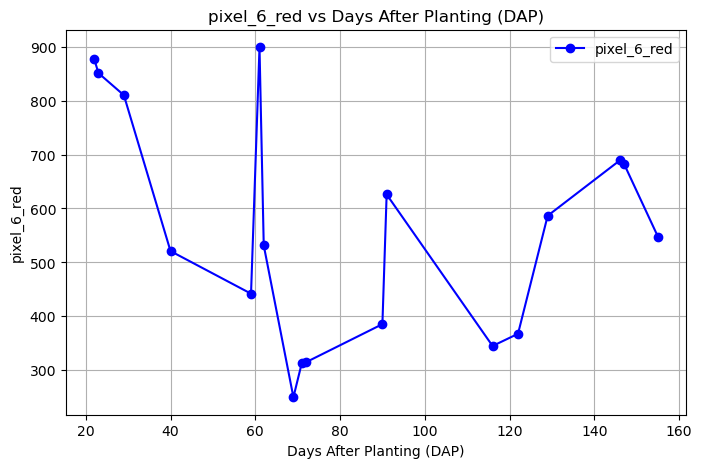

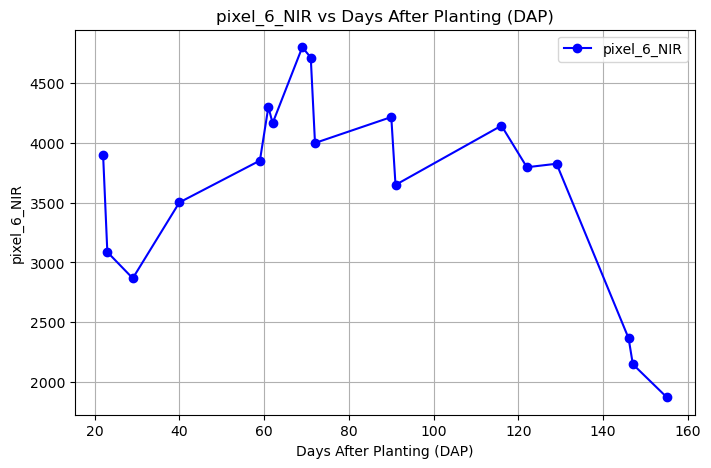

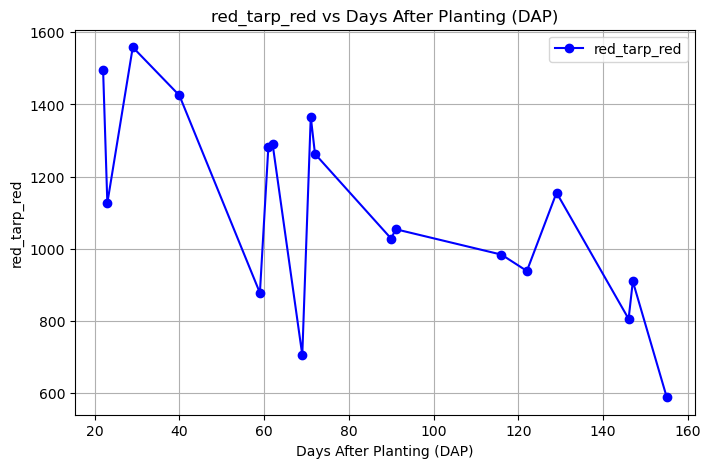

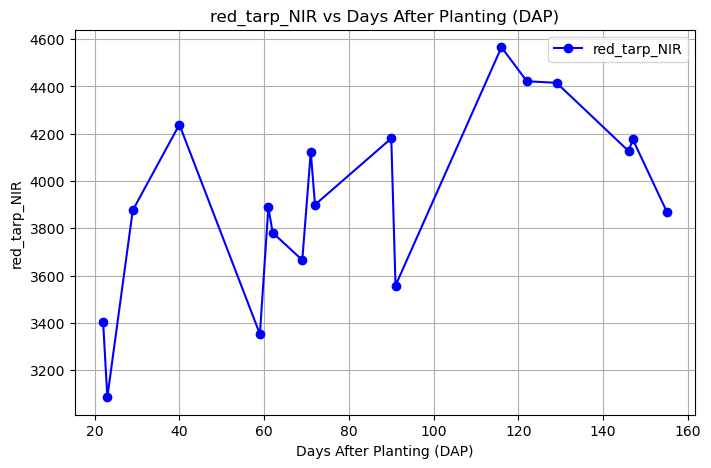

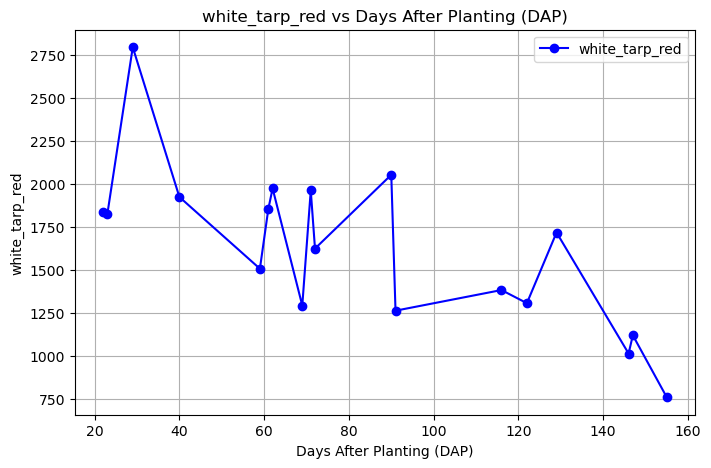

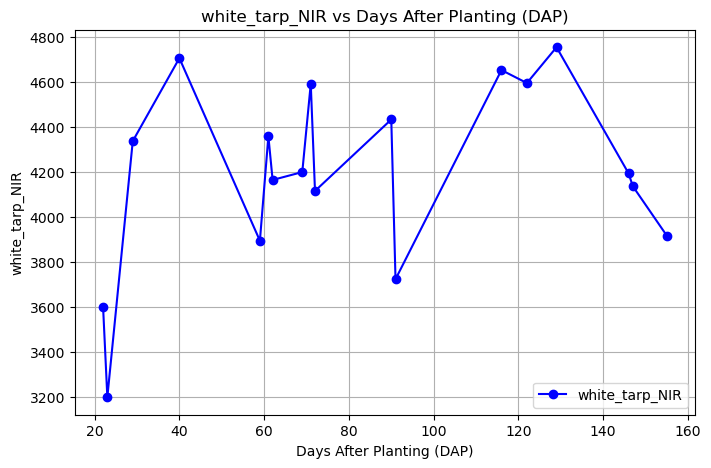

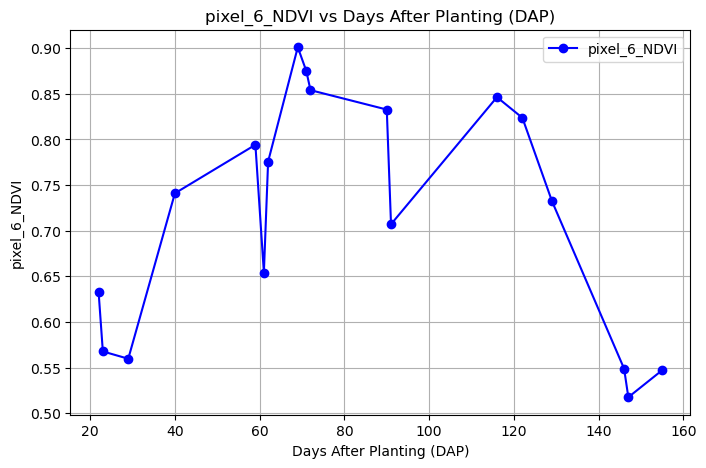

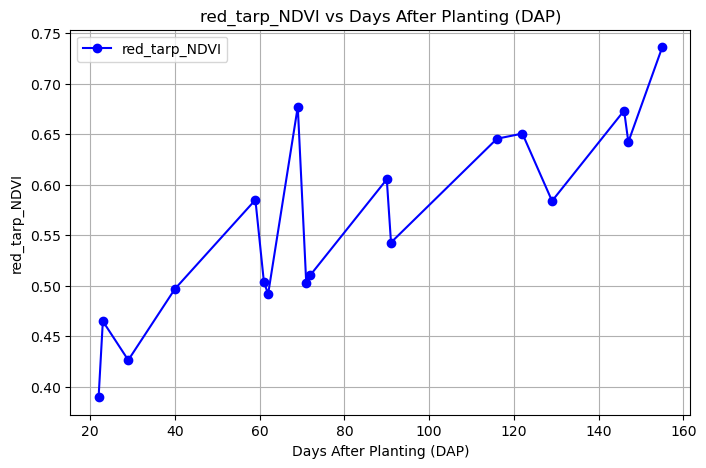

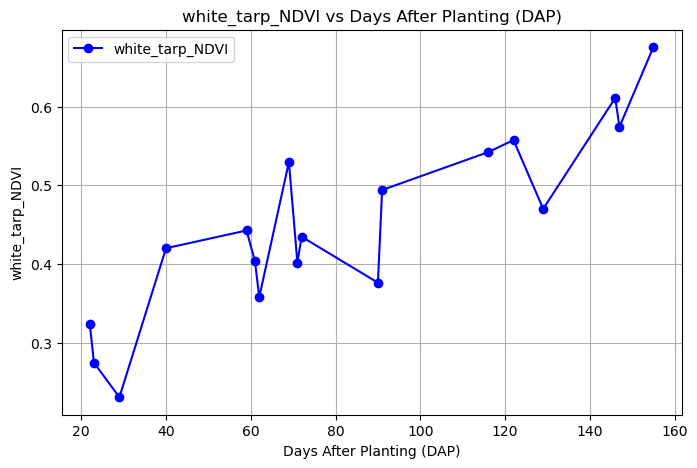

Plotting data for year: 2022.0


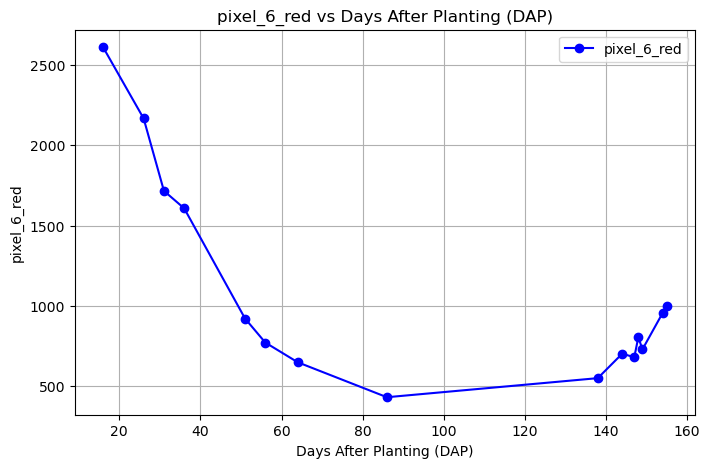

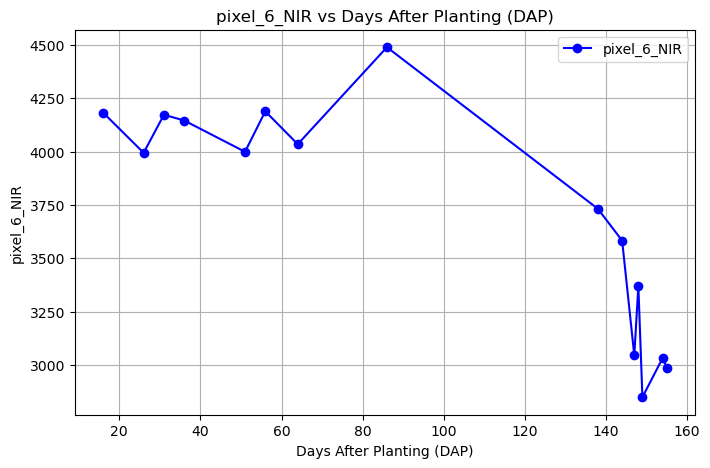

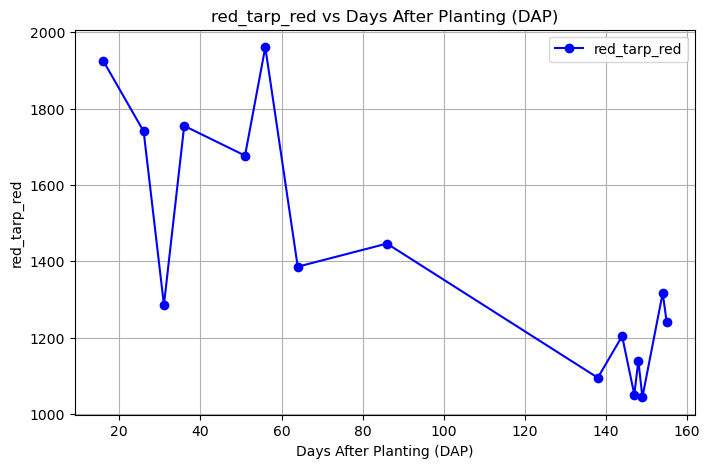

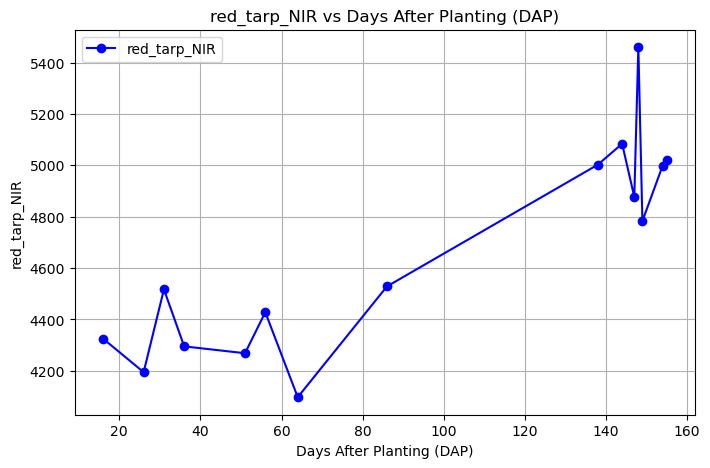

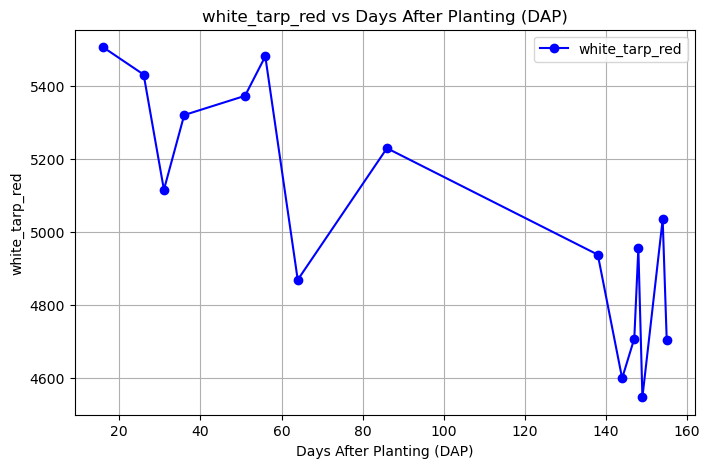

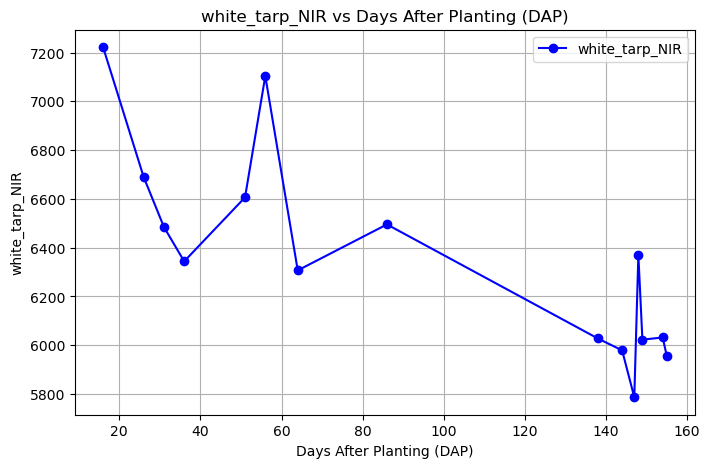

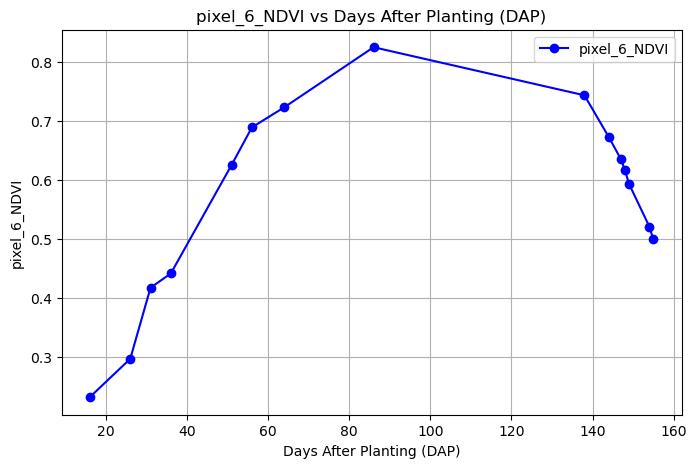

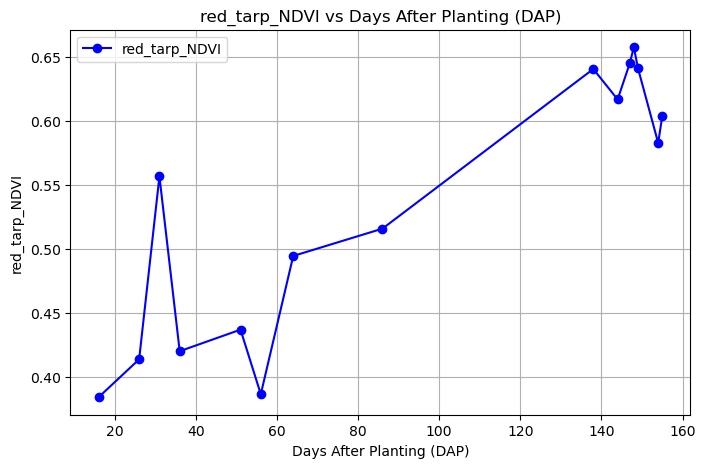

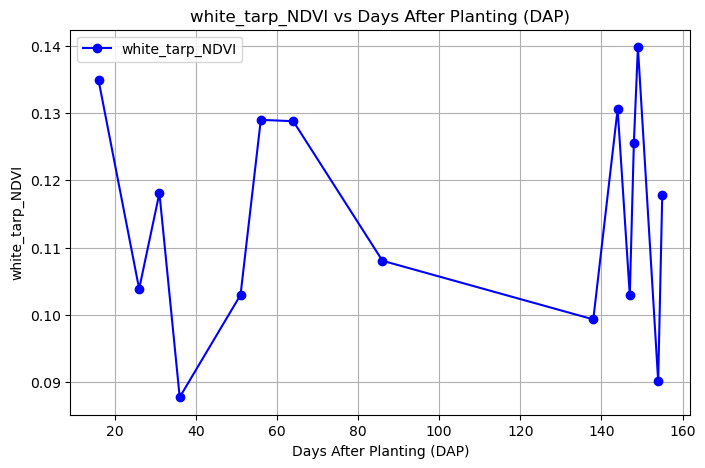

Plotting data for year: 2023.0


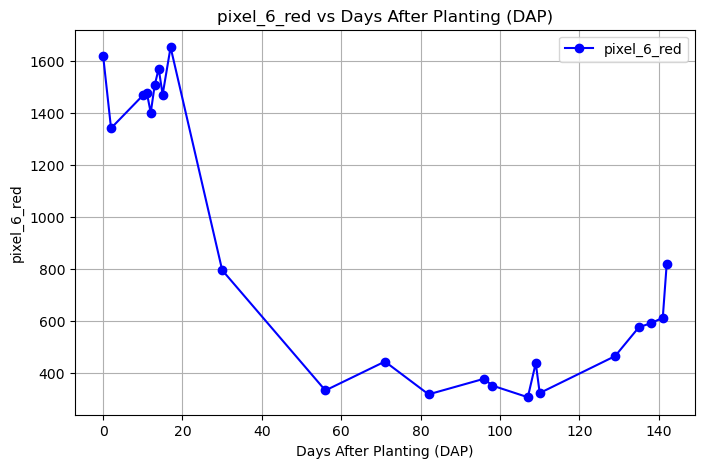

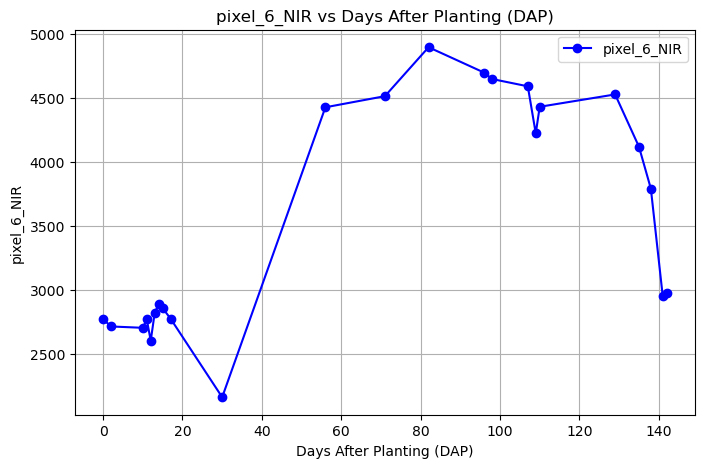

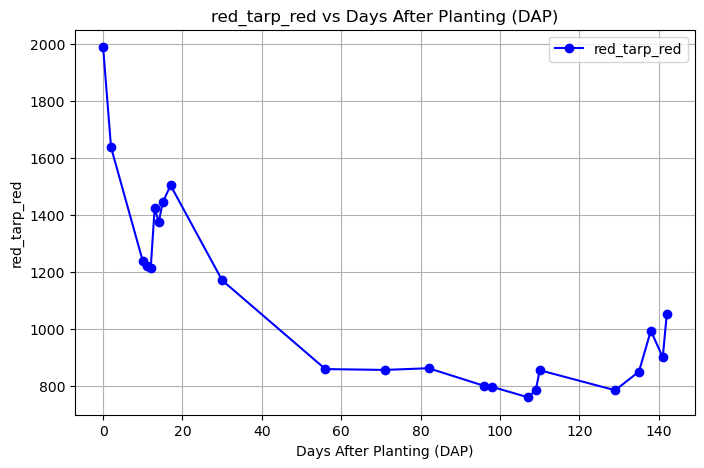

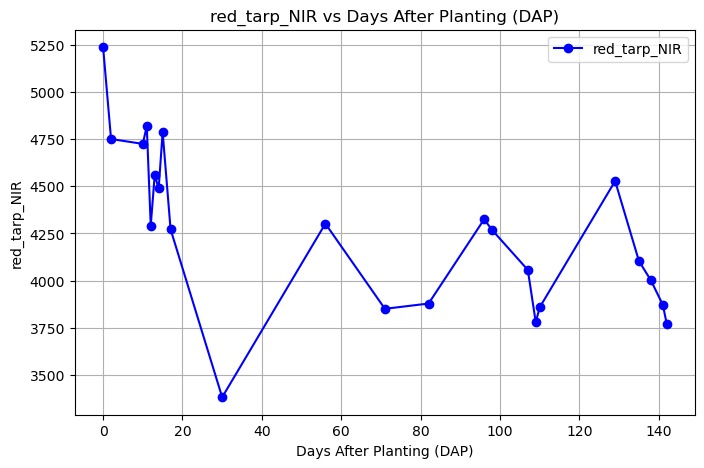

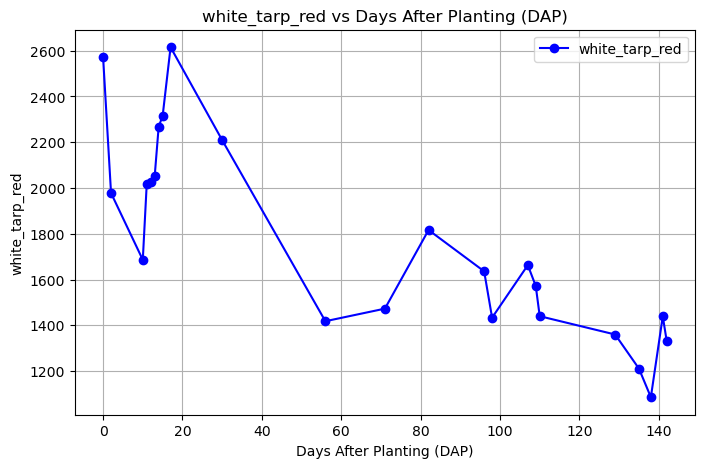

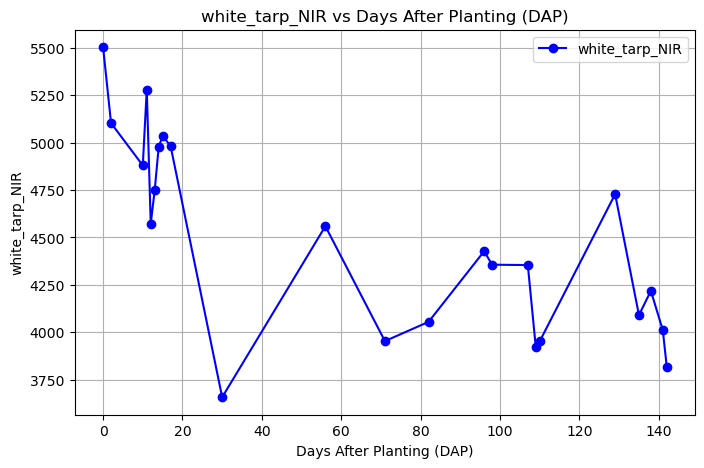

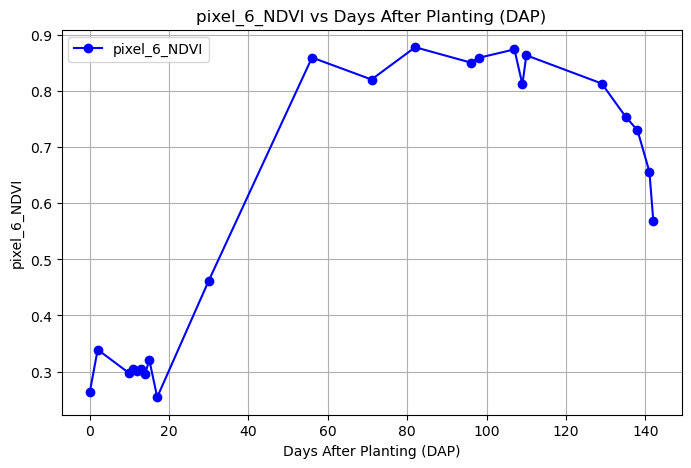

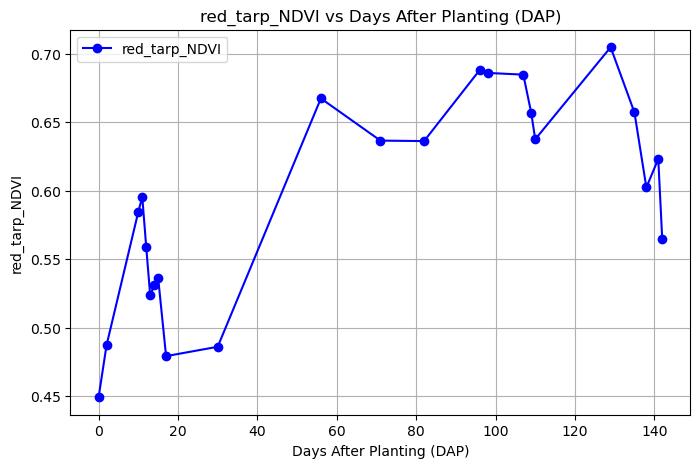

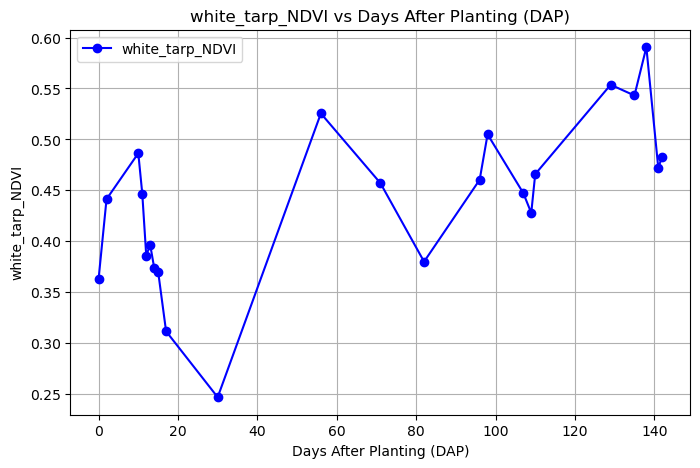

In [383]:
import matplotlib.pyplot as plt

# List of columns to plot
columns_to_plot = ['pixel_6_red', 'pixel_6_NIR', 'red_tarp_red', 'red_tarp_NIR', 'white_tarp_red', 'white_tarp_NIR','pixel_6_NDVI', 'red_tarp_NDVI', 'white_tarp_NDVI']

# Step 1: Create a plot for each column
for year in df_p6.year.unique():
    df_year = df_p6[df_p6['year'] == year]
    print(f"Plotting data for year: {year}")
    for column in columns_to_plot:
        plt.figure(figsize=(8, 5))  # Set the figure size
        plt.plot(df_year['days_after_planting'], df_year[column], marker='o', color='b', label=column)
        plt.title(f'{column} vs Days After Planting (DAP)')
        plt.xlabel('Days After Planting (DAP)')
        plt.ylabel(column)
        plt.grid(True)
        plt.legend()
        plt.show()



Plotting data for year: 2021.0


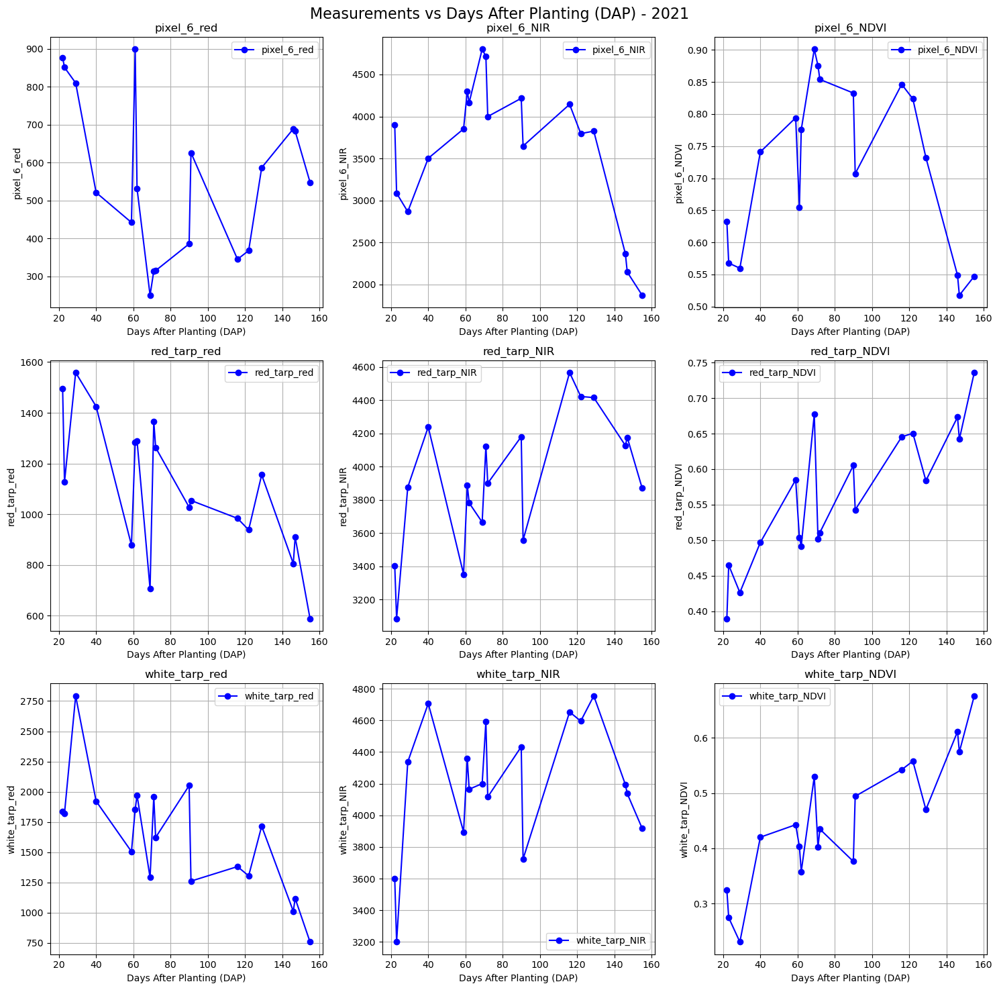

Plotting data for year: 2022.0


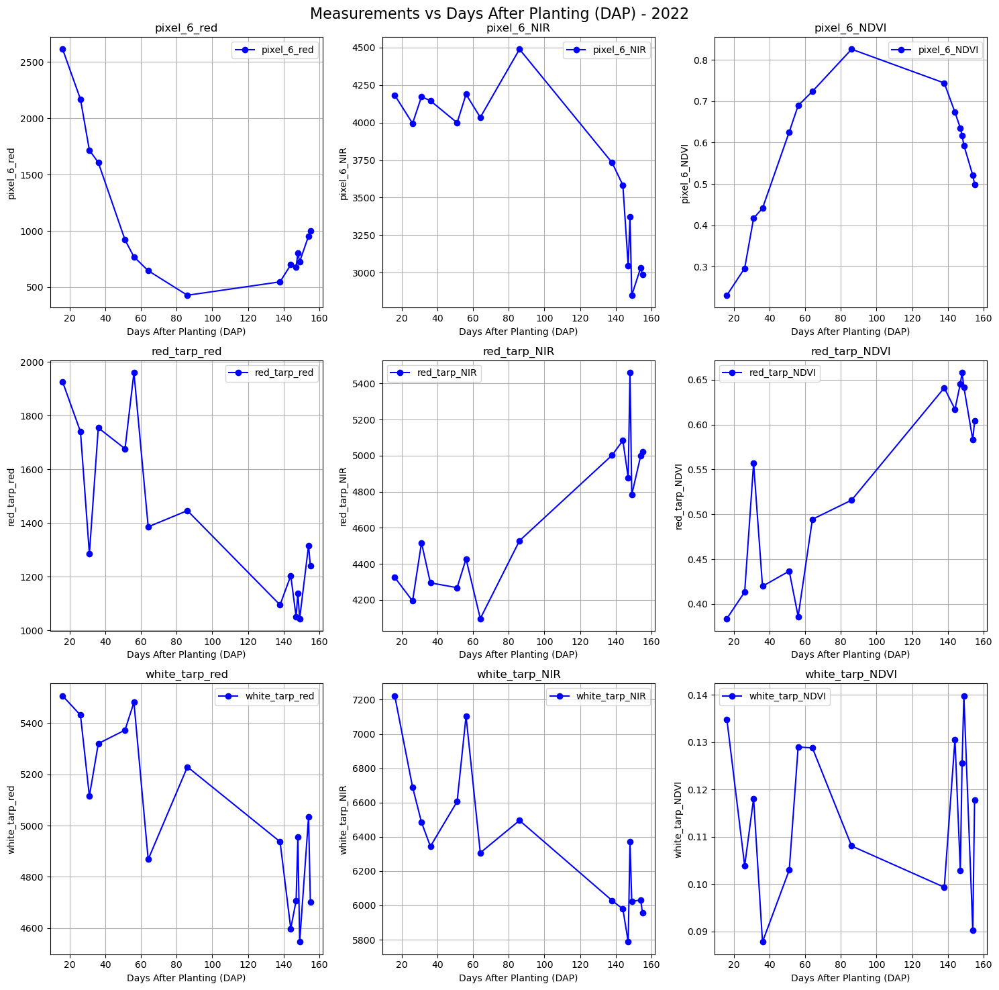

Plotting data for year: 2023.0


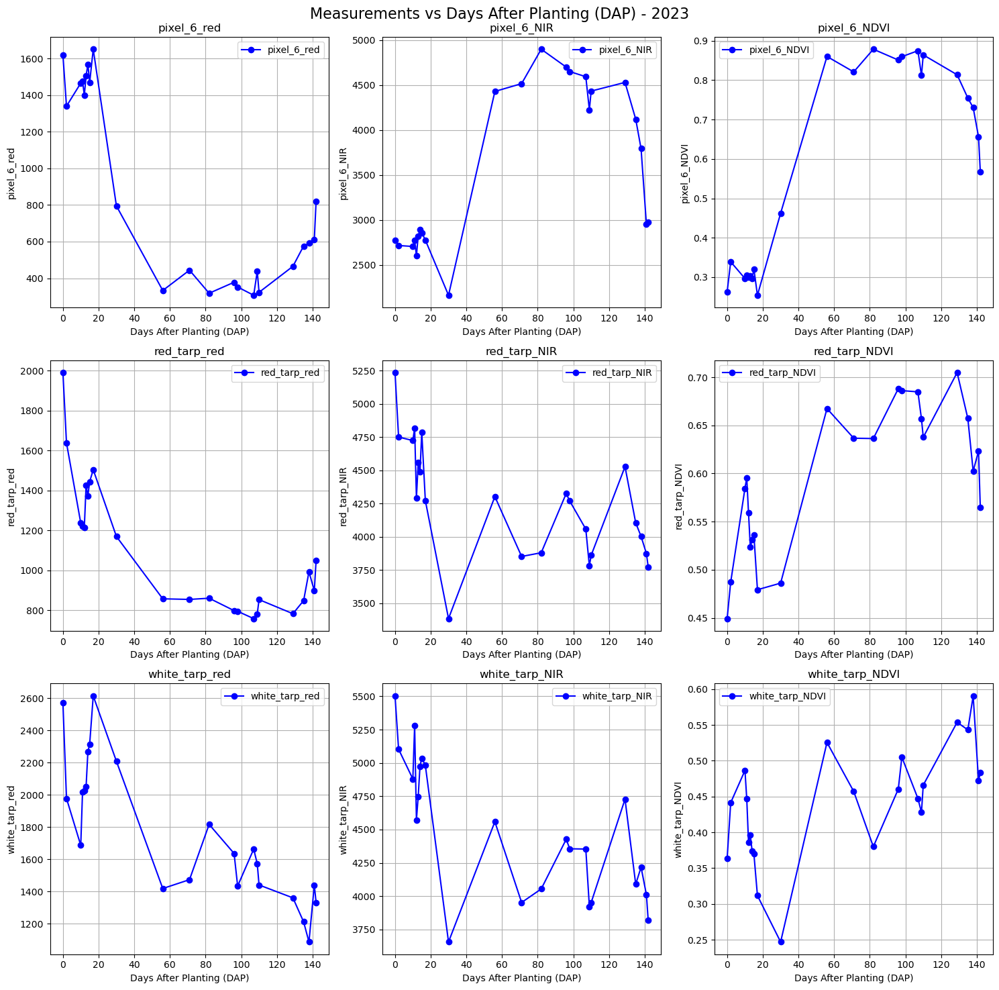

In [385]:
import matplotlib.pyplot as plt

# List of columns to plot
columns_to_plot = ['pixel_6_red', 'pixel_6_NIR', 'pixel_6_NDVI','red_tarp_red', 'red_tarp_NIR', 'red_tarp_NDVI','white_tarp_red', 
                  'white_tarp_NIR','white_tarp_NDVI']

# Create plots for each year
for year in df_p6.year.unique():
    df_year = df_p6[df_p6['year'] == year]
    print(f"Plotting data for year: {year}")
    
    # Create a 3x3 subplot figure
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    fig.suptitle(f'Measurements vs Days After Planting (DAP) - {int(year)}', fontsize=16)
    
    # Flatten axes array for easier iteration
    axes_flat = axes.flatten()
    
    # Plot each column in its subplot
    for idx, column in enumerate(columns_to_plot):
        ax = axes_flat[idx]
        ax.plot(df_year['days_after_planting'], df_year[column], 
                marker='o', color='b', label=column)
        ax.set_title(column)
        ax.set_xlabel('Days After Planting (DAP)')
        ax.set_ylabel(column)
        ax.grid(True)
        ax.legend()
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    
    # Save the figure
    plt.savefig(f'D:/Capstone/Data/main_data/plots_{int(year)}.png', dpi=600, bbox_inches='tight')
    plt.show()

In [ ]:
## Scaling
df_p6_scaled = df_p6# List of columns to divide
cols_to_scale = [
    'pixel_6_red', 'pixel_6_NIR',
    'red_tarp_red', 'red_tarp_NIR',
    'white_tarp_red', 'white_tarp_NIR'
]

# Divide each by 10000
df_p6_scaled[cols_to_scale] = df_p6_scaled[cols_to_scale] / 10000
# df_p6_scaled.to_csv('D:/Capstone/Data/main_data/pixel_6_scaled.csv', index=False)

In [387]:
output1 = widgets.Output()
with output1:
    display(df_p6_scaled)
    display(df_p6_scaled.shape)
output2 = widgets.Output()
with output2:
    display(df_p6)
    display(df_p6.shape)
two_columns = widgets.HBox([output1, output2])
display(two_columns)

Plotting data for year: 2021.0


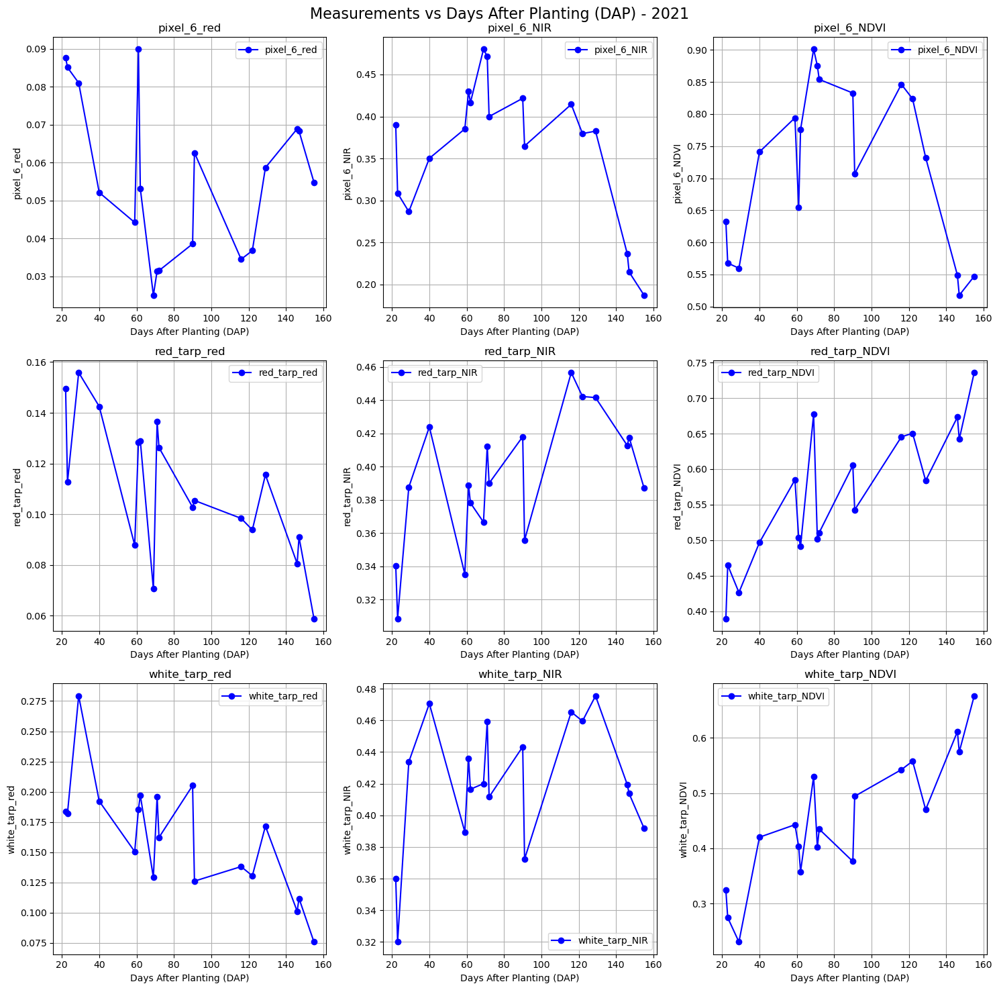

Plotting data for year: 2022.0


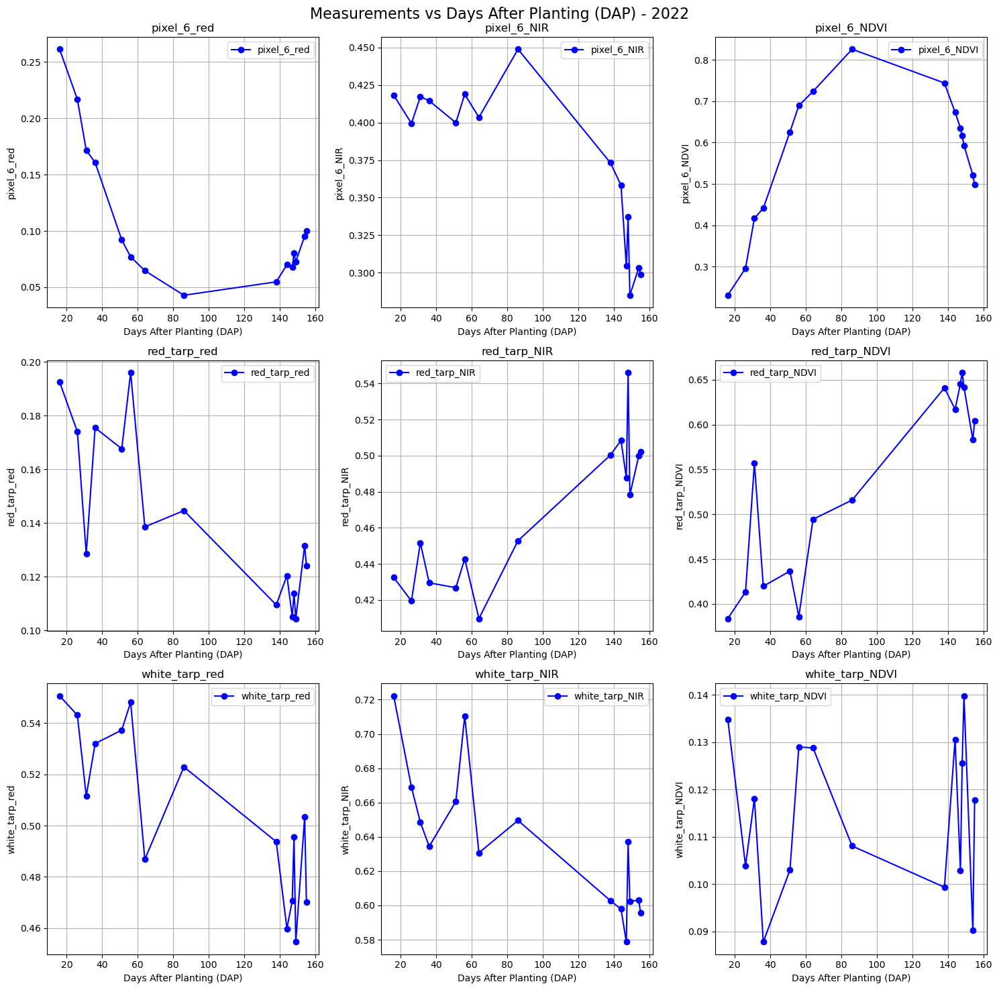

Plotting data for year: 2023.0


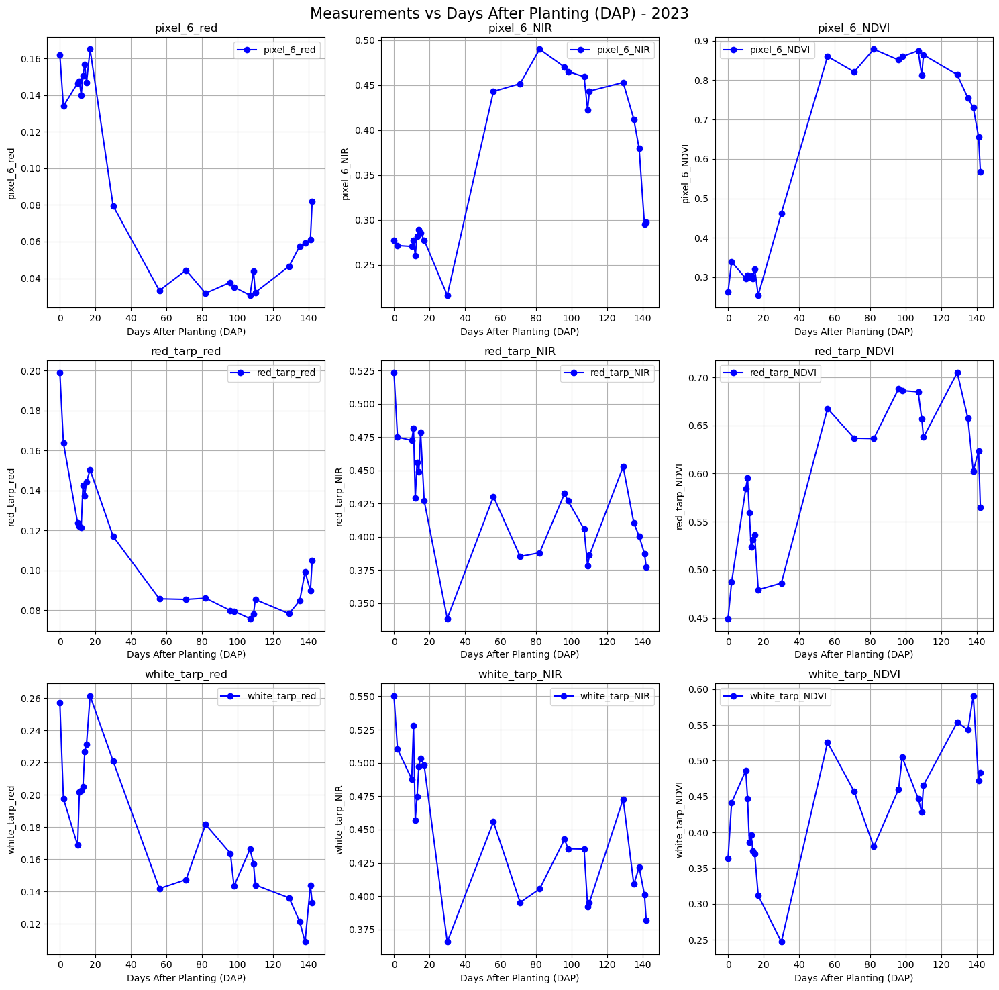

In [388]:
import matplotlib.pyplot as plt

# List of columns to plot
columns_to_plot = ['pixel_6_red', 'pixel_6_NIR', 'pixel_6_NDVI','red_tarp_red', 'red_tarp_NIR', 'red_tarp_NDVI','white_tarp_red', 
                  'white_tarp_NIR','white_tarp_NDVI']

# Create plots for each year
for year in df_p6_scaled.year.unique():
    df_year = df_p6_scaled[df_p6_scaled['year'] == year]
    print(f"Plotting data for year: {year}")
    
    # Create a 3x3 subplot figure
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    fig.suptitle(f'Measurements vs Days After Planting (DAP) - {int(year)}', fontsize=16)
    
    # Flatten axes array for easier iteration
    axes_flat = axes.flatten()
    
    # Plot each column in its subplot
    for idx, column in enumerate(columns_to_plot):
        ax = axes_flat[idx]
        ax.plot(df_year['days_after_planting'], df_year[column], 
                marker='o', color='b', label=column)
        ax.set_title(column)
        ax.set_xlabel('Days After Planting (DAP)')
        ax.set_ylabel(column)
        ax.grid(True)
        ax.legend()
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    
    # Save the figure
    plt.savefig(f'D:/Capstone/Data/main_data/plots_{int(year)}_scaled.png', dpi=600, bbox_inches='tight')
    plt.show()

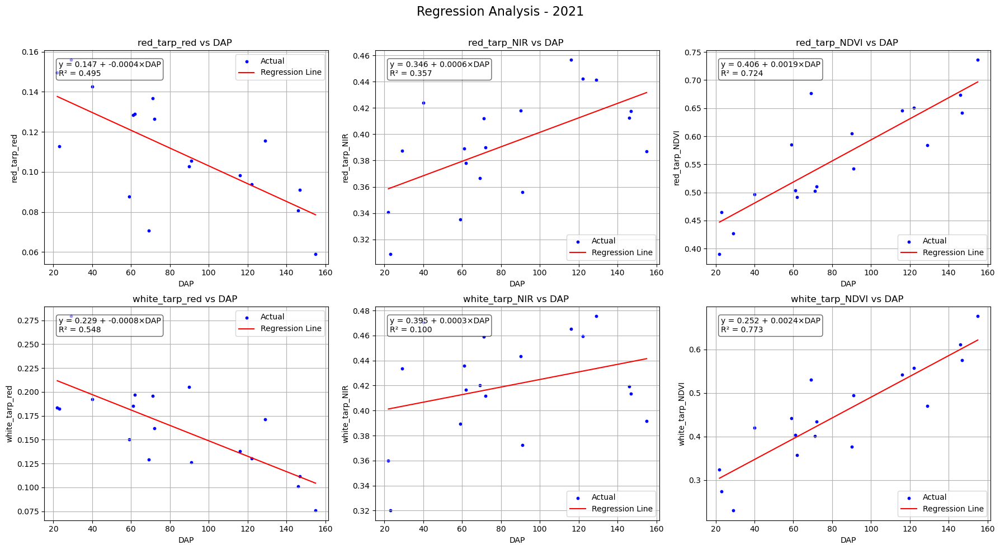

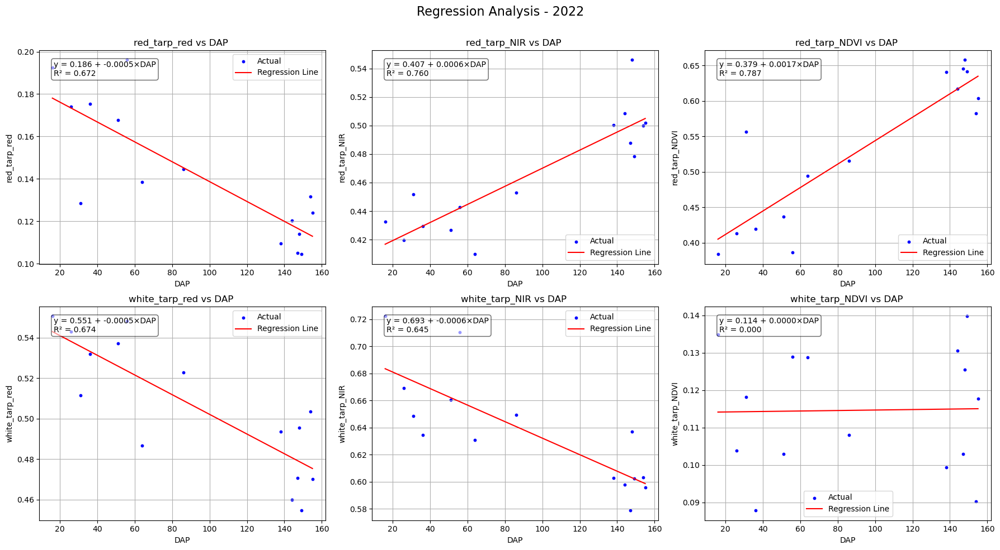

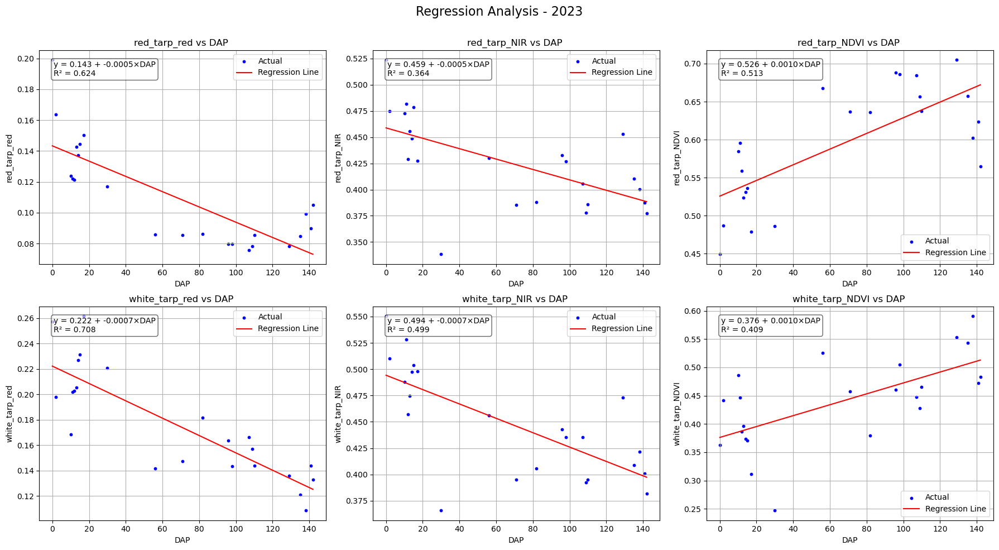

In [415]:
import matplotlib.pyplot as plt

# Desired order: indices of dependent_columns in this new layout
custom_order = [0,1,2,3,4,5]

# Create plots for each year
for year in df_p6_scaled.year.unique():
    # Filter data for current year
    df_year = df_p6_scaled[df_p6_scaled['year'] == year]
    
    # Run regressions for this year's data
    regression_results_year = {}
    for col in dependent_columns:
        X = df_year[['days_after_planting']]
        X = sm.add_constant(X)
        y = df_year[col]
        model = sm.OLS(y, X).fit()
        regression_results_year[col] = model
    
    # Create subplot figure
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    fig.suptitle(f'Regression Analysis - {int(year)}', fontsize=16)
    axes = axes.flatten()
    # plt.subplots_adjust(top=0.88)  # Adjust this value as needed

    # Create plots
    for plot_idx, col_idx in enumerate(custom_order):
        if col_idx >= len(dependent_columns):
            fig.delaxes(axes[plot_idx])
            continue

        col = dependent_columns[col_idx]
        ax = axes[plot_idx]

        # Predictions
        X = df_year[['days_after_planting']]
        X_const = sm.add_constant(X)
        y_true = df_year[col]
        y_pred = regression_results_year[col].predict(X_const)

        # Scatter plot
        ax.scatter(df_year['days_after_planting'], y_true, color='blue', label='Actual', s=10)

        # Regression line
        sorted_idx = df_year['days_after_planting'].argsort()
        ax.plot(df_year['days_after_planting'].iloc[sorted_idx], 
                y_pred.iloc[sorted_idx], color='red', label='Regression Line')
        model_current = regression_results_year[col]
        intercept = model_current.params['const']
        slope = model_current.params['days_after_planting']
        r_squared = model_current.rsquared

        equation = f"y = {intercept:.3f} + {slope:.4f}×DAP\nR² = {r_squared:.3f}"
        ax.text(0.05, 0.95, equation, transform=ax.transAxes,
                fontsize=10, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.6))

        ax.set_title(f'{col} vs DAP ')
        ax.set_xlabel('DAP')
        ax.set_ylabel(col)
        ax.grid(True)
        ax.legend()

    plt.tight_layout()
    plt.subplots_adjust(top=0.90)
    
    # Save figure for each year
    plt.savefig(f'D:/Capstone/Data/main_data/tarp_regression_plots_{int(year)}.png', dpi=600, bbox_inches='tight')
    plt.show()

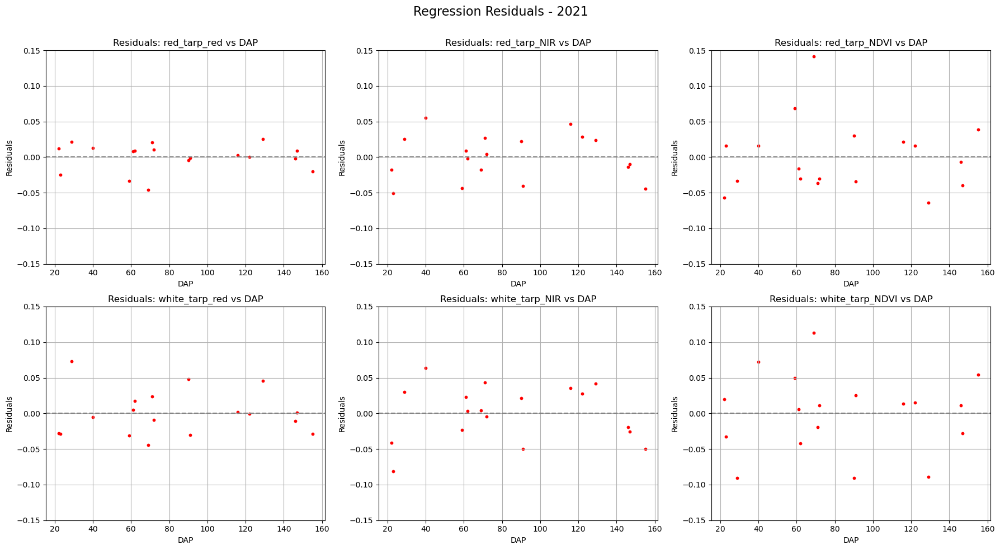

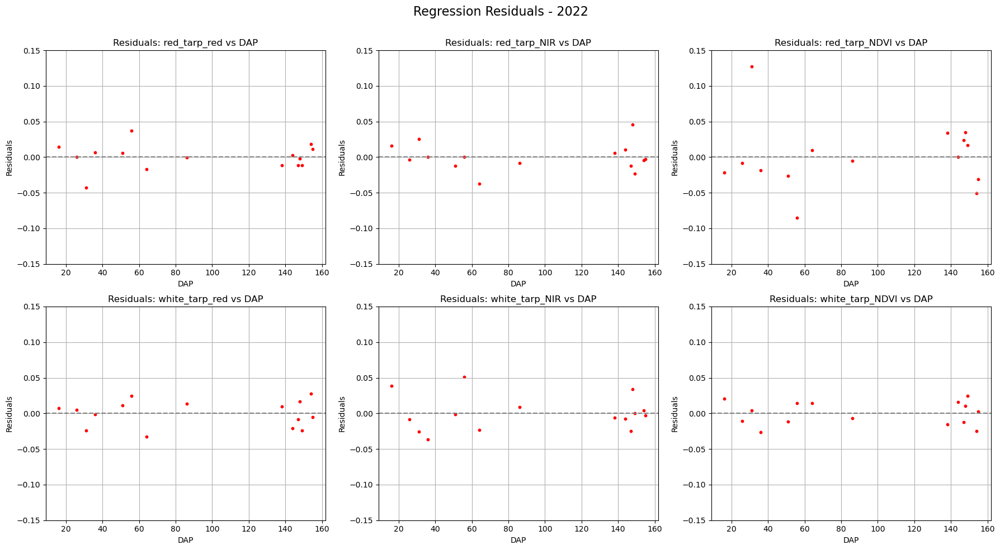

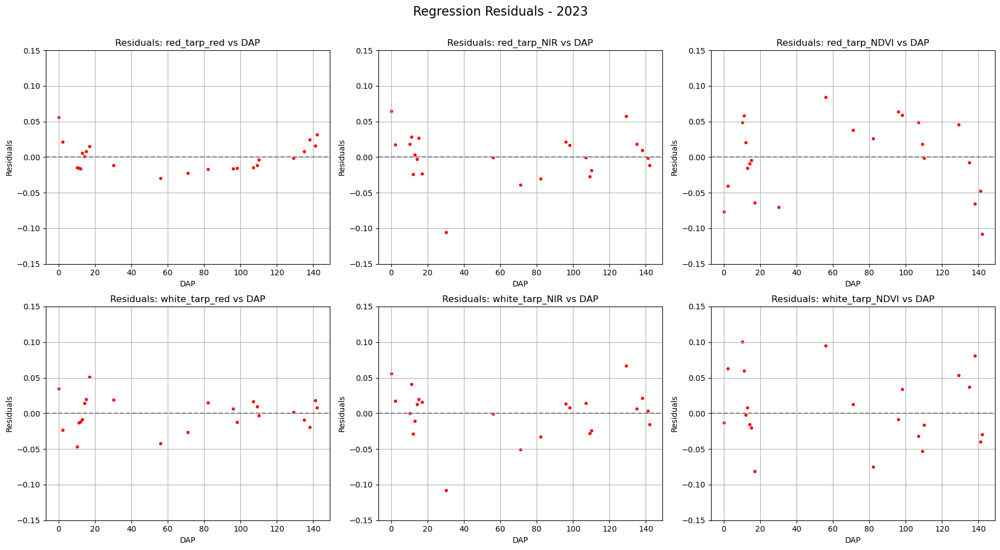

In [ ]:
# Desired order: indices of dependent_columns in this new layout
custom_order = [0,1,2,3,4,5]

# Create plots for each year
for year in df_p6_scaled.year.unique():
    # Filter data for current year
    df_year = df_p6_scaled[df_p6_scaled['year'] == year]
    
    # Run regressions for this year's data
    regression_results_year = {}
    for col in dependent_columns:
        X = df_year[['days_after_planting']]
        X = sm.add_constant(X)
        y = df_year[col]
        model = sm.OLS(y, X).fit()
        regression_results_year[col] = model
    
    # # Create subplot figure
    # fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    # fig.suptitle(f'Regression Analysis - {int(year)}', fontsize=16)
    # axes = axes.flatten()
    # plt.subplots_adjust(top=0.88)  # Adjust this value as needed
    # Residual plots for each year
    fig_resid, axes_resid = plt.subplots(2, 3, figsize=(18, 10))
    fig_resid.suptitle(f'Regression Residuals - {int(year)}', fontsize=16)
    axes_resid = axes_resid.flatten()
    # plt.subplots_adjust(top=0.88)

    for plot_idx, col_idx in enumerate(custom_order):
        if col_idx >= len(dependent_columns):
            fig_resid.delaxes(axes_resid[plot_idx])
            continue

        col = dependent_columns[col_idx]
        ax_resid = axes_resid[plot_idx]

        # Data and model
        X = df_year[['days_after_planting']]
        X_const = sm.add_constant(X)
        y_true = df_year[col]
        model_current = regression_results_year[col]
        y_pred = model_current.predict(X_const)

        # Residuals
        residuals = y_true - y_pred

        # Scatter plot of residuals
        ax_resid.scatter(df_year['days_after_planting'], residuals, color='red', s=10)
        ax_resid.axhline(0, color='gray', linestyle='--')  # Zero line
        ax_resid.set_ylim(-0.15, 0.15)

        # Titles and labels
        ax_resid.set_title(f'Residuals: {col} vs DAP')
        ax_resid.set_xlabel('DAP')
        ax_resid.set_ylabel('Residuals')
        ax_resid.grid(True)

    plt.tight_layout()
    plt.subplots_adjust(top=0.90)

    # Optional: Save residual plot figure
    plt.savefig(f'D:/Capstone/Data/main_data/tarp_residual_plots_{int(year)}.png', dpi=600, bbox_inches='tight')
    plt.show()


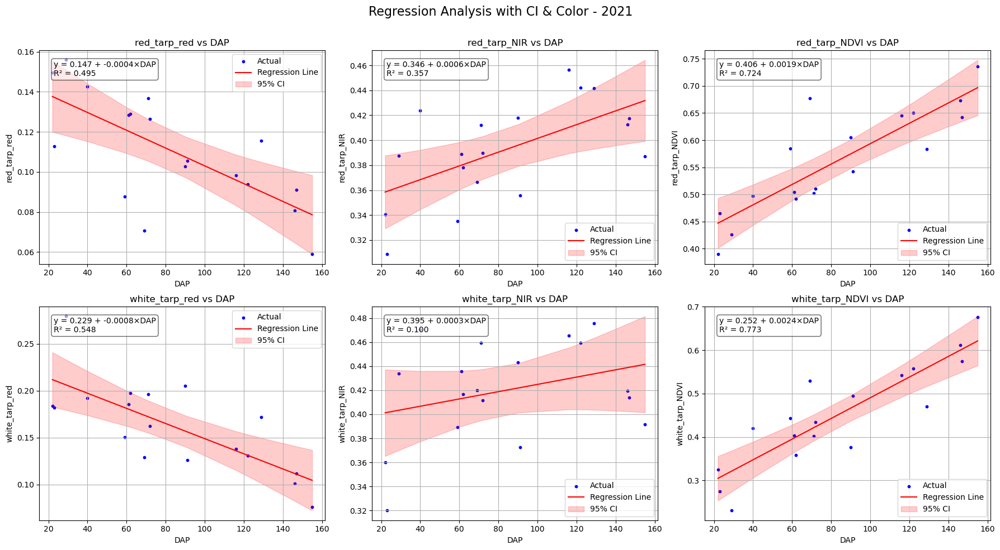

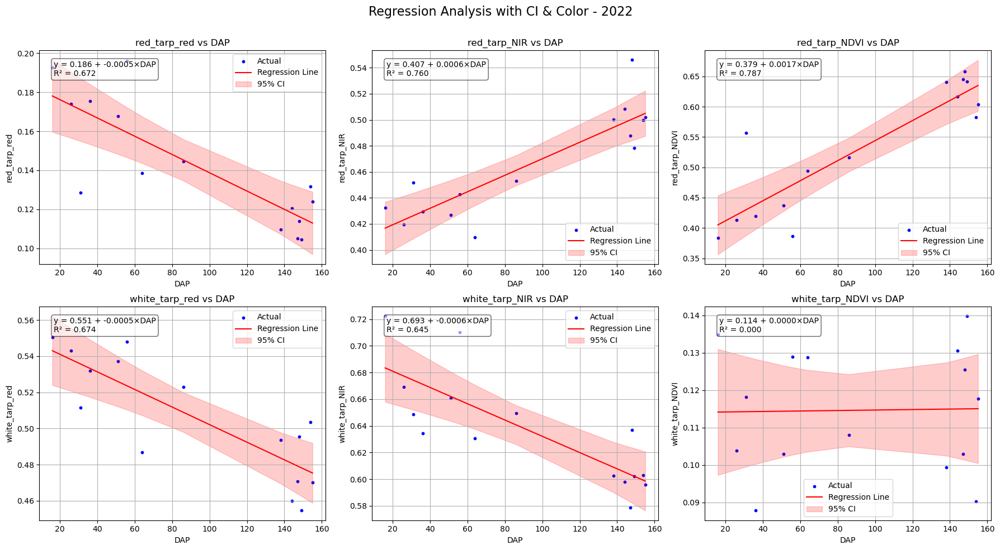

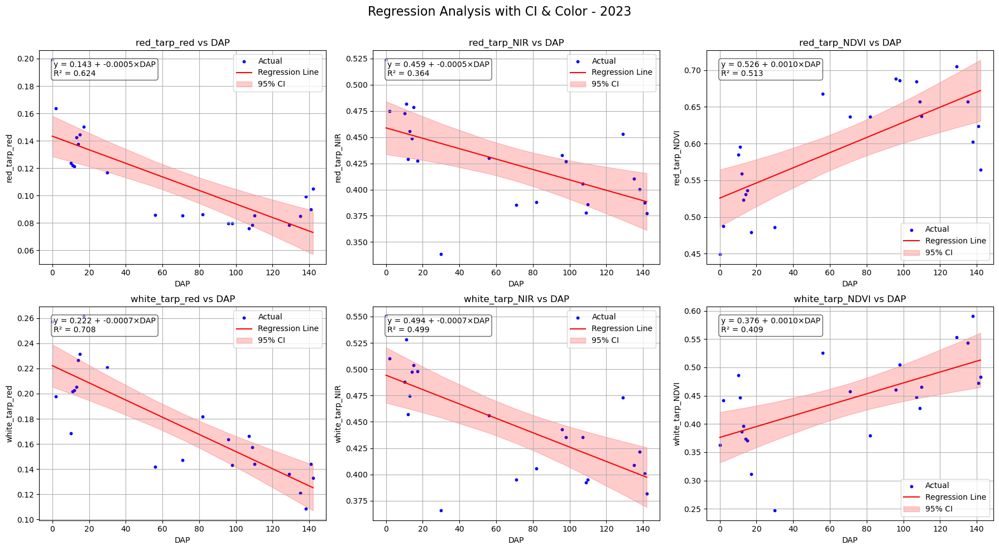

In [426]:
import matplotlib.pyplot as plt
import statsmodels.api as sm
import seaborn as sns
import numpy as np
from scipy import stats

custom_order = [0, 1, 2, 3, 4, 5]

# Create plots for each year
for year in df_p6_scaled.year.unique():
    df_year = df_p6_scaled[df_p6_scaled['year'] == year]

    # Fit regression models for this year
    regression_results_year = {}
    for col in dependent_columns:
        X = df_year[['days_after_planting']]
        X_const = sm.add_constant(X)
        y = df_year[col]
        model = sm.OLS(y, X_const).fit()
        regression_results_year[col] = model

    # Create figure and axes
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    axes = axes.flatten()
    fig.suptitle(f'Regression Analysis with CI & Color - {int(year)}', fontsize=16)

    for plot_idx, col_idx in enumerate(custom_order):
        if col_idx >= len(dependent_columns):
            fig.delaxes(axes[plot_idx])
            continue

        col = dependent_columns[col_idx]
        ax = axes[plot_idx]

        # Data & model
        X = df_year[['days_after_planting']]
        X_const = sm.add_constant(X)
        y_true = df_year[col]
        model_current = regression_results_year[col]
        y_pred = model_current.predict(X_const)

        # Prediction summary for CI
        pred = model_current.get_prediction(X_const)
        pred_summary = pred.summary_frame(alpha=0.05)

        sorted_idx = df_year['days_after_planting'].argsort()
        x_sorted = df_year['days_after_planting'].iloc[sorted_idx]
        ci_lower = pred_summary['mean_ci_lower'].iloc[sorted_idx]
        ci_upper = pred_summary['mean_ci_upper'].iloc[sorted_idx]

        # Color by 'plot_size' if exists
        color_var = 'plot_size'
        if color_var in df_year.columns:
            scatter = ax.scatter(
                df_year['days_after_planting'],
                y_true,
                c=df_year[color_var],
                cmap='viridis',
                label='Actual',
                s=20
            )
            plt.colorbar(scatter, ax=ax, label=color_var)
        else:
            ax.scatter(df_year['days_after_planting'], y_true, color='blue', s=10, label='Actual')

        # Regression line and CI
        ax.plot(x_sorted, y_pred.iloc[sorted_idx], color='red', label='Regression Line')
        ax.fill_between(x_sorted, ci_lower, ci_upper, color='red', alpha=0.2, label='95% CI')

        # Equation and R²
        intercept = model_current.params['const']
        slope = model_current.params['days_after_planting']
        r_squared = model_current.rsquared
        equation = f"y = {intercept:.3f} + {slope:.4f}×DAP\nR² = {r_squared:.3f}"

        ax.text(0.05, 0.95, equation, transform=ax.transAxes,
                fontsize=10, verticalalignment='top',
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.6))

        ax.set_title(f'{col} vs DAP')
        ax.set_xlabel('DAP')
        ax.set_ylabel(col)
        ax.grid(True)
        ax.legend()

    plt.tight_layout()
    plt.subplots_adjust(top=0.90)
    plt.savefig(f'D:/Capstone/Data/main_data/tarp_regression_CI_plots_{int(year)}.png', dpi=600, bbox_inches='tight')

    plt.show()


c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


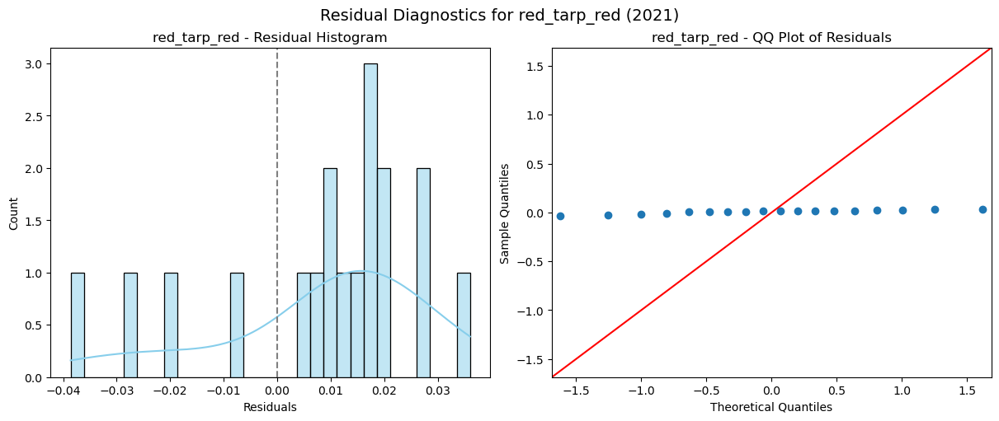

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


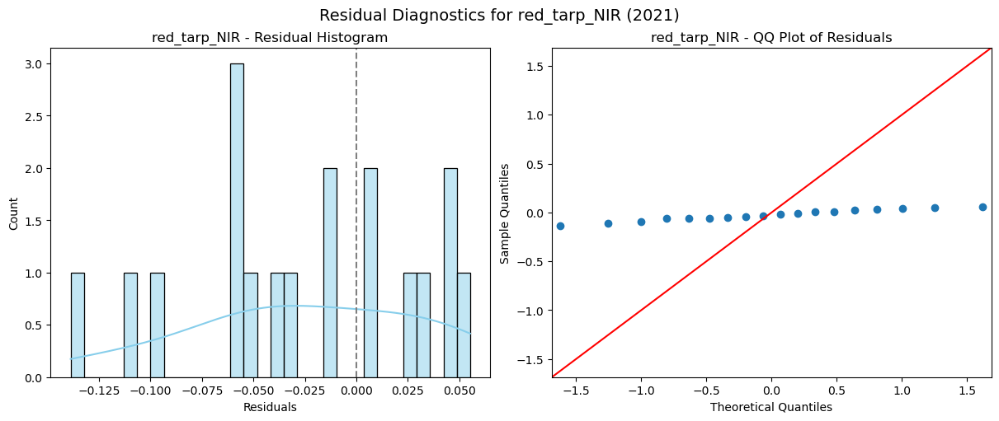

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


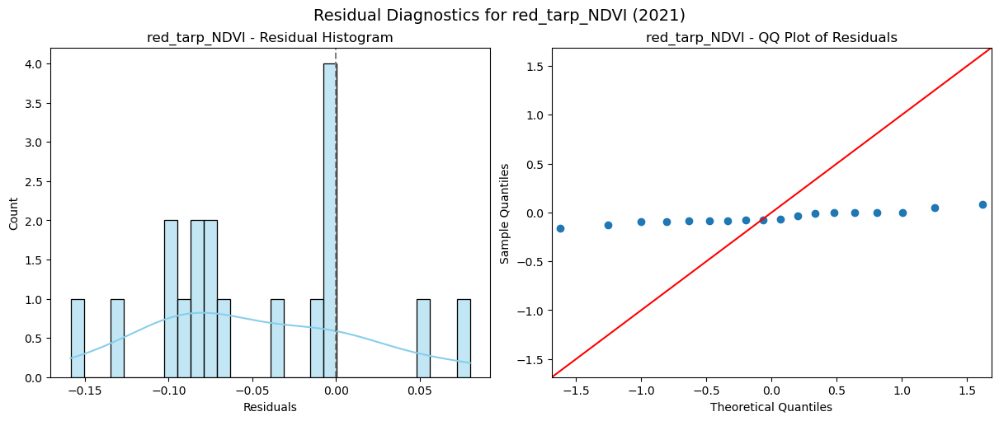

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


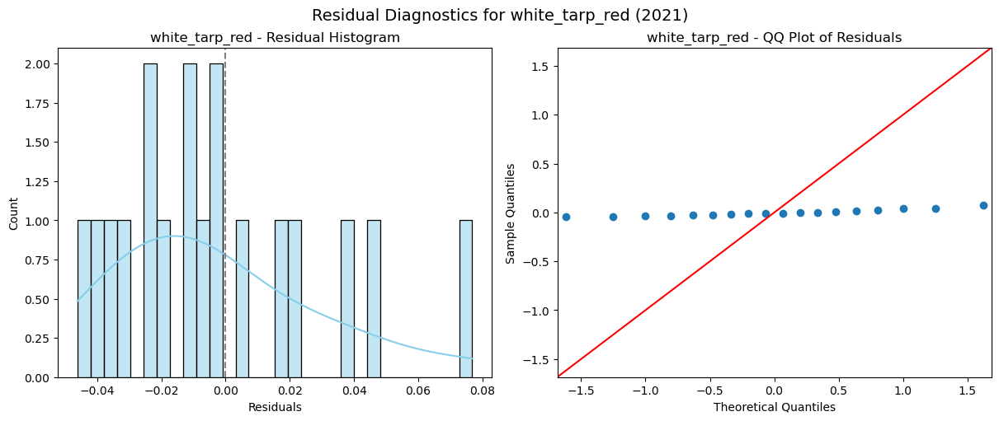

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


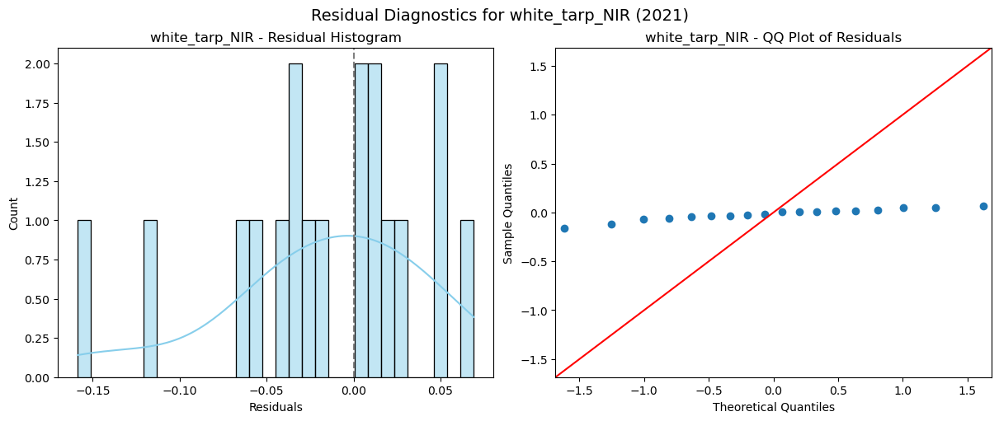

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


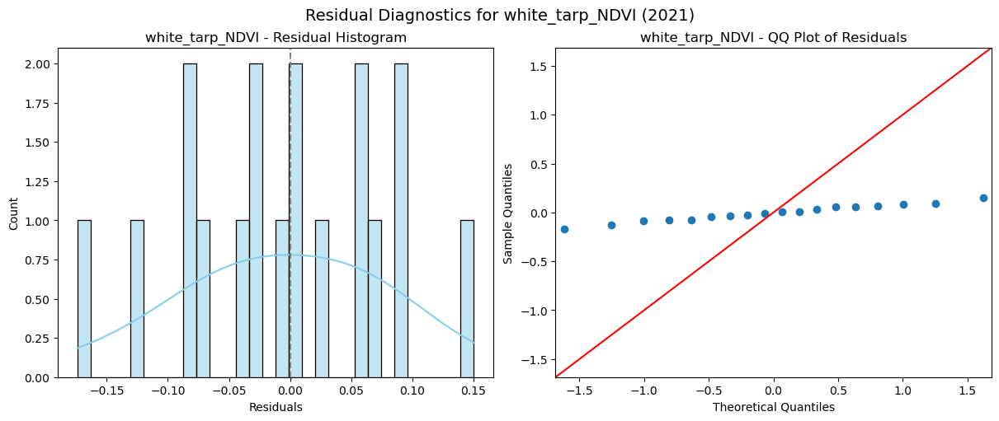

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


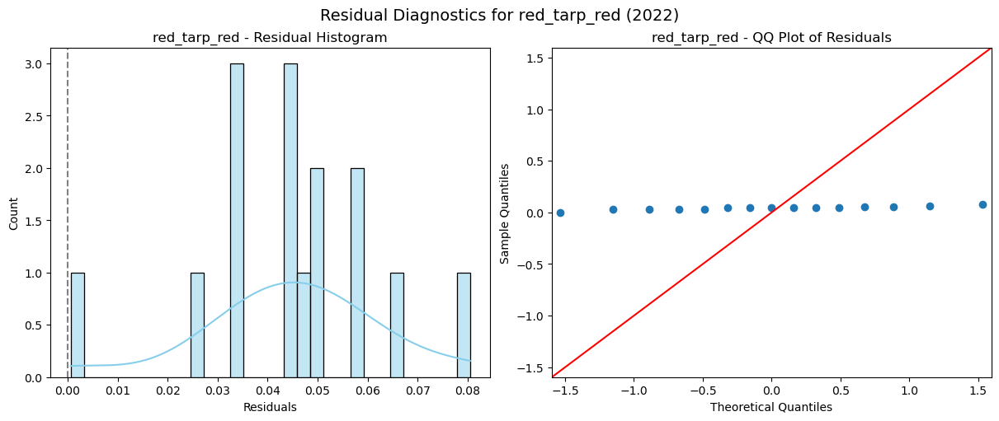

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


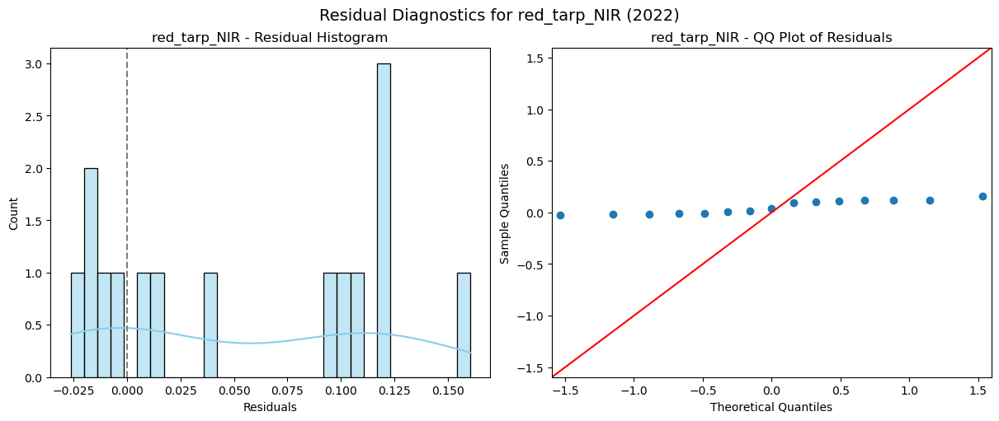

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


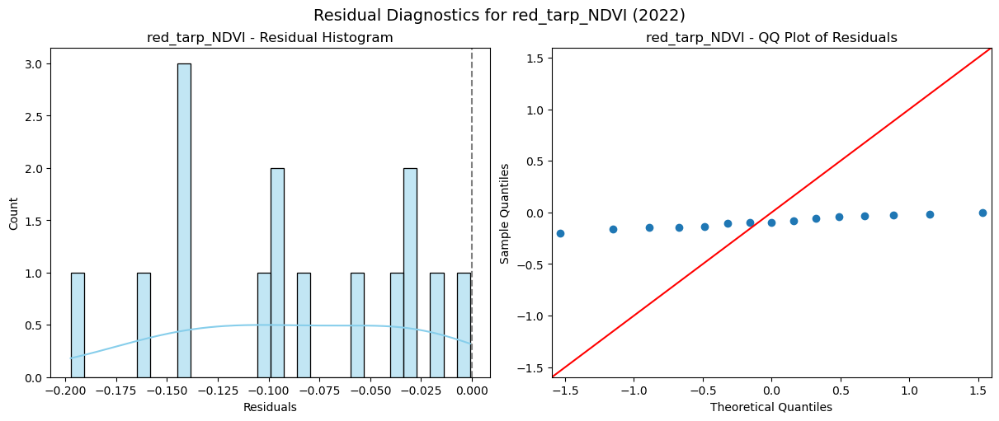

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


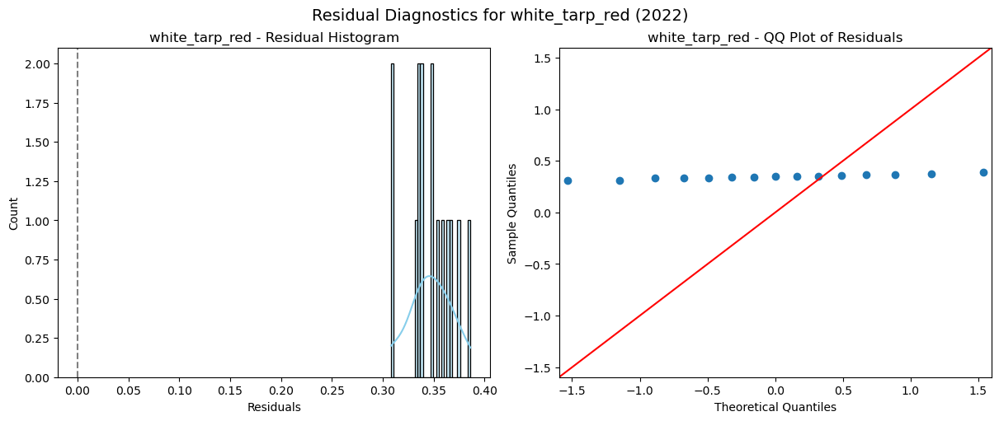

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


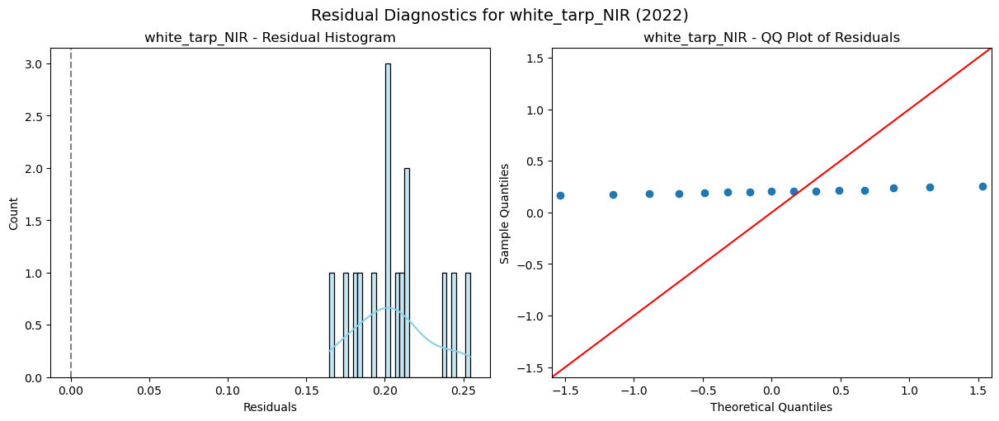

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


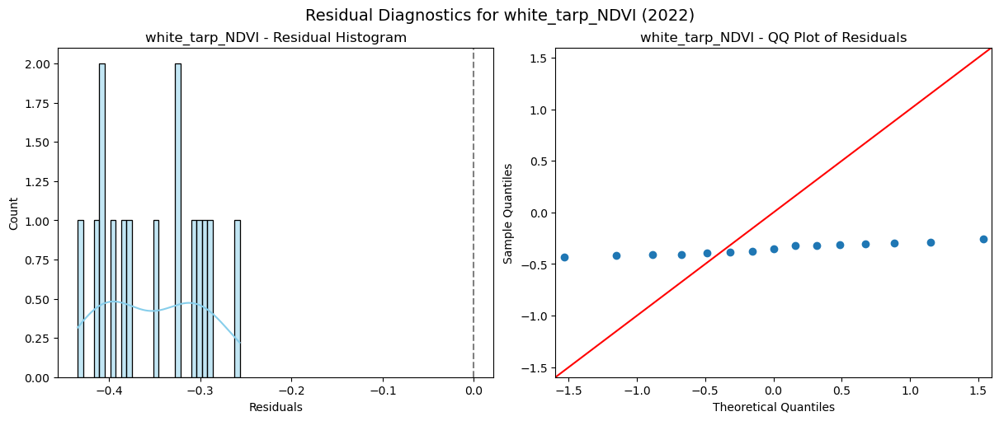

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


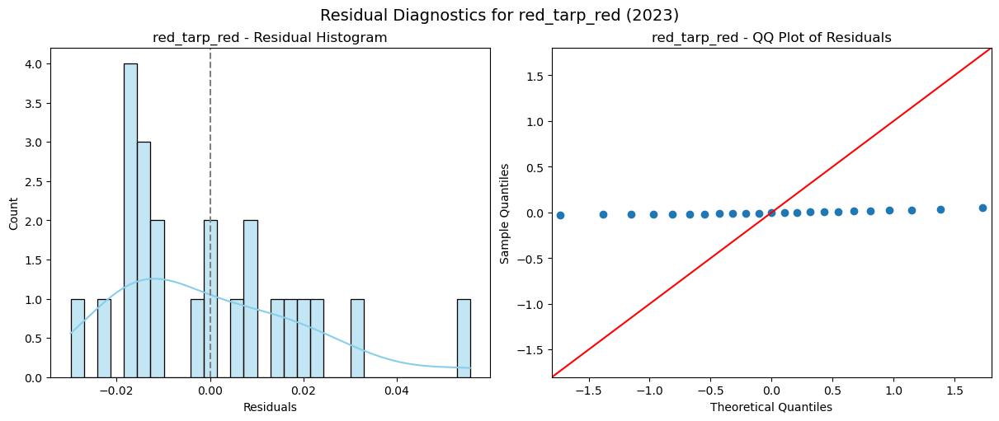

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


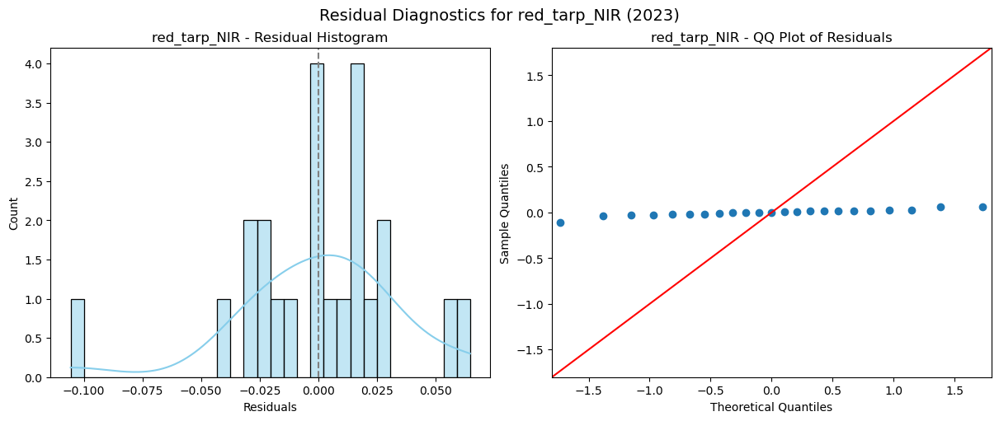

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


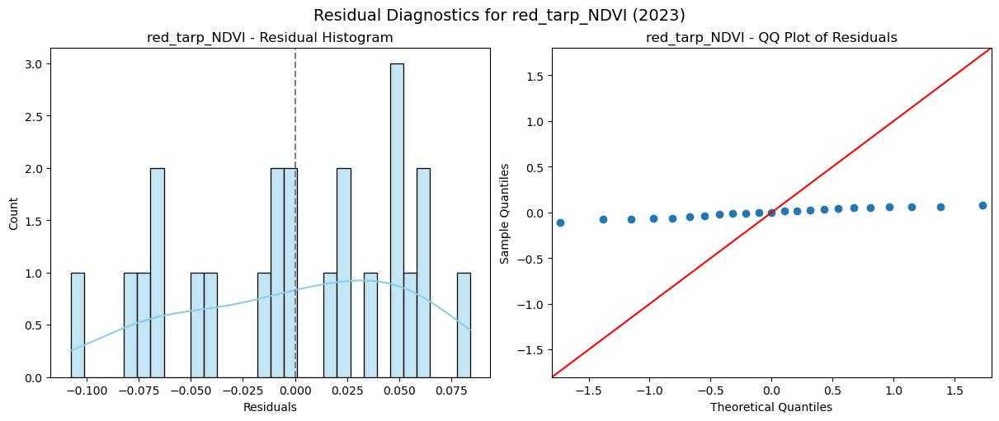

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


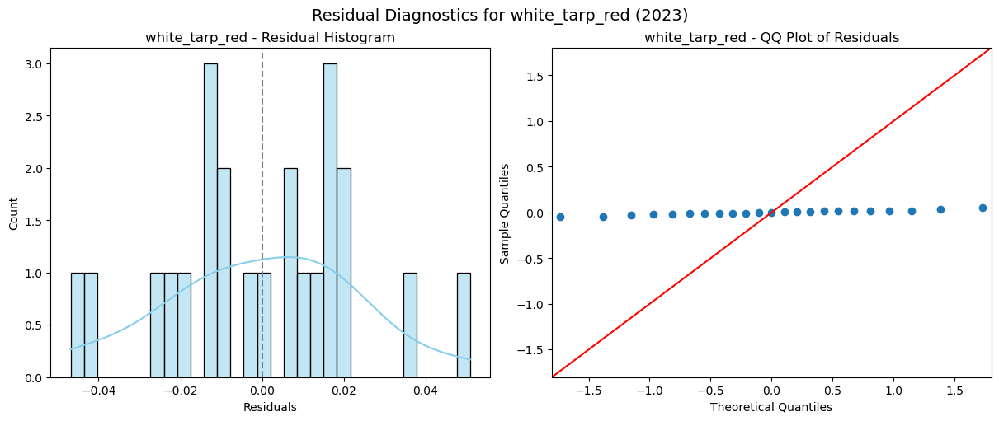

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


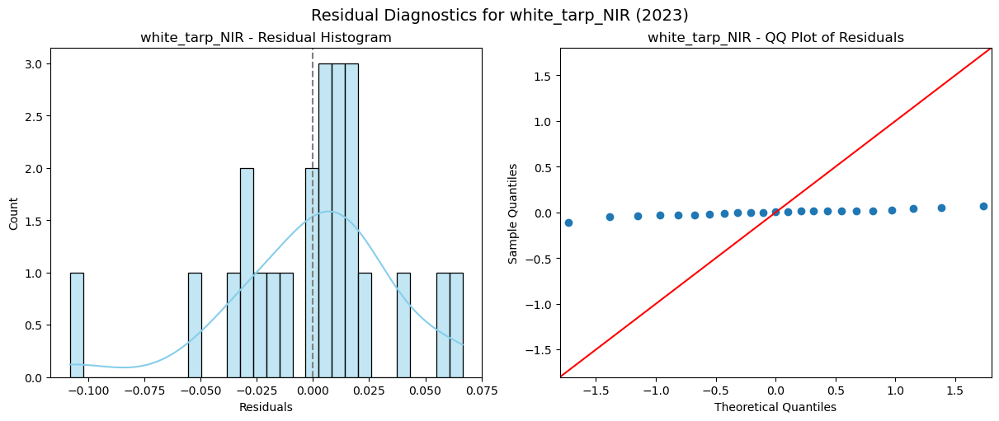

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


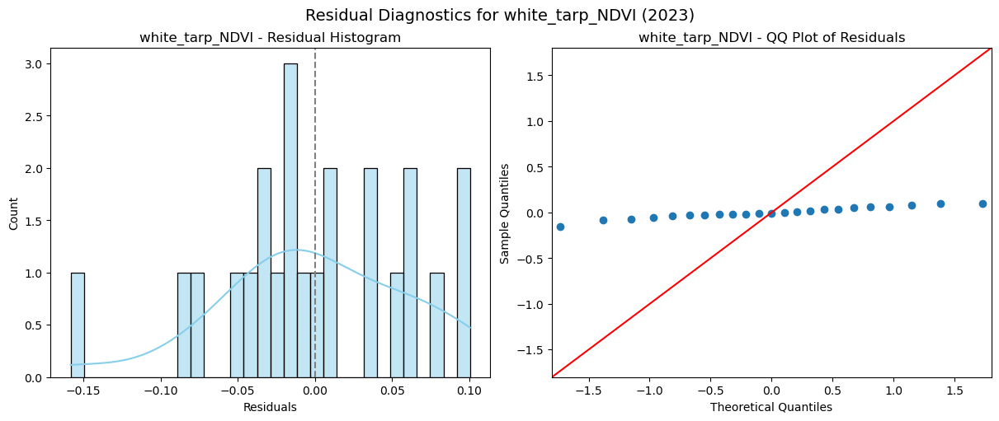

In [424]:
import matplotlib.gridspec as gridspec

custom_order = [0,1,2,3,4,5]

# Create plots for each year
for year in df_p6_scaled.year.unique():
    # Filter data for current year
    df_year = df_p6_scaled[df_p6_scaled['year'] == year]
# Create one set of histogram + QQ plot for each variable
    for col in dependent_columns:
        model = regression_results_year[col]
        X = df_year[['days_after_planting']]
        X_const = sm.add_constant(X)
        y_true = df_year[col]
        y_pred = model.predict(X_const)
        residuals = y_true - y_pred

        fig = plt.figure(constrained_layout=True, figsize=(12, 5))
        spec = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)

        # Histogram of residuals
        ax0 = fig.add_subplot(spec[0, 0])
        sns.histplot(residuals, bins=30, kde=True, ax=ax0, color='skyblue')
        ax0.axvline(0, color='gray', linestyle='--')
        ax0.set_title(f'{col} - Residual Histogram')
        ax0.set_xlabel('Residuals')

        # QQ Plot
        ax1 = fig.add_subplot(spec[0, 1])
        sm.qqplot(residuals, line='45', ax=ax1, color='purple')
        ax1.set_title(f'{col} - QQ Plot of Residuals')

        plt.suptitle(f'Residual Diagnostics for {col} ({int(year)})', fontsize=14)
        plt.show()


c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


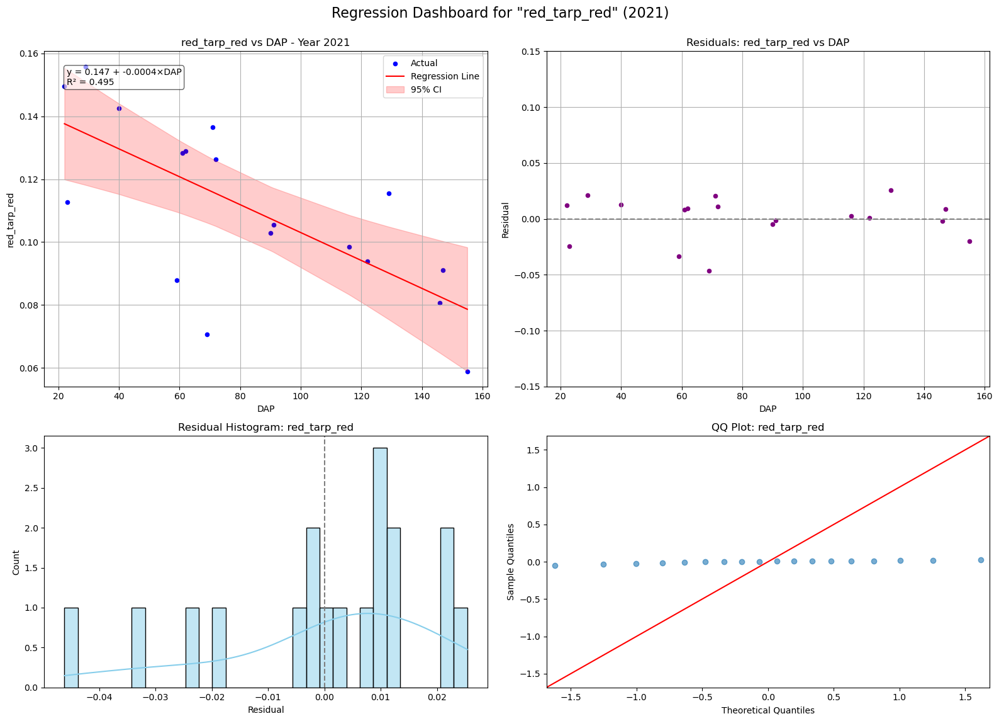

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


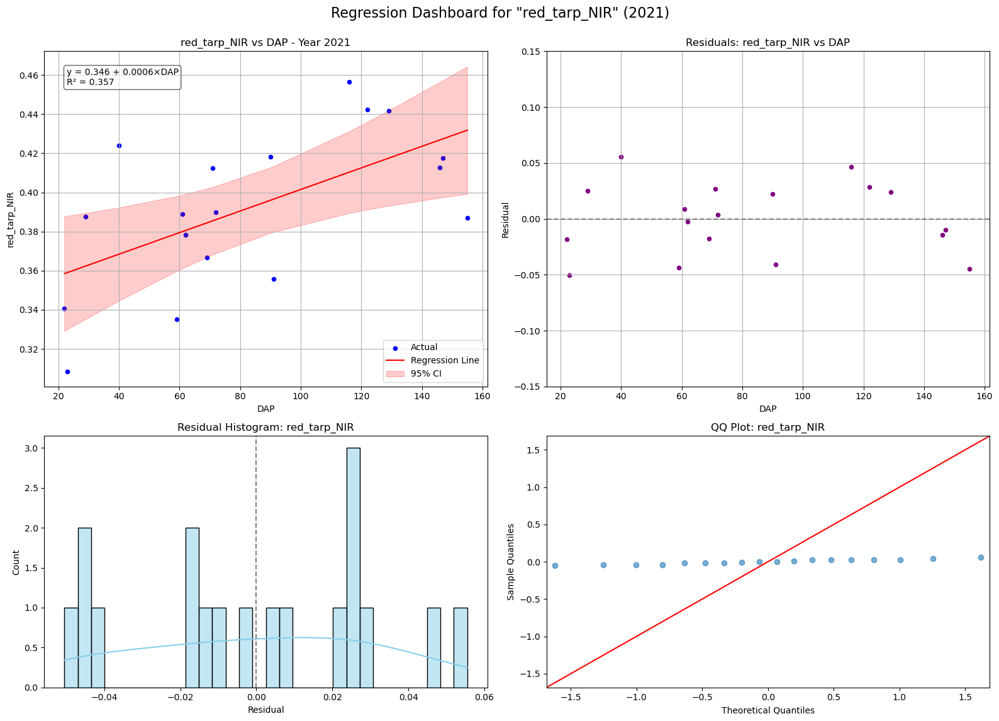

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


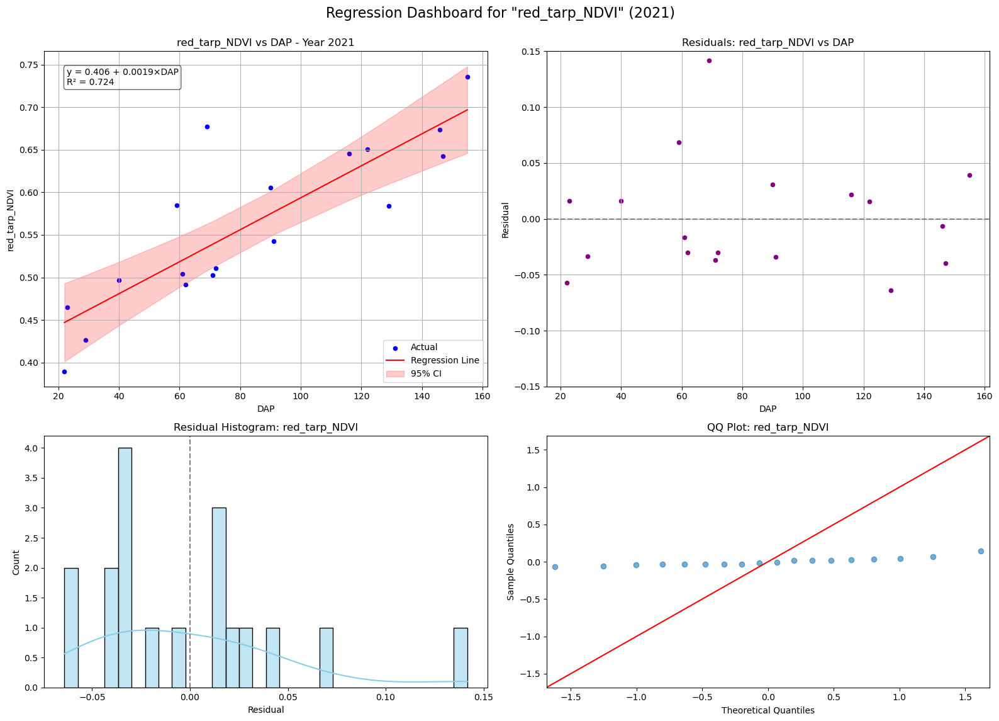

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


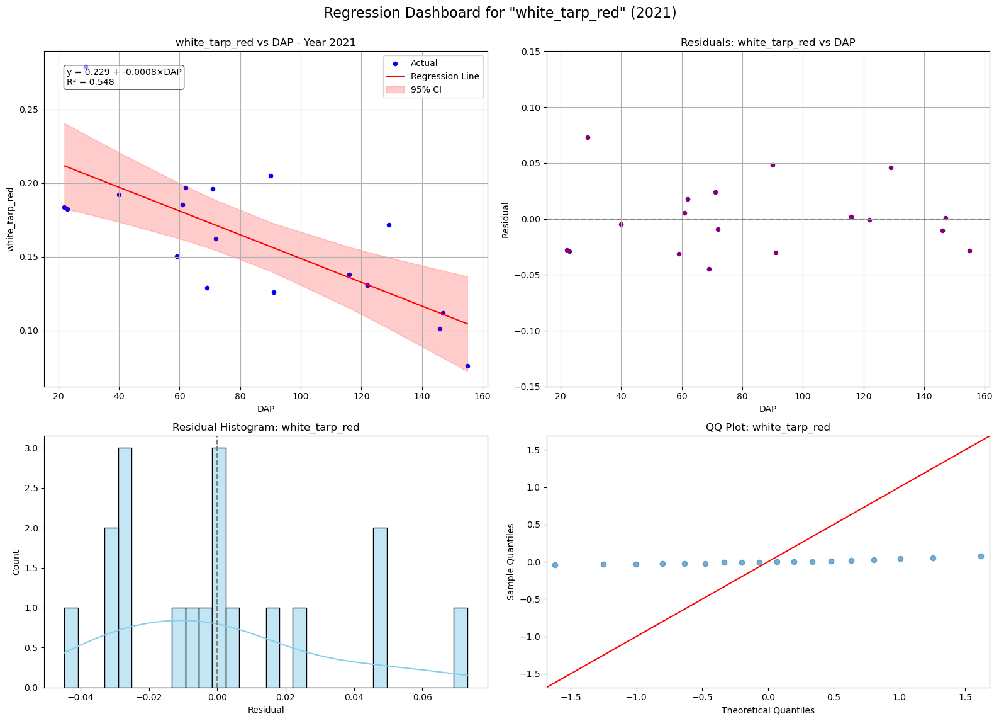

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


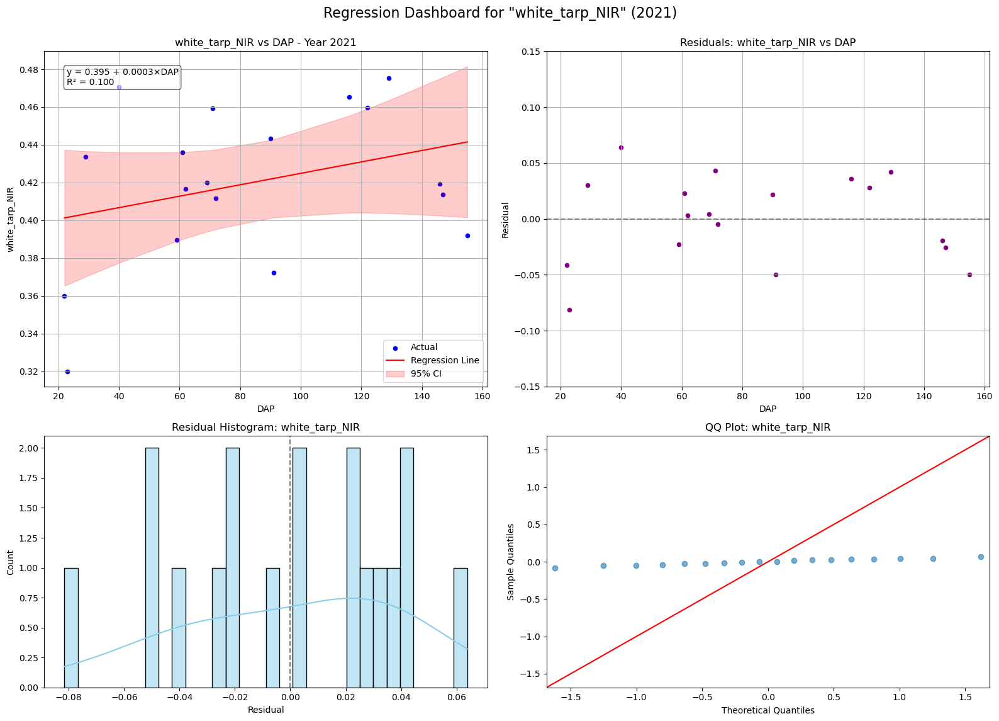

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


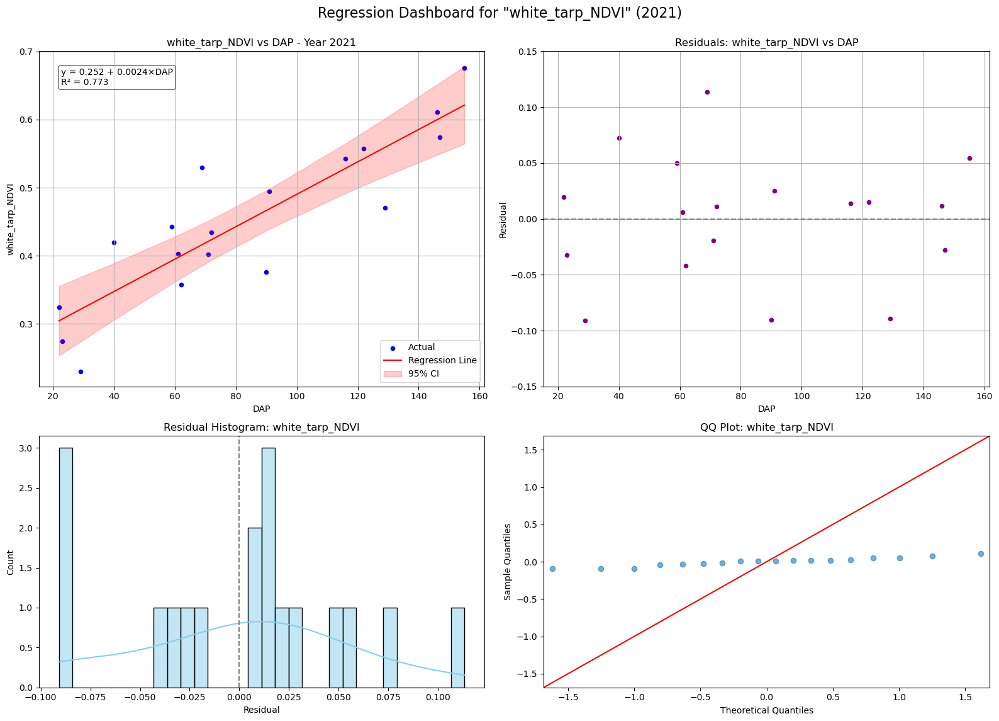

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


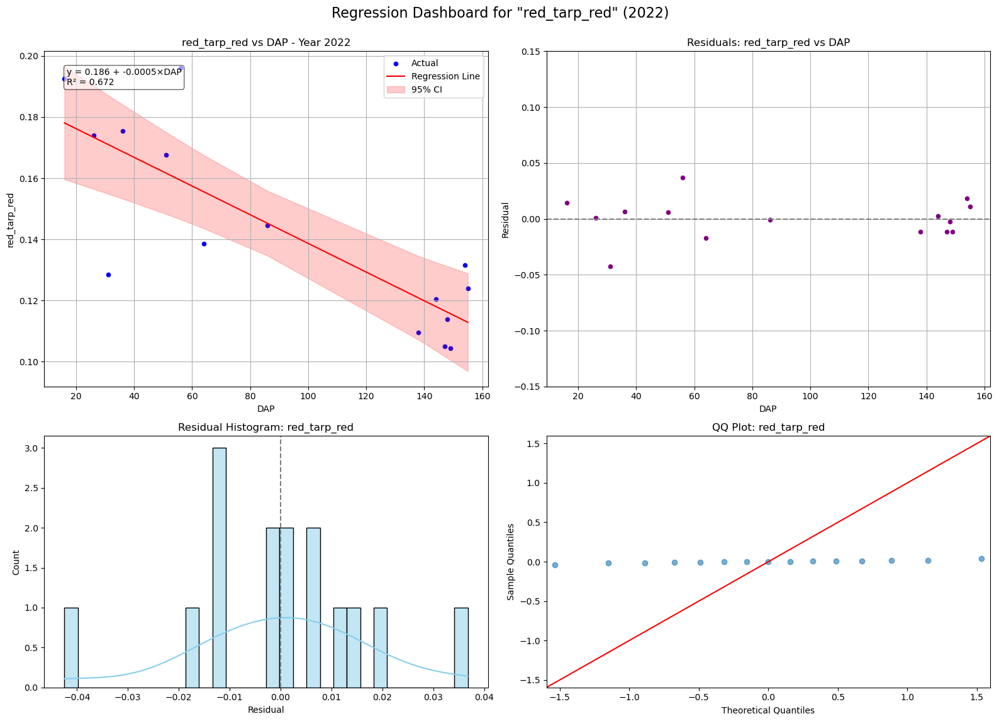

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


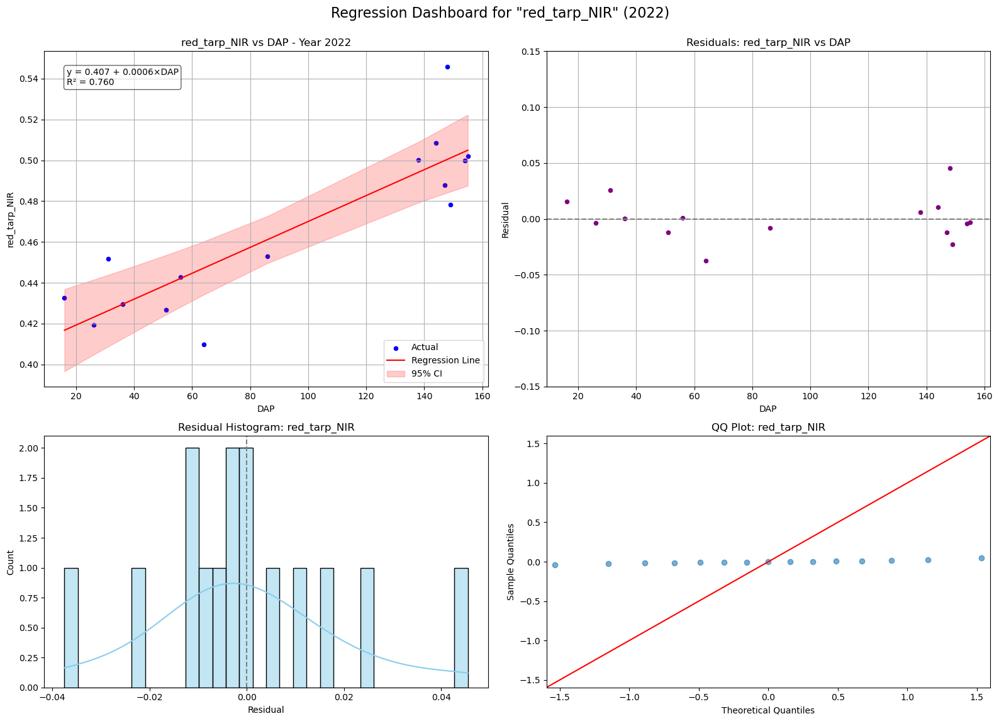

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


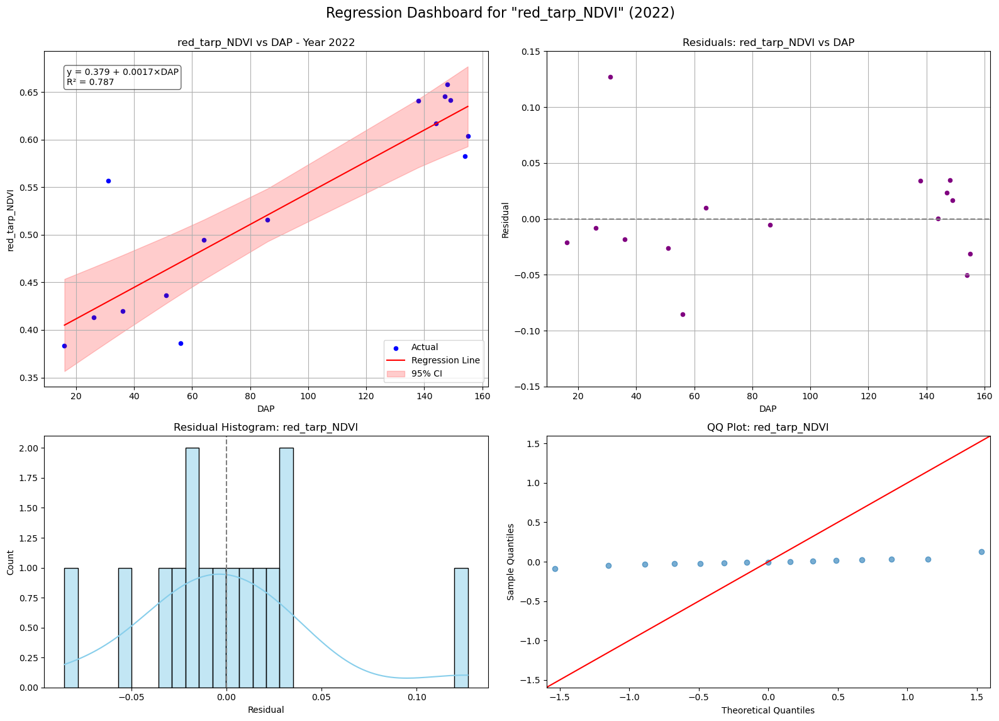

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


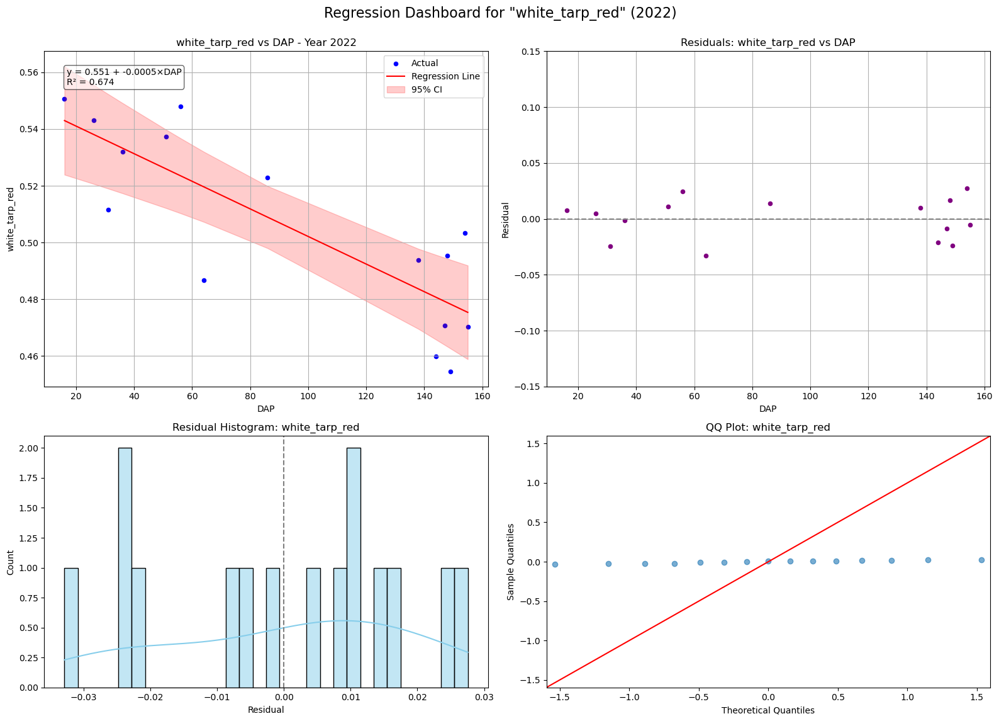

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


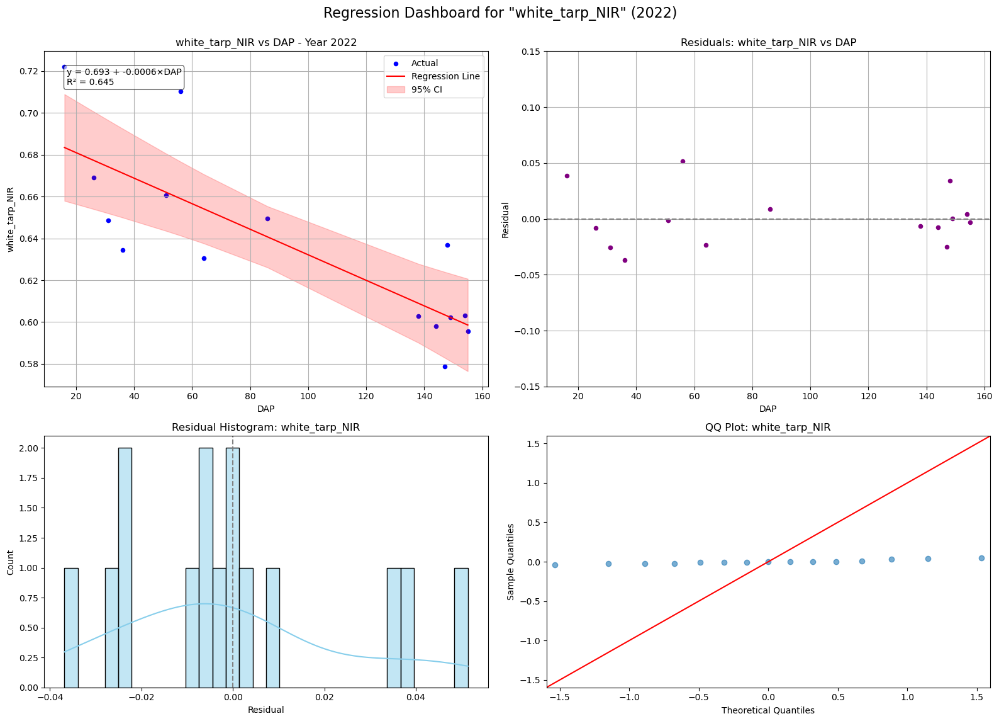

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


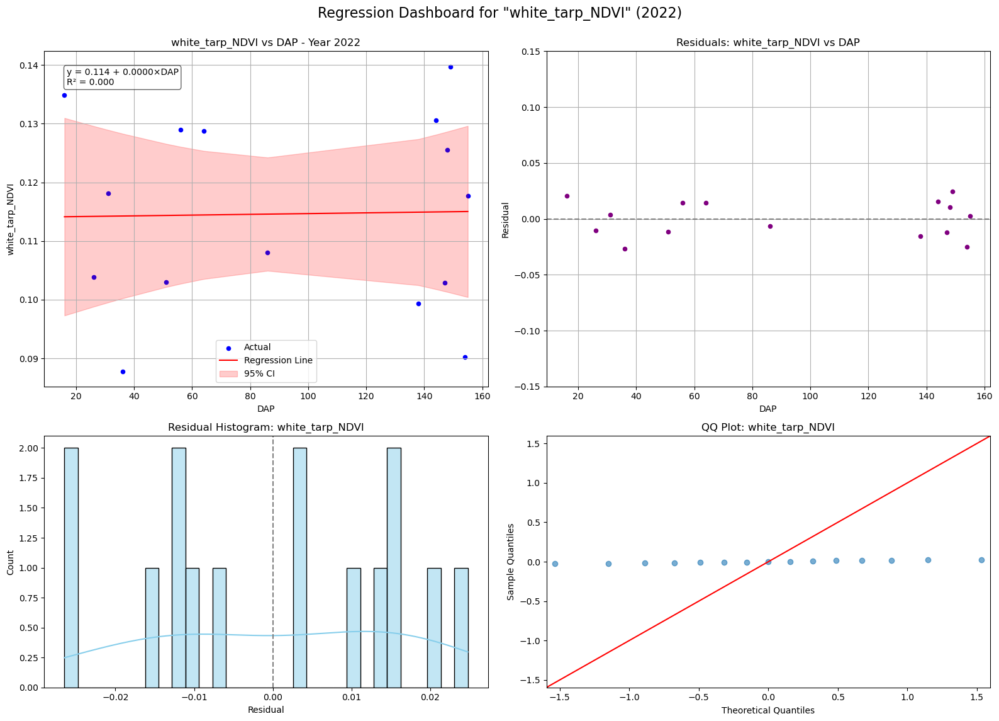

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


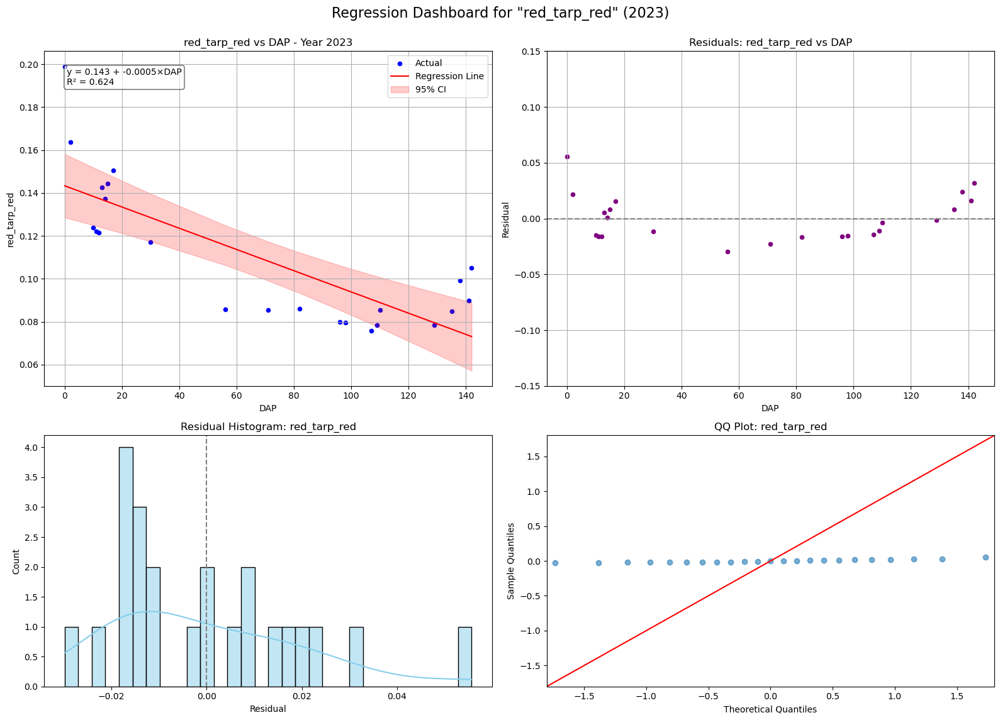

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


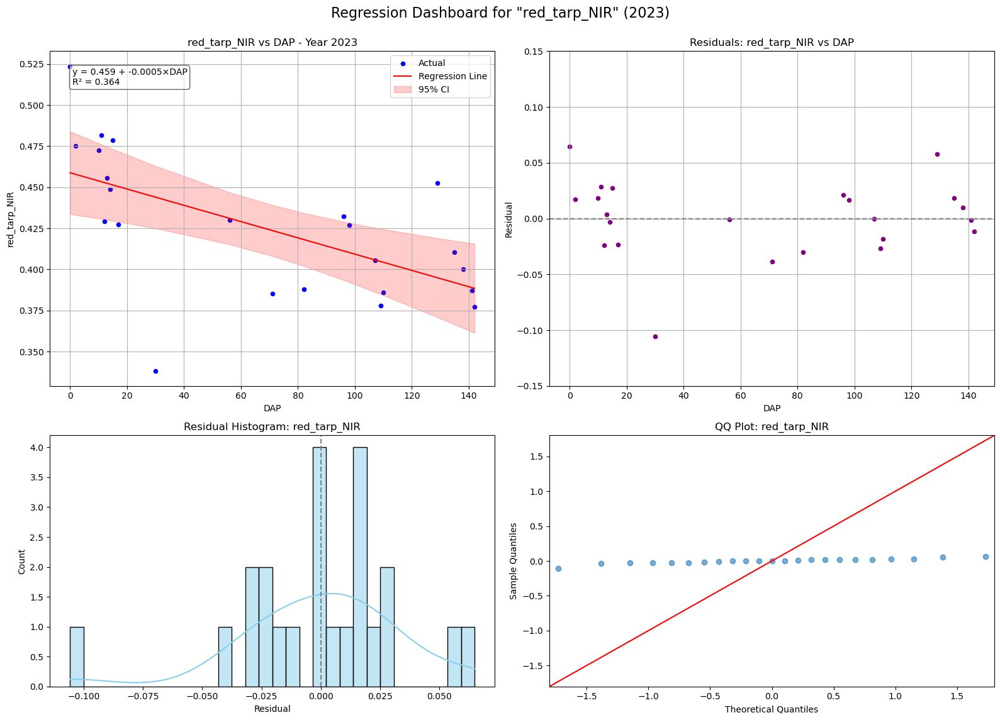

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


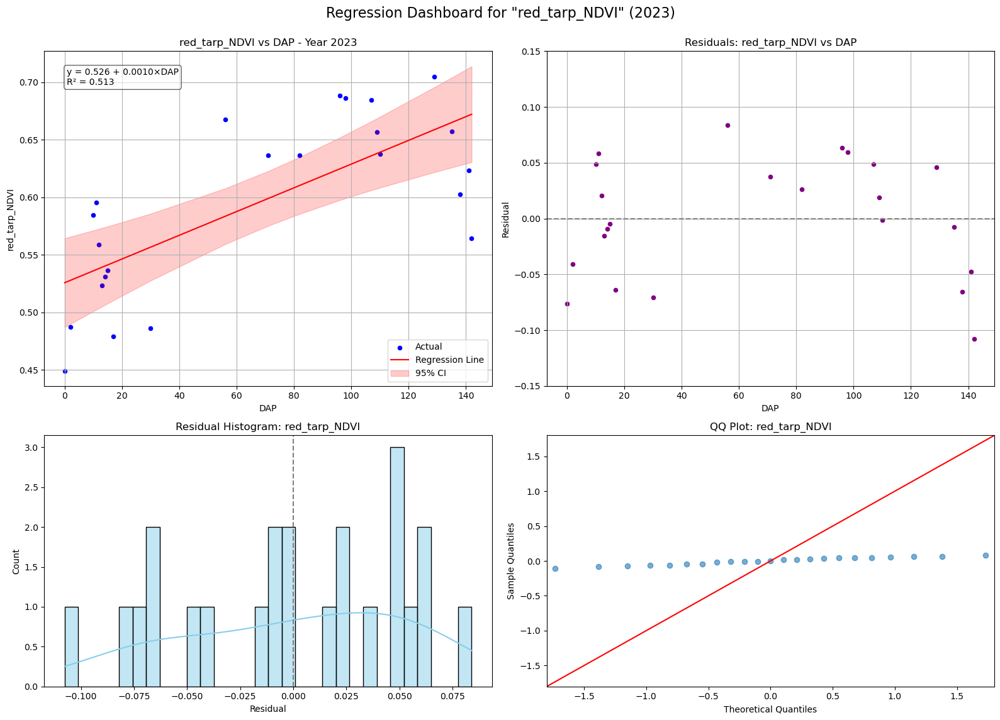

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


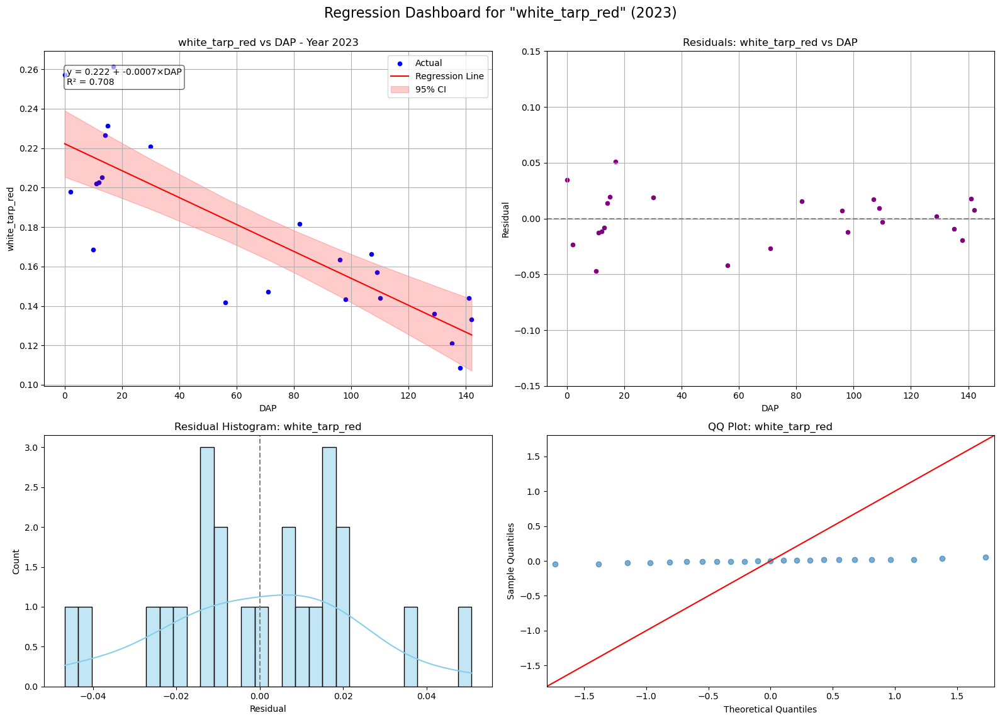

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


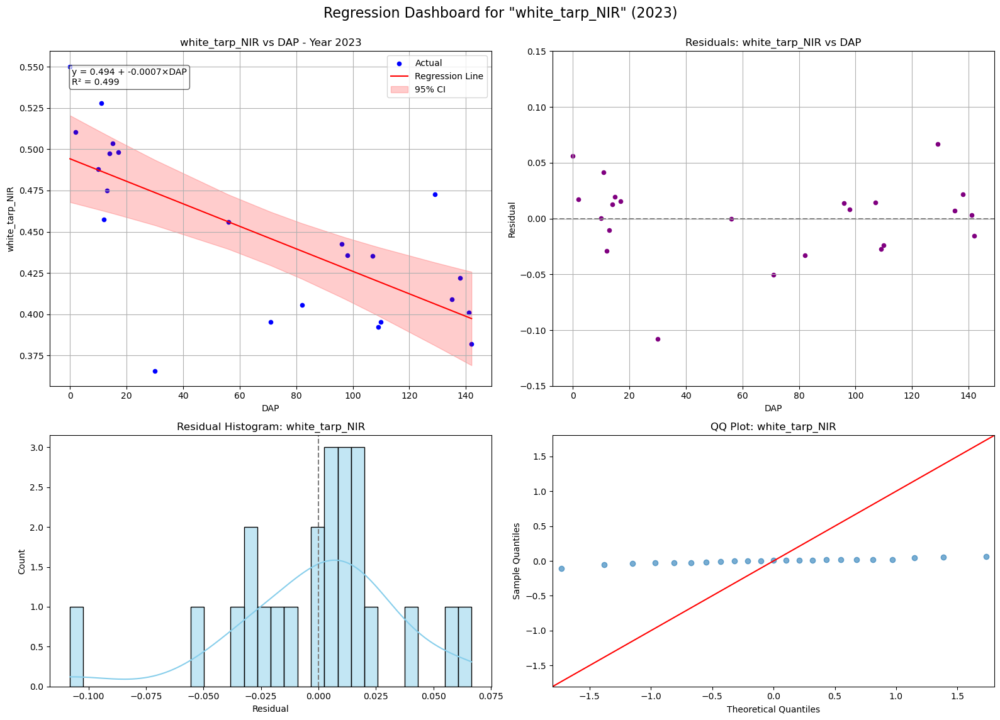

c:\Users\omkar\anaconda3\envs\gds_py\lib\site-packages\statsmodels\graphics\gofplots.py:1041: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


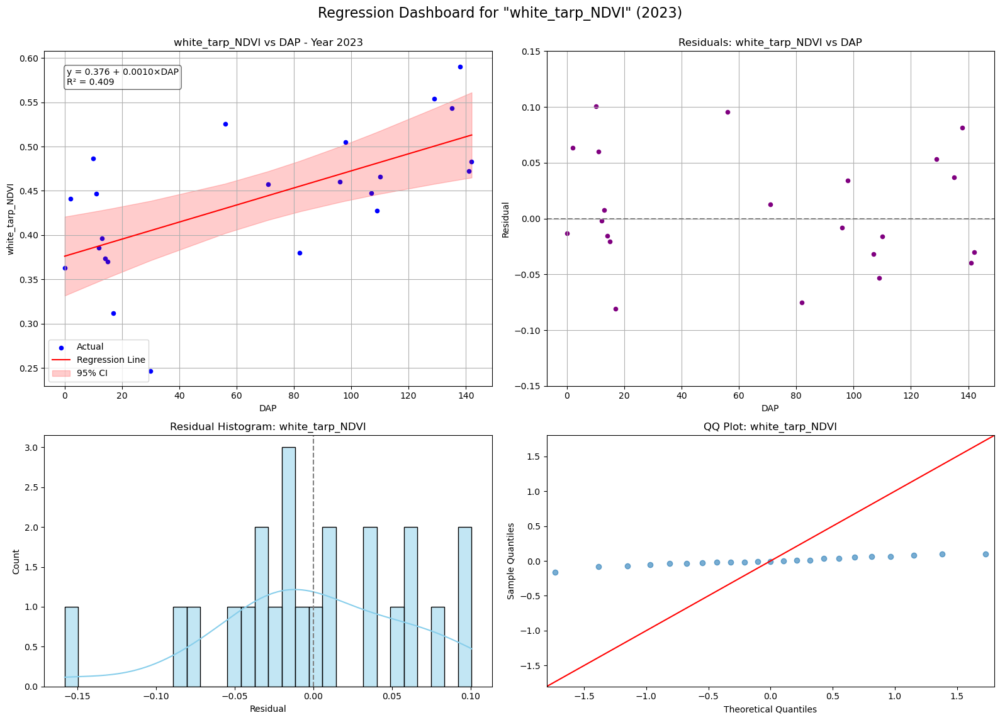

In [427]:
import matplotlib.pyplot as plt
import statsmodels.api as sm
import seaborn as sns
import numpy as np

from scipy import stats
import matplotlib.gridspec as gridspec

custom_order = [0, 1, 2, 3, 4, 5]
color_var = 'plot_size'  # or 'location'

for year in df_p6_scaled['year'].unique():
    df_year = df_p6_scaled[df_p6_scaled['year'] == year]

    # Refit models for current year
    regression_results_year = {}
    for col in dependent_columns:
        X = df_year[['days_after_planting']]
        X_const = sm.add_constant(X)
        y = df_year[col]
        model = sm.OLS(y, X_const).fit()
        regression_results_year[col] = model

    for col_idx in custom_order:
        if col_idx >= len(dependent_columns):
            continue

        col = dependent_columns[col_idx]
        model = regression_results_year[col]

        X = df_year[['days_after_planting']]
        X_const = sm.add_constant(X)
        y_true = df_year[col]
        y_pred = model.predict(X_const)
        residuals = y_true - y_pred

        # Prediction frame for confidence interval
        pred_summary = model.get_prediction(X_const).summary_frame(alpha=0.05)

        sorted_idx = df_year['days_after_planting'].argsort()
        x_sorted = df_year['days_after_planting'].iloc[sorted_idx]
        y_sorted = y_pred.iloc[sorted_idx]
        ci_lower = pred_summary['mean_ci_lower'].iloc[sorted_idx]
        ci_upper = pred_summary['mean_ci_upper'].iloc[sorted_idx]

        # === DASHBOARD LAYOUT ===
        fig = plt.figure(figsize=(16, 12))
        gs = gridspec.GridSpec(2, 2, height_ratios=[2, 1.5])

        # === 1. Regression Plot ===
        ax1 = fig.add_subplot(gs[0, 0])
        if color_var in df_year.columns:
            scatter = ax1.scatter(
                df_year['days_after_planting'], y_true,
                c=df_year[color_var], cmap='viridis', s=30, label='Actual'
            )
            cbar = plt.colorbar(scatter, ax=ax1)
            cbar.set_label(color_var)
        else:
            ax1.scatter(df_year['days_after_planting'], y_true, color='blue', s=20, label='Actual')

        ax1.plot(x_sorted, y_sorted, color='red', label='Regression Line')
        ax1.fill_between(x_sorted, ci_lower, ci_upper, color='red', alpha=0.2, label='95% CI')

        intercept = model.params['const']
        slope = model.params['days_after_planting']
        r_squared = model.rsquared
        equation = f"y = {intercept:.3f} + {slope:.4f}×DAP\nR² = {r_squared:.3f}"

        ax1.text(0.05, 0.95, equation, transform=ax1.transAxes,
                 fontsize=10, verticalalignment='top',
                 bbox=dict(boxstyle='round', facecolor='white', alpha=0.6))

        ax1.set_title(f'{col} vs DAP - Year {int(year)}')
        ax1.set_xlabel('DAP')
        ax1.set_ylabel(col)
        ax1.grid(True)
        ax1.legend()

        # === 2. Residuals Plot ===
        ax2 = fig.add_subplot(gs[0, 1])
        ax2.scatter(df_year['days_after_planting'], residuals, color='purple', s=20)
        ax2.axhline(0, color='gray', linestyle='--')
        ax2.set_ylim(-0.15, 0.15)
        ax2.set_title(f'Residuals: {col} vs DAP')
        ax2.set_xlabel('DAP')
        ax2.set_ylabel('Residual')
        ax2.grid(True)

        # === 3. Histogram of Residuals ===
        ax3 = fig.add_subplot(gs[1, 0])
        sns.histplot(residuals, bins=30, kde=True, ax=ax3, color='skyblue')
        ax3.axvline(0, color='gray', linestyle='--')
        ax3.set_title(f'Residual Histogram: {col}')
        ax3.set_xlabel('Residual')

        # === 4. QQ Plot of Residuals ===
        ax4 = fig.add_subplot(gs[1, 1])
        sm.qqplot(residuals, line='45', ax=ax4, color='black', alpha=0.6, lw=1)
        ax4.set_title(f'QQ Plot: {col}')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.suptitle(f'Regression Dashboard for "{col}" ({int(year)})', fontsize=16)
        plt.show()


In [430]:
pip install dash plotly

   ---------------------------------------- 0.0/7.9 MB ? eta -:--:--
   --------------------------------- ------ 6.6/7.9 MB 33.5 MB/s eta 0:00:01
   ---------------------------------------- 7.9/7.9 MB 32.6 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [433]:
# import dash
# from dash import dcc, html, Input, Output
# import plotly.graph_objs as go
# import statsmodels.api as sm
# import numpy as np
# import pandas as pd
# from scipy import stats

# # Load your scaled dataframe
# # df_p6_scaled = pd.read_csv(...)  # or however you're loading it

# app = dash.Dash(__name__)
# server = app.server

# # Dropdown options
# years = sorted(df_p6_scaled['year'].unique())
# dependent_columns = ['red_tarp_red', 'red_tarp_NIR', 'red_tarp_NDVI','white_tarp_red', 'white_tarp_NIR','white_tarp_NDVI']

# app.layout = html.Div([
#     html.H2("Regression Dashboard"),
#     html.Div([
#         html.Label("Select Year"),
#         dcc.Dropdown(id='year-dropdown', options=[{'label': str(y), 'value': y} for y in years], value=years[0])
#     ], style={'width': '30%', 'display': 'inline-block'}),

#     html.Div([
#         html.Label("Select Variable"),
#         dcc.Dropdown(id='var-dropdown', options=[{'label': col, 'value': col} for col in dependent_columns], value=dependent_columns[0])
#     ], style={'width': '30%', 'display': 'inline-block', 'marginLeft': '20px'}),

#     dcc.Tabs(id='tabs', value='reg', children=[
#         dcc.Tab(label='Regression Plot', value='reg'),
#         dcc.Tab(label='Residuals Plot', value='resid'),
#         dcc.Tab(label='Residual Histogram', value='hist'),
#         dcc.Tab(label='QQ Plot', value='qq'),
#     ]),
    
#     dcc.Graph(id='plot-output')
# ])

# @app.callback(
#     Output('plot-output', 'figure'),
#     Input('year-dropdown', 'value'),
#     Input('var-dropdown', 'value'),
#     Input('tabs', 'value')
# )
# def update_plot(selected_year, selected_var, selected_tab):
#     df_year = df_p6_scaled[df_p6_scaled['year'] == selected_year]
#     X = df_year[['days_after_planting']]
#     X_const = sm.add_constant(X)
#     y = df_year[selected_var]
#     model = sm.OLS(y, X_const).fit()
#     y_pred = model.predict(X_const)
#     residuals = y - y_pred

#     sorted_idx = df_year['days_after_planting'].argsort()
#     x_sorted = df_year['days_after_planting'].iloc[sorted_idx]
#     y_sorted = y_pred.iloc[sorted_idx]

#     pred = model.get_prediction(X_const).summary_frame(alpha=0.05)
#     ci_lower = pred['mean_ci_lower'].iloc[sorted_idx]
#     ci_upper = pred['mean_ci_upper'].iloc[sorted_idx]

#     if selected_tab == 'reg':
#         fig = go.Figure()
#         fig.add_trace(go.Scatter(x=df_year['days_after_planting'], y=y, mode='markers',
#                                  marker=dict(color=df_year.get('plot_size', 'blue'), showscale=True),
#                                  name='Actual'))
#         fig.add_trace(go.Scatter(x=x_sorted, y=y_sorted, mode='lines', line=dict(color='red'), name='Regression Line'))
#         fig.add_trace(go.Scatter(x=x_sorted, y=ci_upper, fill=None, mode='lines', line=dict(color='rgba(255,0,0,0.2)')))
#         fig.add_trace(go.Scatter(x=x_sorted, y=ci_lower, fill='tonexty', mode='lines',
#                                  line=dict(color='rgba(255,0,0,0.2)'), name='95% CI'))
#         fig.update_layout(title=f'{selected_var} vs DAP ({selected_year})', xaxis_title='DAP', yaxis_title=selected_var)

#     elif selected_tab == 'resid':
#         fig = go.Figure()
#         fig.add_trace(go.Scatter(x=df_year['days_after_planting'], y=residuals, mode='markers', marker=dict(color='purple')))
#         fig.add_trace(go.Scatter(x=df_year['days_after_planting'], y=[0]*len(residuals), mode='lines', line=dict(dash='dash', color='gray')))
#         fig.update_layout(title=f'Residuals for {selected_var}', xaxis_title='DAP', yaxis_title='Residual')

#     elif selected_tab == 'hist':
#         fig = go.Figure()
#         fig.add_trace(go.Histogram(x=residuals, nbinsx=30, marker_color='skyblue'))
#         fig.update_layout(title=f'Residual Histogram for {selected_var}', xaxis_title='Residuals')

#     elif selected_tab == 'qq':
#         (osm, osr), (slope, intercept, _) = stats.probplot(residuals, dist="norm", plot=None)
#         fig = go.Figure()
#         fig.add_trace(go.Scatter(x=osm, y=osr, mode='markers', name='Residuals'))
#         fig.add_trace(go.Scatter(x=osm, y=slope * osm + intercept, mode='lines', name='Line', line=dict(color='black')))
#         fig.update_layout(title=f'QQ Plot for {selected_var}', xaxis_title='Theoretical Quantiles', yaxis_title='Sample Quantiles')

#     return fig

# if __name__ == '__main__':
#     app.run(debug=True)


In [7]:
df_p6_scaled = pd.read_csv(r'D:/Capstone/Data/main_data/pixel_6_scaled.csv')
df_h_pixel = pd.read_excel(r"D:\Capstone\Hyperspectral\df_combined.xlsx")

In [8]:
df_h_pixel


,Unnamed: 0,pixel_1_red,pixel_2_red,pixel_3_red,pixel_4_red,pixel_5_red,pixel_6_red,pixel_7_red,pixel_8_red,pixel_9_red,...,pixel_9_nir,pixel_10_nir,pixel_11_nir,pixel_12_nir,pixel_13_nir,pixel_14_nir,pixel_15_nir,pixel_16_nir,pixel_17_nir,pixel_18_nir
0,20230523,0.238474,0.245802,0.233617,0.194472,0.212700,0.265596,0.262707,0.281442,0.274067,...,0.328392,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,20230602,0.170600,0.186625,0.185484,0.162342,0.172560,0.173091,0.186073,0.189304,0.201260,...,0.245567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,20230606,0.217147,0.228196,0.196701,0.195339,0.250809,0.250834,0.262883,0.283549,0.277299,...,0.383924,0.287103,0.246877,0.324359,0.368364,0.347647,0.418654,0.416343,0.386734,0.432342
3,20230620,0.082859,0.100663,0.079681,0.081173,0.081186,0.103259,0.136565,0.147794,0.194718,...,0.348507,0.250256,0.316074,0.353885,0.315109,0.379478,0.459858,0.401285,0.378342,0.346099
4,20230622,0.084582,0.130085,0.083672,0.106261,0.103045,0.101662,0.083702,0.145573,0.167209,...,0.300876,0.243358,0.249863,0.260652,0.217686,0.201416,0.209332,0.281811,0.248129,0.264224
5,20230706,0.034609,0.040765,0.032778,0.037875,0.031077,0.036478,0.034402,0.035823,0.041788,...,0.495532,0.324234,0.202282,0.318317,0.305132,0.323811,0.338600,0.335337,0.262171,0.302086
6,20230711,0.024148,0.024784,0.022190,0.020179,0.024733,0.021837,0.020783,0.030486,0.031786,...,0.516853,0.334184,0.317361,0.317361,0.379188,0.360963,0.404051,0.375764,0.333001,0.344267
7,20230713,0.023898,0.025818,0.026367,0.028356,0.021822,0.025564,0.030257,0.042234,0.043010,...,0.845680,0.376642,0.459460,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,20230719,0.034709,0.039206,0.037724,0.033714,0.036888,0.027928,0.029985,0.026575,0.031231,...,0.577968,0.488177,0.536011,0.399746,0.578821,0.476492,0.486720,0.446187,0.394173,0.408900
9,20230726,0.034941,0.044422,0.039202,0.031603,0.038481,0.028029,0.033100,0.031047,0.031214,...,0.574311,0.509793,0.500733,0.421203,0.481136,NaN,NaN,NaN,NaN,NaN


In [9]:
df_p6_scaled_2023 = df_p6_scaled[df_p6_scaled['year'] == 2023].copy()

In [10]:
df_p6_scaled_2023

,date,year,pixel_6_NDVI,red_tarp_NDVI,white_tarp_NDVI,days_after_planting,pixel_6_red,pixel_6_NIR,red_tarp_red,white_tarp_red,red_tarp_NIR,white_tarp_NIR
33,2023-05-16,2023.0,0.262583,0.449211,0.363141,0.0,0.000016,0.000028,0.000020,0.000026,0.000052,0.000055
34,2023-05-18,2023.0,0.339088,0.487163,0.441322,2.0,0.000013,0.000027,0.000016,0.000020,0.000048,0.000051
35,2023-05-26,2023.0,0.296660,0.584590,0.486403,10.0,0.000015,0.000027,0.000012,0.000017,0.000047,0.000049
36,2023-05-27,2023.0,0.304582,0.595419,0.446850,11.0,0.000015,0.000028,0.000012,0.000020,0.000048,0.000053
37,2023-05-28,2023.0,0.300447,0.558860,0.385974,12.0,0.000014,0.000026,0.000012,0.000020,0.000043,0.000046
38,2023-05-29,2023.0,0.304124,0.523516,0.396422,13.0,0.000015,0.000028,0.000014,0.000021,0.000046,0.000047
39,2023-05-30,2023.0,0.296237,0.530978,0.373953,14.0,0.000016,0.000029,0.000014,0.000023,0.000045,0.000050
40,2023-05-31,2023.0,0.321008,0.536437,0.370154,15.0,0.000015,0.000029,0.000014,0.000023,0.000048,0.000050
41,2023-06-02,2023.0,0.254122,0.479224,0.311570,17.0,0.000017,0.000028,0.000015,0.000026,0.000043,0.000050
42,2023-06-15,2023.0,0.462293,0.486053,0.246846,30.0,0.000008,0.000022,0.000012,0.000022,0.000034,0.000037


In [11]:
df_h_pixel['pixel_6_h_ndvi'] = (df_h_pixel['pixel_6_nir'] - df_h_pixel['pixel_6_red'])/ (df_h_pixel['pixel_6_nir'] + df_h_pixel['pixel_6_red'])

In [12]:
df_h_pixel

,Unnamed: 0,pixel_1_red,pixel_2_red,pixel_3_red,pixel_4_red,pixel_5_red,pixel_6_red,pixel_7_red,pixel_8_red,pixel_9_red,...,pixel_10_nir,pixel_11_nir,pixel_12_nir,pixel_13_nir,pixel_14_nir,pixel_15_nir,pixel_16_nir,pixel_17_nir,pixel_18_nir,pixel_6_h_ndvi
0,20230523,0.238474,0.245802,0.233617,0.194472,0.212700,0.265596,0.262707,0.281442,0.274067,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.097729
1,20230602,0.170600,0.186625,0.185484,0.162342,0.172560,0.173091,0.186073,0.189304,0.201260,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.132595
2,20230606,0.217147,0.228196,0.196701,0.195339,0.250809,0.250834,0.262883,0.283549,0.277299,...,0.287103,0.246877,0.324359,0.368364,0.347647,0.418654,0.416343,0.386734,0.432342,0.208185
3,20230620,0.082859,0.100663,0.079681,0.081173,0.081186,0.103259,0.136565,0.147794,0.194718,...,0.250256,0.316074,0.353885,0.315109,0.379478,0.459858,0.401285,0.378342,0.346099,0.419410
4,20230622,0.084582,0.130085,0.083672,0.106261,0.103045,0.101662,0.083702,0.145573,0.167209,...,0.243358,0.249863,0.260652,0.217686,0.201416,0.209332,0.281811,0.248129,0.264224,0.477401
5,20230706,0.034609,0.040765,0.032778,0.037875,0.031077,0.036478,0.034402,0.035823,0.041788,...,0.324234,0.202282,0.318317,0.305132,0.323811,0.338600,0.335337,0.262171,0.302086,0.884290
6,20230711,0.024148,0.024784,0.022190,0.020179,0.024733,0.021837,0.020783,0.030486,0.031786,...,0.334184,0.317361,0.317361,0.379188,0.360963,0.404051,0.375764,0.333001,0.344267,0.911712
7,20230713,0.023898,0.025818,0.026367,0.028356,0.021822,0.025564,0.030257,0.042234,0.043010,...,0.376642,0.459460,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.913091
8,20230719,0.034709,0.039206,0.037724,0.033714,0.036888,0.027928,0.029985,0.026575,0.031231,...,0.488177,0.536011,0.399746,0.578821,0.476492,0.486720,0.446187,0.394173,0.408900,0.899013
9,20230726,0.034941,0.044422,0.039202,0.031603,0.038481,0.028029,0.033100,0.031047,0.031214,...,0.509793,0.500733,0.421203,0.481136,NaN,NaN,NaN,NaN,NaN,0.905247


In [13]:
df_h_pixel.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11 entries, 0 to 10
Data columns (total 38 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      11 non-null     int64  
 1   pixel_1_red     11 non-null     float64
 2   pixel_2_red     11 non-null     float64
 3   pixel_3_red     11 non-null     float64
 4   pixel_4_red     11 non-null     float64
 5   pixel_5_red     11 non-null     float64
 6   pixel_6_red     11 non-null     float64
 7   pixel_7_red     11 non-null     float64
 8   pixel_8_red     11 non-null     float64
 9   pixel_9_red     11 non-null     float64
 10  pixel_10_red    9 non-null      float64
 11  pixel_11_red    9 non-null      float64
 12  pixel_12_red    8 non-null      float64
 13  pixel_13_red    8 non-null      float64
 14  pixel_14_red    7 non-null      float64
 15  pixel_15_red    7 non-null      float64
 16  pixel_16_red    7 non-null      float64
 17  pixel_17_red    7 non-null      float

In [14]:
import pandas as pd

# 1. Convert df_h_pixel['Unnamed: 0'] to datetime and compute DAP
planting_date = pd.to_datetime("2023-05-16")
df_h_pixel['Unnamed: 0'] = pd.to_datetime(df_h_pixel['Unnamed: 0'].astype(str), format='%Y%m%d')
df_h_pixel['dap_from_h_pixel'] = (df_h_pixel['Unnamed: 0'] - planting_date).dt.days

# 2. Reset index to align Series properly
dap_from_h_pixel = df_h_pixel['dap_from_h_pixel'].reset_index(drop=True)
pixel_6_h_ndvi = df_h_pixel['pixel_6_h_ndvi'].reset_index(drop=True)
dap_from_p6_scaled = df_p6_scaled_2023['days_after_planting'].reset_index(drop=True)
pixel_6_ndvi = df_p6_scaled_2023['pixel_6_NDVI'].reset_index(drop=True)
red_tarp_ndvi = df_p6_scaled_2023['red_tarp_NDVI'].reset_index(drop=True)
white_tarp_ndvi = df_p6_scaled_2023['white_tarp_NDVI'].reset_index(drop=True)
# 3. Determine max length to pad shorter columns
max_len = max(len(dap_from_h_pixel), len(pixel_6_h_ndvi), len(dap_from_p6_scaled), len(pixel_6_ndvi))

# 4. Reindex all to the same length (pads with NaN where needed)
dap_from_h_pixel = dap_from_h_pixel.reindex(range(max_len))
pixel_6_h_ndvi = pixel_6_h_ndvi.reindex(range(max_len))
dap_from_p6_scaled = dap_from_p6_scaled.reindex(range(max_len))
pixel_6_ndvi = pixel_6_ndvi.reindex(range(max_len))
red_tarp_ndvi = red_tarp_ndvi.reindex(range(max_len))
white_tarp_ndvi = white_tarp_ndvi.reindex(range(max_len))

# 5. Create final DataFrame
df_dtw = pd.DataFrame({
    'dap_from_h_pixel': dap_from_h_pixel,
    'pixel_6_h_ndvi': pixel_6_h_ndvi,
    'dap_from_p6_scaled': dap_from_p6_scaled,
    'pixel_6_ndvi': pixel_6_ndvi,
    'red_tarp_ndvi': red_tarp_ndvi,
    'white_tarp_ndvi': white_tarp_ndvi
})


In [15]:
df_p6_scaled_2023

,date,year,pixel_6_NDVI,red_tarp_NDVI,white_tarp_NDVI,days_after_planting,pixel_6_red,pixel_6_NIR,red_tarp_red,white_tarp_red,red_tarp_NIR,white_tarp_NIR
33,2023-05-16,2023.0,0.262583,0.449211,0.363141,0.0,0.000016,0.000028,0.000020,0.000026,0.000052,0.000055
34,2023-05-18,2023.0,0.339088,0.487163,0.441322,2.0,0.000013,0.000027,0.000016,0.000020,0.000048,0.000051
35,2023-05-26,2023.0,0.296660,0.584590,0.486403,10.0,0.000015,0.000027,0.000012,0.000017,0.000047,0.000049
36,2023-05-27,2023.0,0.304582,0.595419,0.446850,11.0,0.000015,0.000028,0.000012,0.000020,0.000048,0.000053
37,2023-05-28,2023.0,0.300447,0.558860,0.385974,12.0,0.000014,0.000026,0.000012,0.000020,0.000043,0.000046
38,2023-05-29,2023.0,0.304124,0.523516,0.396422,13.0,0.000015,0.000028,0.000014,0.000021,0.000046,0.000047
39,2023-05-30,2023.0,0.296237,0.530978,0.373953,14.0,0.000016,0.000029,0.000014,0.000023,0.000045,0.000050
40,2023-05-31,2023.0,0.321008,0.536437,0.370154,15.0,0.000015,0.000029,0.000014,0.000023,0.000048,0.000050
41,2023-06-02,2023.0,0.254122,0.479224,0.311570,17.0,0.000017,0.000028,0.000015,0.000026,0.000043,0.000050
42,2023-06-15,2023.0,0.462293,0.486053,0.246846,30.0,0.000008,0.000022,0.000012,0.000022,0.000034,0.000037


In [16]:
df_dtw.columns

Index(['dap_from_h_pixel', 'pixel_6_h_ndvi', 'dap_from_p6_scaled',
       'pixel_6_ndvi', 'red_tarp_ndvi', 'white_tarp_ndvi'],
      dtype='object')

In [17]:
# pip install fastdtw

In [18]:
# from fastdtw import fastdtw
# from scipy.spatial.distance import euclidean
# import numpy as np

# # Step 1: Drop NaNs

# # Step 2: Convert to list or numpy array

# x = df_dtw['pixel_6_h_ndvi'].values.ravel()
# y = df_dtw['pixel_6_ndvi'].values.ravel()

# x = x[~np.isnan(x)]
# # Step 3: Compute DTW distance and path
# distance, path = fastdtw(x, y, dist=euclidean)

# print(f"DTW Distance: {distance}")
# # path is a list of tuples: (index_in_x, index_in_y)


In [19]:
# pip install dtaidistance


In [22]:
from sklearn.linear_model import LinearRegression
import numpy as np

dependent_columns = ['red_tarp_ndvi', 'white_tarp_ndvi']
# Add residuals for each dependent column to df_scaled
for col in dependent_columns:
    X = df_dtw[['dap_from_p6_scaled']]
    
    y_true = df_dtw[col]
     # --- 2. Define and Fit the Model (This was the missing part) ---
    # Create an instance of the Linear Regression model
    model = LinearRegression()
    
    # Fit the model to your data. This trains the model.
    model.fit(X, y_true)
    
    y_pred = model.predict(X)
    residuals = y_true - y_pred
    
    df_dtw[f'{col}_resid'] = residuals




In [23]:
df_dtw

,dap_from_h_pixel,pixel_6_h_ndvi,dap_from_p6_scaled,pixel_6_ndvi,red_tarp_ndvi,white_tarp_ndvi,red_tarp_ndvi_resid,white_tarp_ndvi_resid
0,7.0,0.097729,0.0,0.262583,0.449211,0.363141,-0.076507,-0.013027
1,17.0,0.132595,2.0,0.339088,0.487163,0.441322,-0.040617,0.063227
2,21.0,0.208185,10.0,0.296660,0.584590,0.486403,0.048561,0.100599
3,35.0,0.419410,11.0,0.304582,0.595419,0.446850,0.058358,0.060083
4,37.0,0.477401,12.0,0.300447,0.558860,0.385974,0.020769,-0.001757
5,51.0,0.884290,13.0,0.304124,0.523516,0.396422,-0.015606,0.007728
6,56.0,0.911712,14.0,0.296237,0.530978,0.373953,-0.009176,-0.015705
7,58.0,0.913091,15.0,0.321008,0.536437,0.370154,-0.004748,-0.020467
8,64.0,0.899013,17.0,0.254122,0.479224,0.311570,-0.064022,-0.080978
9,71.0,0.905247,30.0,0.462293,0.486053,0.246846,-0.070598,-0.158228


In [24]:
# Subtract residuals from pixel_6_ndvi
df_dtw['pixel_6_ndvi_minus_red_residual'] = df_dtw['pixel_6_ndvi'] - df_dtw['red_tarp_ndvi_resid']
df_dtw['pixel_6_ndvi_minus_white_residual'] = df_dtw['pixel_6_ndvi'] - df_dtw['white_tarp_ndvi_resid']

# Add residuals to pixel_6_ndvi
df_dtw['pixel_6_ndvi_plus_red_residual'] = df_dtw['pixel_6_ndvi'] + df_dtw['red_tarp_ndvi_resid']
df_dtw['pixel_6_ndvi_plus_white_residual'] = df_dtw['pixel_6_ndvi'] + df_dtw['white_tarp_ndvi_resid']

In [25]:
from dtaidistance import dtw

# Prepare your data — drop NaNs and align
# valid_df = df_dtw[['pixel_6_h_ndvi', 'pixel_6_ndvi']].dropna()
dtw_columns = [ 'pixel_6_ndvi','pixel_6_ndvi_plus_red_residual', 'pixel_6_ndvi_minus_red_residual',
                'pixel_6_ndvi_plus_white_residual', 'pixel_6_ndvi_minus_white_residual']
for col in dtw_columns:
    x = df_dtw['pixel_6_h_ndvi'].dropna().values
    y = df_dtw[col].dropna().values
    
    # Compute DTW distance
    distance = dtw.distance(x, y)

    print(f"DTW Distance for {col} : {distance}")

    # Optional: Get the warping path
    path = dtw.warping_path(x, y)
    print(f"Warping path length for {col} : {len(path)}")


DTW Distance for pixel_6_ndvi : 0.6090976535715958
Warping path length for pixel_6_ndvi : 26
DTW Distance for pixel_6_ndvi_plus_red_residual : 0.6966896727768689
Warping path length for pixel_6_ndvi_plus_red_residual : 25
DTW Distance for pixel_6_ndvi_minus_red_residual : 0.6063615737110427
Warping path length for pixel_6_ndvi_minus_red_residual : 24
DTW Distance for pixel_6_ndvi_plus_white_residual : 0.6861138868723293
Warping path length for pixel_6_ndvi_plus_white_residual : 26
DTW Distance for pixel_6_ndvi_minus_white_residual : 0.6320227019067362
Warping path length for pixel_6_ndvi_minus_white_residual : 24


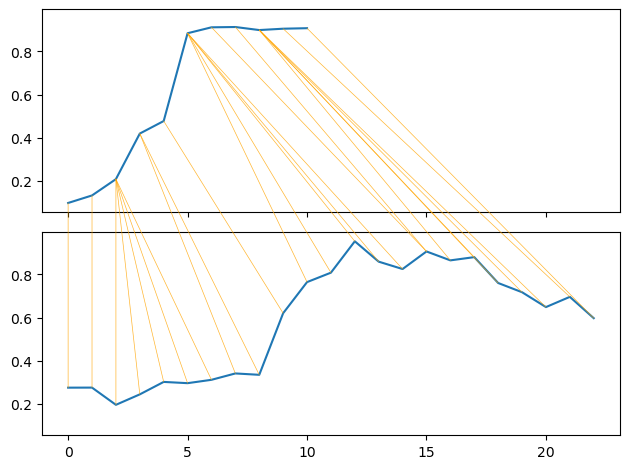

In [26]:
from dtaidistance import dtw_visualisation as dtwvis
import matplotlib.pyplot as plt

dtwvis.plot_warping(x, y, path)
plt.show()


In [27]:
df_dtw.to_csv(r"D:\Capstone\Data\tarp_modelling_data\df_dtw.csv")